<a href="https://colab.research.google.com/github/piziomo/Data-Science-GenAI-ML-Projects/blob/main/EV%20Charging%20Forecast%20and%20Optimisation/EV%20Charging%20Forecast%20and%20Optimisation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Appendix E: Full Implementation Code**

## **Project Title:**
**A Socio-Technical Framework for Uncertainty-Aware, Forecast-Informed Optimisation of the Public EV Charging Network.**

Project Description:
This appendix contains the complete Python script used to implement the Socio-Technical Uncertainty-Aware Optimisation Framework (ST-UOF) detailed in this dissertation. The code is structured to follow the methodological pipeline, beginning with data loading and pre-processing, followed by the training and evaluation of machine learning forecasting models, and concluding with the forecast-informed linear programming optimisation.

The primary goal of this codebase is to translate historical EV charging data from Perth and Kinross Council into a cost-optimal, 24-hour charging schedule that respects real-world operational constraints. Key libraries used include Pandas for data manipulation, Scikit-learn and XGBoost for machine learning, Optuna for hyperparameter tuning, and PuLP for the optimisation.

# **This Python notebook implements the end-to-end data science pipeline for the dissertation, covering data cleaning, feature engineering, the training and evaluation of multiple forecasting models, and the final forecast-informed optimisation simulation.**

## Step 1: Mount Google Drive
This initial step connects the Google Colab notebook to the user's personal Google Drive, allowing the script to access datasets or other necessary files stored there.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Description:

This is a standard procedure for working with files in a Colab environment. The first line imports the necessary drive module from the google.colab library. The drive.mount() function then executes the mounting process. When run, it prompts the user with a URL to authorize access. Once the authorization code is provided, the user's Google Drive becomes accessible within the Colab environment at the path /content/drive.

In [ ]:
# Step 1: Import required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings

# Suppress warnings for cleaner output
warnings.filterwarnings('ignore')

# Optional: Set pandas display options for easier inspection
pd.set_option('display.max_columns', 50)
pd.set_option('display.width', 120)

Data Loading and Initial Inspection

Explanation:

Loads the dataset.

Prints essential information to help you understand the raw data and spot obvious problems early (e.g. missing values, unexpected types).

In [ ]:
# Step 2: Load Data and Initial Inspection
csv_path = "/content/drive/MyDrive/CIM/Dissertation/Data/PKC_EVChargeStationUse_Sept2016toAug2019.csv"

# Read CSV into a DataFrame
df = pd.read_csv(csv_path)

# Initial inspection
print("Shape of dataset:", df.shape)
print("\nFirst five rows:")
df.head()

Shape of dataset: (55878, 10)

First five rows:


,ID,CP ID,Connector,Start Date,Start Time,End Date,End Time,Total kWh,Site,Model
0,1,51516,2,2019-08-31 0:00:00,23:26,2019-08-31 0:00:00,23:54,12.780,"Kinross Park and Ride, Kinross",APT Triple Rapid Charger
1,2,51249,1,2019-08-31 0:00:00,21:12,2019-08-31 0:00:00,21:32,5.700,"Atholl Street Car Park, Dunkeld",Siemens Triple Rapid Charger
2,3,50995,2,2019-08-31 0:00:00,20:26,2019-08-31 0:00:00,21:20,27.680,"Moness Terrace Car Park, Aberfeldy",APT Triple Rapid Charger
3,4,50839,1,2019-08-31 0:00:00,20:06,2019-08-31 0:00:00,23:03,17.526,"Mill Street, Perth",APT 22kW Raption
4,5,50745,2,2019-08-31 0:00:00,19:43,2019-08-31 0:00:00,20:23,12.930,"Kinross Park and Ride, Kinross",APT Triple Rapid Charger


In [ ]:

# Initial inspection
print("\nColumn names:", df.columns.tolist())
print("\nData types and missing values:")
df.info()
print("\nSummary statistics:")
df.describe()


Column names: ['ID', 'CP ID', 'Connector', 'Start Date', 'Start Time', 'End Date', 'End Time', 'Total kWh', 'Site', 'Model']

Data types and missing values:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 55878 entries, 0 to 55877
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   ID          55878 non-null  int64  
 1   CP ID       55878 non-null  int64  
 2   Connector   55878 non-null  int64  
 3   Start Date  55878 non-null  object 
 4   Start Time  55878 non-null  object 
 5   End Date    55716 non-null  object 
 6   End Time    55716 non-null  object 
 7   Total kWh   55716 non-null  float64
 8   Site        55878 non-null  object 
 9   Model       55878 non-null  object 
dtypes: float64(1), int64(3), object(6)
memory usage: 4.3+ MB

Summary statistics:


,ID,CP ID,Connector,Total kWh
count,55878.000000,55878.000000,55878.000000,55716.000000
mean,27939.500000,50836.745320,1.732614,10.741379
std,16130.733508,467.415991,0.548847,10.516036
min,1.000000,50244.000000,1.000000,-1394.711000
25%,13970.250000,50286.000000,1.000000,5.030000
50%,27939.500000,50838.000000,2.000000,8.702000
75%,41908.750000,51250.000000,2.000000,14.850000
max,55878.000000,51519.000000,3.000000,138.250000


Data Cleaning and Preprocessing

Explanation:

Renames columns for easier code.

Drops records with missing critical information.

Removes sessions with zero or negative kWh (likely errors or failed charges).

In [ ]:
# Step 3: Data Cleaning and Preprocessing

# (1) Standardise column names for easier access
df.columns = [col.strip().replace(' ', '_').replace('/', '_') for col in df.columns]

# (2) Check missing values again, now with new names
print("Missing values per column:\n", df.isnull().sum())

# (3) Remove rows where critical columns are missing (dates, times, kWh)
critical_cols = ['Start_Date', 'Start_Time', 'End_Date', 'End_Time', 'Total_kWh']
df = df.dropna(subset=critical_cols)

# (4) Remove rows with non-positive energy delivered (Total_kWh <= 0)
df = df[df['Total_kWh'] > 0]

# (5) Reset index after dropping rows
df = df.reset_index(drop=True)

print(f"After cleaning, dataset shape: {df.shape}")

Missing values per column:
 ID              0
CP_ID           0
Connector       0
Start_Date      0
Start_Time      0
End_Date      162
End_Time      162
Total_kWh     162
Site            0
Model           0
dtype: int64
After cleaning, dataset shape: (54335, 10)


Parse Dates, Times, and Compute Session Duration

Explanation:

pd.to_datetime with dayfirst=True ensures UK format is parsed correctly.

Any failed datetime parsing (e.g., due to bad or missing values) results in NaT, which are dropped.

Charging duration is calculated and checked for non-positive values.

In [ ]:
# (2) Confirm nomissing values
print("Missing values per column:\n", df.isnull().sum())
df.describe()

Missing values per column:
 ID            0
CP_ID         0
Connector     0
Start_Date    0
Start_Time    0
End_Date      0
End_Time      0
Total_kWh     0
Site          0
Model         0
dtype: int64


,ID,CP_ID,Connector,Total_kWh
count,54335.000000,54335.000000,54335.000000,54335.000000
mean,27883.543370,50836.685046,1.743425,11.040054
std,16106.262365,466.088597,0.545633,8.603690
min,1.000000,50244.000000,1.000000,0.001000
25%,13919.500000,50286.000000,1.000000,5.250000
50%,27899.000000,50838.000000,2.000000,8.950000
75%,41814.500000,51250.000000,2.000000,15.010000
max,55878.000000,51519.000000,3.000000,138.250000


In [ ]:
# Step 4: Parse date and time columns and calculate charging session duration

# (1) Combine and convert to datetime
df['StartDateTime'] = pd.to_datetime(df['Start_Date'] + ' ' + df['Start_Time'], dayfirst=True, errors='coerce')
df['EndDateTime']   = pd.to_datetime(df['End_Date'] + ' ' + df['End_Time'], dayfirst=True, errors='coerce')

# (2) Remove rows where parsing failed (if any)
df = df.dropna(subset=['StartDateTime', 'EndDateTime'])

# (3) Compute duration in hours
df['ChargingDurationHrs'] = (df['EndDateTime'] - df['StartDateTime']).dt.total_seconds() / 3600

# (4) Remove rows with zero or negative durations (invalid sessions)
df = df[df['ChargingDurationHrs'] > 0]

print(f"After parsing datetimes and computing duration, shape: {df.shape}")
print(df[['StartDateTime', 'EndDateTime', 'ChargingDurationHrs']].head())

After parsing datetimes and computing duration, shape: (54101, 13)
        StartDateTime         EndDateTime  ChargingDurationHrs
0 2019-08-31 23:26:00 2019-08-31 23:54:00             0.466667
1 2019-08-31 21:12:00 2019-08-31 21:32:00             0.333333
2 2019-08-31 20:26:00 2019-08-31 21:20:00             0.900000
3 2019-08-31 20:06:00 2019-08-31 23:03:00             2.950000
4 2019-08-31 19:43:00 2019-08-31 20:23:00             0.666667


Compute Average Power and Resample Hourly

Explanation:

Computes mean charging power for each session.

Drops any remaining invalid values.

Sets the DataFrame index to the start datetime for accurate resampling.

Aggregates by hour: gives mean power, sum energy, and total duration per hour.

In [ ]:
# Step 5: Compute average power per session and resample to hourly aggregates

# (1) Compute average charging power (kW) per session
df['Pavg_kW'] = df['Total_kWh'] / df['ChargingDurationHrs']

# (2) Remove any infinite or NaN average power values (from very short or odd sessions, if any remain)
df = df.replace([np.inf, -np.inf], np.nan).dropna(subset=['Pavg_kW'])

# (3) Set start time as the index for time series analysis
df = df.set_index('StartDateTime').sort_index()

# (4) Resample to hourly intervals (you can change 'H' to '30T' for half-hourly etc.)
df_hourly = df.resample('H').agg({
    'Pavg_kW': 'mean',             # average power demand that hour
    'Total_kWh': 'sum',            # total energy delivered that hour
    'ChargingDurationHrs': 'sum',  # total charging time that hour
    # you can add more if needed
})

# (5) Preview results
print(df_hourly.head())

                       Pavg_kW  Total_kWh  ChargingDurationHrs
StartDateTime                                                 
2016-09-09 07:00:00  25.745455       4.72             0.183333
2016-09-09 08:00:00   7.558800      22.67             6.150000
2016-09-09 09:00:00  14.947826       5.73             0.383333
2016-09-09 10:00:00  15.818182       5.80             0.366667
2016-09-09 11:00:00        NaN       0.00             0.000000


Handle Outliers

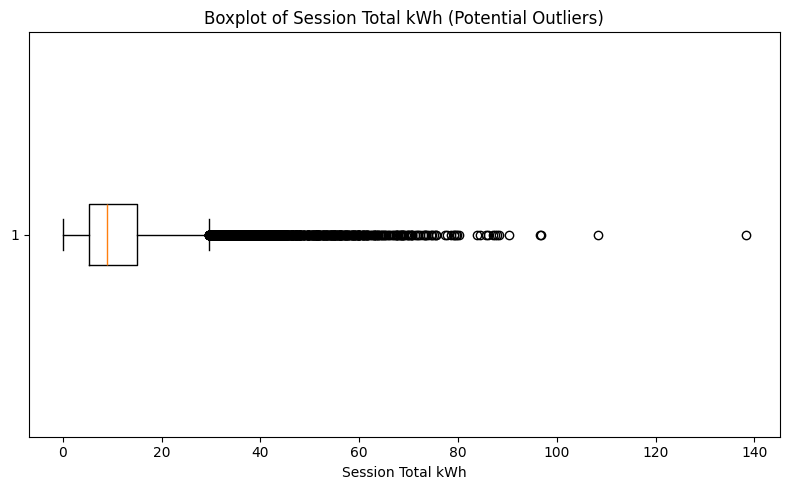

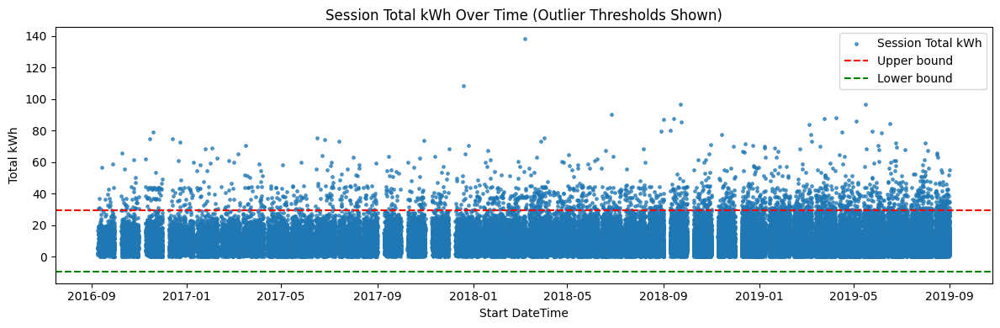

Identified 1824 outlier sessions out of 54101 (3.37%)
After cleaning and outlier removal, session-level shape: (52277, 14)


In [ ]:
# Remove non-positive charging before outlier checks

df = df[df['Total_kWh'] > 0]

# (5) Outlier Detection (IQR method) for Total_kWh at session level
Q1 = df['Total_kWh'].quantile(0.25)
Q3 = df['Total_kWh'].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# (6) Ensure StartDateTime is available and parsed correctly
if 'StartDateTime' not in df.columns:
    df['StartDateTime'] = pd.to_datetime(
        df['Start_Date'].astype(str).str.strip() + ' ' + df['Start_Time'].astype(str).str.strip(),
        dayfirst=True, errors='coerce'
    )
df = df.dropna(subset=['StartDateTime'])

# (6b) Visualise session-level outliers before removal
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 5))
plt.boxplot(df['Total_kWh'].dropna(), vert=False)
plt.title('Boxplot of Session Total kWh (Potential Outliers)')
plt.xlabel('Session Total kWh')
plt.tight_layout()
plt.savefig("Boxplot before outlier.png", dpi=1200, bbox_inches='tight')
plt.show()

plt.figure(figsize=(12, 4))
plt.scatter(df['StartDateTime'], df['Total_kWh'], s=6, label='Session Total kWh', alpha=0.7)
plt.axhline(upper_bound, color='r', linestyle='--', label='Upper bound')
plt.axhline(lower_bound, color='g', linestyle='--', label='Lower bound')
plt.legend()
plt.title('Session Total kWh Over Time (Outlier Thresholds Shown)')
plt.ylabel('Total kWh')
plt.xlabel('Start DateTime')
plt.tight_layout()
plt.savefig("Outliertreshold before outlier.png", dpi=1200, bbox_inches='tight')
plt.show()

# (7) Flag and remove session outliers
n_before = len(df)
df['Outlier'] = ~df['Total_kWh'].between(lower_bound, upper_bound)
n_outliers = df['Outlier'].sum()
print(f"Identified {n_outliers} outlier sessions out of {n_before} ({n_outliers/n_before:.2%})")
df = df[df['Total_kWh'].between(lower_bound, upper_bound)].copy()

# (8) Optional: Drop the flag column after filtering
if 'Outlier' in df.columns:
    df = df.drop(columns='Outlier')
df = df.reset_index(drop=True)

print("After cleaning and outlier removal, session-level shape:", df.shape)

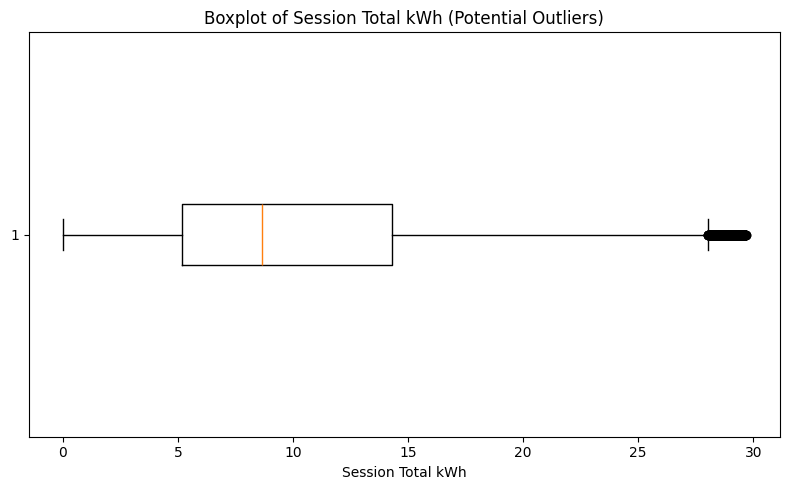

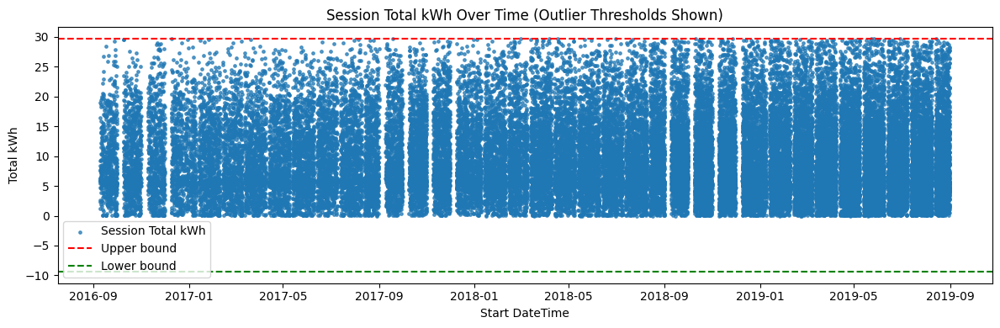

In [ ]:
# (6b) Visualise session-level outliers after removal
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 5))
plt.boxplot(df['Total_kWh'].dropna(), vert=False)
plt.title('Boxplot of Session Total kWh (Potential Outliers)')
plt.xlabel('Session Total kWh')
plt.tight_layout()
plt.savefig("Boxplot after outlier.png", dpi=1200, bbox_inches='tight')
plt.show()

plt.figure(figsize=(12, 4))
plt.scatter(df['StartDateTime'], df['Total_kWh'], s=6, label='Session Total kWh', alpha=0.7)
plt.axhline(upper_bound, color='r', linestyle='--', label='Upper bound')
plt.axhline(lower_bound, color='g', linestyle='--', label='Lower bound')
plt.legend()
plt.title('Session Total kWh Over Time (Outlier Thresholds Shown)')
plt.ylabel('Total kWh')
plt.xlabel('Start DateTime')
plt.tight_layout()
plt.savefig("Outliertreshold after outlier.png", dpi=1200, bbox_inches='tight')
plt.show()

Time-Based Feature Engineering

Hour, day, week, month, year, season, and working day features capture known demand drivers.

These can be used for exploratory plots, grouping, and as features in your ML models.

In [ ]:
# Step 6: Time-Based and Rolling Feature Engineering for EV Load Forecasting

# Hour of day (0–23)
df_hourly['ConnectionHour'] = df_hourly.index.hour  # As in Vishnu et al.

# Day of week (0=Monday, 6=Sunday)
df_hourly['DayofWeek'] = df_hourly.index.dayofweek

# Week number (ISO standard)
df_hourly['Week'] = df_hourly.index.isocalendar().week.astype(int)

# Month (1–12)
df_hourly['Month'] = df_hourly.index.month

# Year
df_hourly['Year'] = df_hourly.index.year

# Season (UK Meteorological seasons)
def uk_season(month):
    if month in [12, 1, 2]: return 'Winter'
    if month in [3, 4, 5]: return 'Spring'
    if month in [6, 7, 8]: return 'Summer'
    return 'Autumn'
df_hourly['Season'] = df_hourly['Month'].apply(uk_season)

# Working day indicator (1 = Mon–Fri, 0 = Sat/Sun)
df_hourly['WorkingStatus'] = df_hourly['DayofWeek'].apply(lambda x: 1 if x < 5 else 0)

# HourlyAverageDemand (cumulative mean for each hour of day, excluding current hour)
df_hourly['HourlyAverageDemand'] = (
    df_hourly.groupby('ConnectionHour')['Total_kWh']
    .transform(lambda x: x.expanding().mean().shift(1))
)

# Previous24HrAverageDemand (rolling mean of previous 24 hours, shifted by 1 to prevent leakage)
df_hourly['Previous24HrAverageDemand'] = (
    df_hourly['Total_kWh'].shift(1).rolling(window=24, min_periods=1).mean()
)

# Remove rows with NaNs introduced by rolling/expanding calculations
df_hourly = df_hourly.dropna(subset=['HourlyAverageDemand', 'Previous24HrAverageDemand'])

# Preview the features
print(df_hourly[['ConnectionHour', 'DayofWeek', 'Week', 'Month', 'Year', 'Season',
                 'WorkingStatus', 'HourlyAverageDemand', 'Previous24HrAverageDemand']].head(10))

                     ConnectionHour  DayofWeek  Week  Month  Year  Season  WorkingStatus  HourlyAverageDemand  \
StartDateTime                                                                                                   
2016-09-10 07:00:00               7          5    36      9  2016  Autumn              0                4.720   
2016-09-10 08:00:00               8          5    36      9  2016  Autumn              0               22.670   
2016-09-10 09:00:00               9          5    36      9  2016  Autumn              0                5.730   
2016-09-10 10:00:00              10          5    36      9  2016  Autumn              0                5.800   
2016-09-10 11:00:00              11          5    36      9  2016  Autumn              0                0.000   
2016-09-10 12:00:00              12          5    36      9  2016  Autumn              0                5.810   
2016-09-10 13:00:00              13          5    36      9  2016  Autumn              0        

In [ ]:
# One-hot encode the 'Season' column (creates new columns for each unique season)
df_hourly = pd.get_dummies(df_hourly, columns=['Season'], drop_first=True)

df_hourly.head()

,Pavg_kW,Total_kWh,ChargingDurationHrs,ConnectionHour,DayofWeek,Week,Month,Year,WorkingStatus,HourlyAverageDemand,Previous24HrAverageDemand,Season_Spring,Season_Summer,Season_Winter
StartDateTime,,,,,,,,,,,,,,
2016-09-10 07:00:00,19.052459,19.37,1.016667,7,5,36,9,2016,0,4.72,6.291750,False,False,False
2016-09-10 08:00:00,15.860000,15.86,1.000000,8,5,36,9,2016,0,22.67,6.902167,False,False,False
2016-09-10 09:00:00,NaN,0.00,0.000000,9,5,36,9,2016,0,5.73,6.618417,False,False,False
2016-09-10 10:00:00,16.269518,23.87,9.566667,10,5,36,9,2016,0,5.80,6.379667,False,False,False
2016-09-10 11:00:00,NaN,0.00,0.000000,11,5,36,9,2016,0,0.00,7.132583,False,False,False


In [ ]:
season_cols = [col for col in df_hourly.columns if col.startswith('Season_')]
df_hourly[season_cols] = df_hourly[season_cols].astype(int)

df_hourly.head()

,Pavg_kW,Total_kWh,ChargingDurationHrs,ConnectionHour,DayofWeek,Week,Month,Year,WorkingStatus,HourlyAverageDemand,Previous24HrAverageDemand,Season_Spring,Season_Summer,Season_Winter
StartDateTime,,,,,,,,,,,,,,
2016-09-10 07:00:00,19.052459,19.37,1.016667,7,5,36,9,2016,0,4.72,6.291750,0,0,0
2016-09-10 08:00:00,15.860000,15.86,1.000000,8,5,36,9,2016,0,22.67,6.902167,0,0,0
2016-09-10 09:00:00,NaN,0.00,0.000000,9,5,36,9,2016,0,5.73,6.618417,0,0,0
2016-09-10 10:00:00,16.269518,23.87,9.566667,10,5,36,9,2016,0,5.80,6.379667,0,0,0
2016-09-10 11:00:00,NaN,0.00,0.000000,11,5,36,9,2016,0,0.00,7.132583,0,0,0


Exploratory Data Analysis (EDA)

In [ ]:
# Quick Data Check

print("Hourly DataFrame shape:", df_hourly.shape)
print(df_hourly.describe())
print("\nMissing values per column:\n", df_hourly.isnull().sum())

Hourly DataFrame shape: (26057, 14)
            Pavg_kW     Total_kWh  ChargingDurationHrs  ConnectionHour     DayofWeek          Week         Month  \
count  14156.000000  26057.000000         26057.000000    26057.000000  26057.000000  26057.000000  26057.000000   
mean      19.438747     23.012600             3.139173       11.502283      3.001305     26.445869      6.504855   
std       10.267613     32.388725             9.122536        6.921769      2.000038     15.035114      3.455003   
min        0.035077      0.000000             0.000000        0.000000      0.000000      1.000000      1.000000   
25%       13.218309      0.000000             0.000000        6.000000      1.000000     13.000000      4.000000   
50%       18.709780      6.910000             0.366667       12.000000      3.000000     26.000000      6.000000   
75%       24.796337     37.420000             3.416667       18.000000      5.000000     40.000000     10.000000   
max      394.599078    244.226000   

Temporal Trends
1. Daily Energy Demand

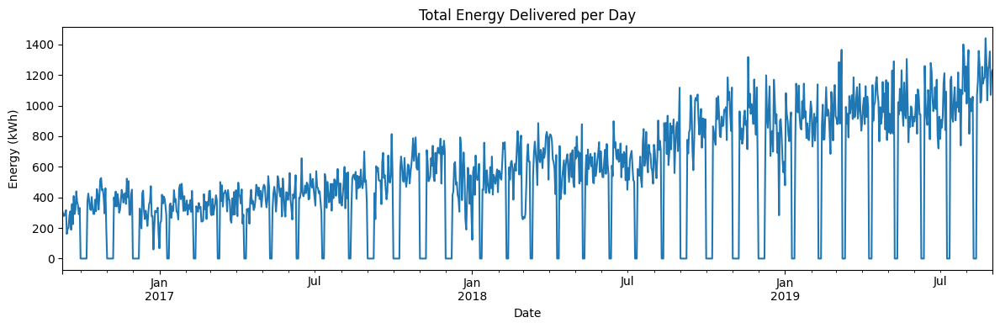

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12,4))
df_hourly['Total_kWh'].resample('D').sum().plot()
plt.title('Total Energy Delivered per Day')
plt.xlabel('Date')
plt.ylabel('Energy (kWh)')
plt.tight_layout()
plt.show()

2. Mean Hourly Demand by Hour of Day

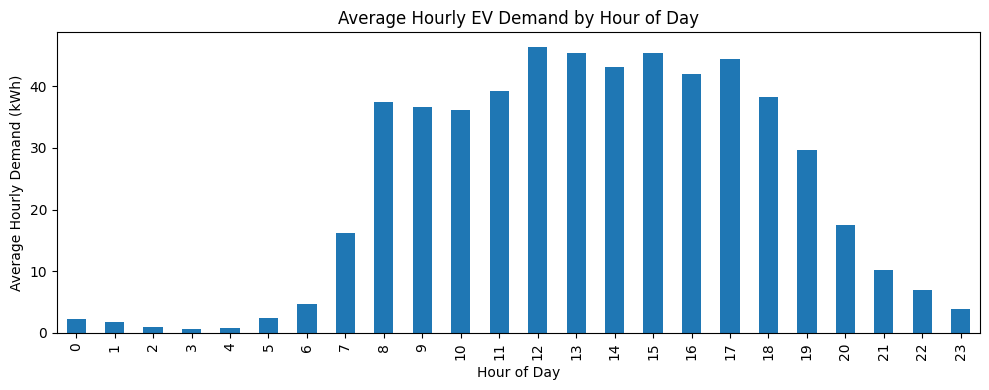

In [ ]:
plt.figure(figsize=(10,4))
df_hourly.groupby('ConnectionHour')['Total_kWh'].mean().plot(kind='bar')
plt.title('Average Hourly EV Demand by Hour of Day')
plt.xlabel('Hour of Day')
plt.ylabel('Average Hourly Demand (kWh)')
plt.tight_layout()
plt.savefig("Average hourly demand.png", dpi=1200, bbox_inches='tight')
plt.show()

3. Average Demand by Day of Week

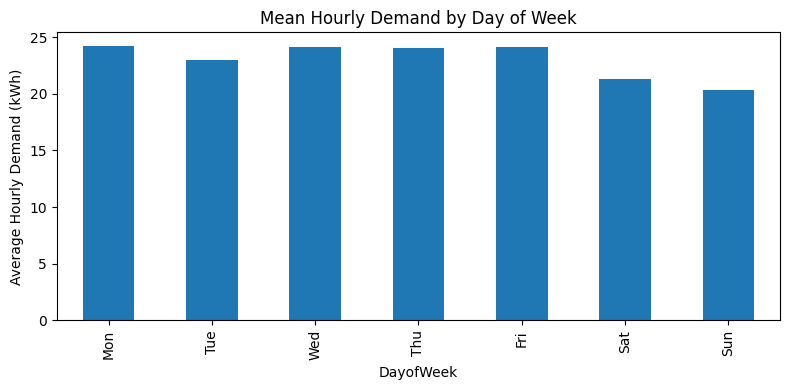

In [ ]:
dow_map = {0: 'Mon', 1: 'Tue', 2: 'Wed', 3: 'Thu', 4: 'Fri', 5: 'Sat', 6: 'Sun'}
mean_by_dow = df_hourly.groupby('DayofWeek')['Total_kWh'].mean().rename(index=dow_map)

plt.figure(figsize=(8,4))
mean_by_dow.plot(kind='bar')
plt.title('Mean Hourly Demand by Day of Week')
plt.ylabel('Average Hourly Demand (kWh)')
plt.tight_layout()
plt.show()

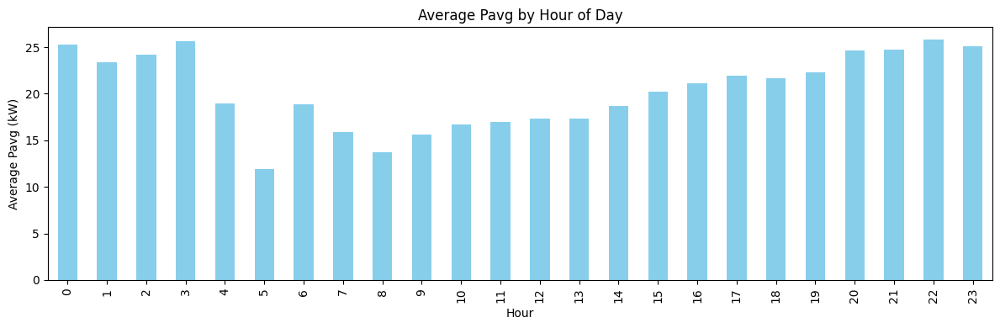

In [ ]:
# 1. Average Pavg by Hour of Day
plt.figure(figsize=(12,4))
df_hourly.groupby('ConnectionHour')['Pavg_kW'].mean().plot(kind='bar', color='skyblue')
plt.title('Average Pavg by Hour of Day')
plt.xlabel('Hour')
plt.ylabel('Average Pavg (kW)')
plt.tight_layout()
plt.show()

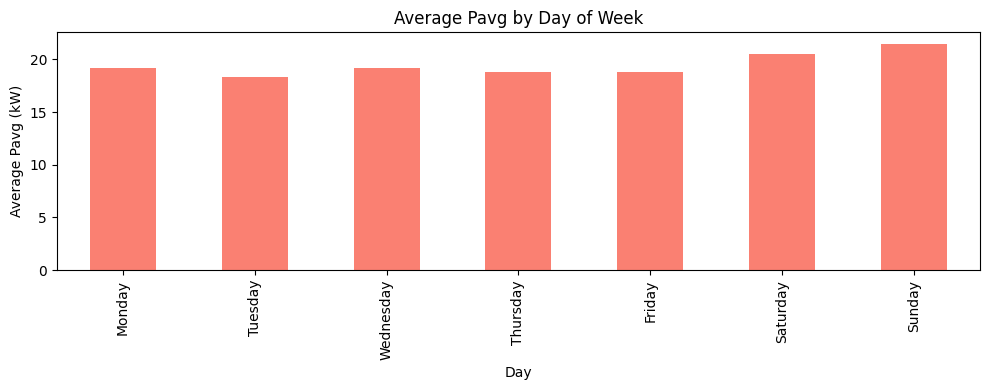

In [ ]:
# 2. Average Pavg by Day of Week
plt.figure(figsize=(10,4))
dow_map = {0: 'Monday', 1: 'Tuesday', 2: 'Wednesday', 3: 'Thursday', 4: 'Friday', 5: 'Saturday', 6: 'Sunday'}
avg_by_dow = df_hourly.groupby('DayofWeek')['Pavg_kW'].mean().rename(index=dow_map)
avg_by_dow.plot(kind='bar', color='salmon')
plt.title('Average Pavg by Day of Week')
plt.xlabel('Day')
plt.ylabel('Average Pavg (kW)')
plt.tight_layout()
plt.show()

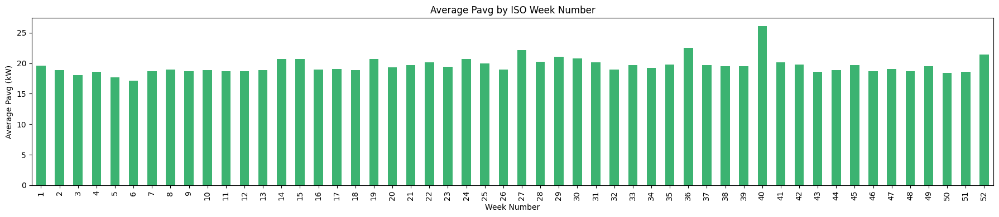

In [ ]:
# 3. Average Pavg by ISO Week Number
plt.figure(figsize=(18,4))
df_hourly.groupby('Week')['Pavg_kW'].mean().plot(kind='bar', color='mediumseagreen')
plt.title('Average Pavg by ISO Week Number')
plt.xlabel('Week Number')
plt.ylabel('Average Pavg (kW)')
plt.tight_layout()
plt.show()

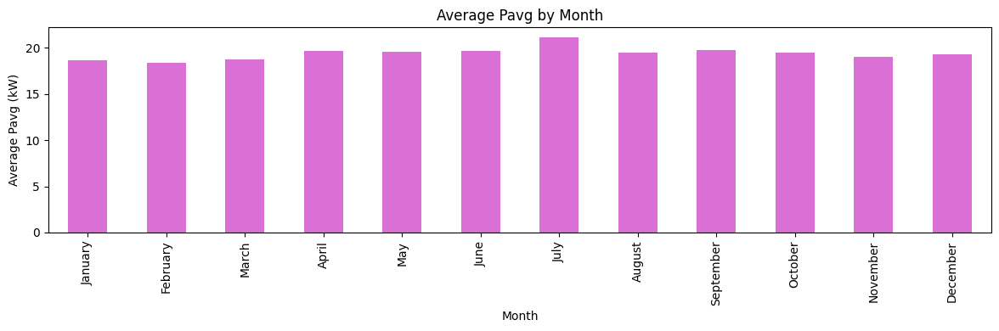

In [ ]:
# 4. Average Pavg by Month
plt.figure(figsize=(12,4))
month_map = {1:'January', 2:'February', 3:'March', 4:'April', 5:'May', 6:'June', 7:'July', 8:'August', 9:'September', 10:'October', 11:'November', 12:'December'}
avg_by_month = df_hourly.groupby('Month')['Pavg_kW'].mean().rename(index=month_map)
avg_by_month.plot(kind='bar', color='orchid')
plt.title('Average Pavg by Month')
plt.xlabel('Month')
plt.ylabel('Average Pavg (kW)')
plt.tight_layout()
plt.show()

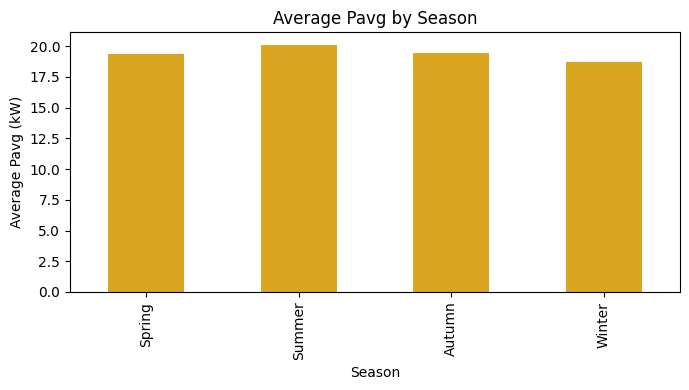

In [ ]:
# Create a new 'Season_Label' column based on the dummies (assuming you used drop_first=True and Autumn is base)
def infer_season(row):
    if row['Season_Spring'] == 1:
        return 'Spring'
    elif row['Season_Summer'] == 1:
        return 'Summer'
    elif row['Season_Winter'] == 1:
        return 'Winter'
    else:
        return 'Autumn'  # all zeros means Autumn

df_hourly['Season_Label'] = df_hourly.apply(infer_season, axis=1)

plt.figure(figsize=(7,4))
df_hourly.groupby('Season_Label')['Pavg_kW'].mean().loc[['Spring','Summer','Autumn','Winter']].plot(kind='bar', color='goldenrod')
plt.title('Average Pavg by Season')
plt.xlabel('Season')
plt.ylabel('Average Pavg (kW)')
plt.tight_layout()
plt.show()

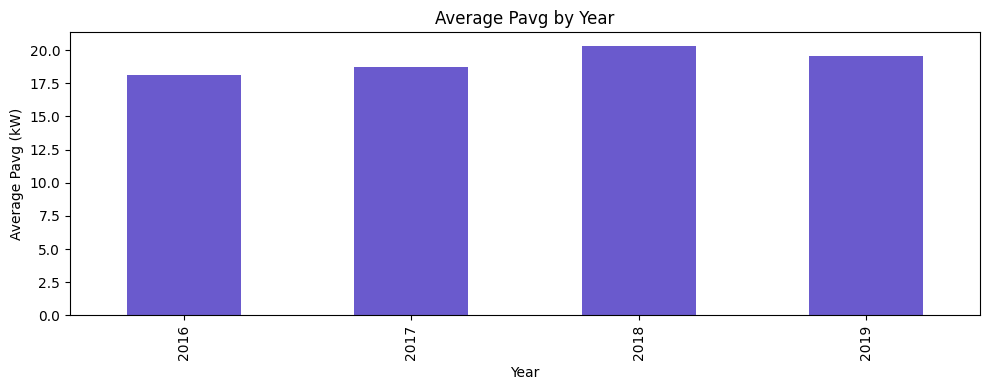

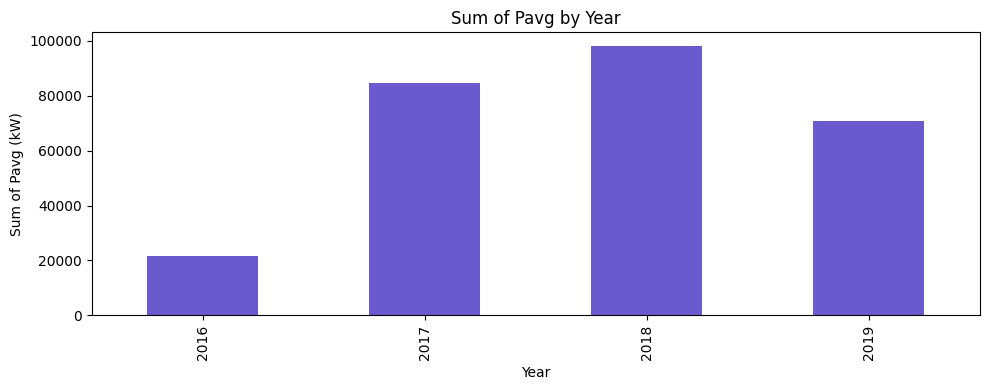

In [ ]:
# 6. Average Pavg by Year (if multiple years in dataset)
if 'Year' in df_hourly.columns:
    plt.figure(figsize=(10,4))
    df_hourly.groupby('Year')['Pavg_kW'].mean().plot(kind='bar', color='slateblue')
    plt.title('Average Pavg by Year')
    plt.xlabel('Year')
    plt.ylabel('Average Pavg (kW)')
    plt.tight_layout()
    plt.show()

    # 7. Sum of Pavg by Year
    plt.figure(figsize=(10,4))
    df_hourly.groupby('Year')['Pavg_kW'].sum().plot(kind='bar', color='slateblue')
    plt.title('Sum of Pavg by Year')
    plt.xlabel('Year')
    plt.ylabel('Sum of Pavg (kW)')
    plt.tight_layout()
    plt.show()

In [ ]:
!pip install statsmodels

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.5/10.5 MB 96.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 232.9/232.9 kB 15.1 MB/s eta 0:00:00


<Figure size 700x500 with 0 Axes>

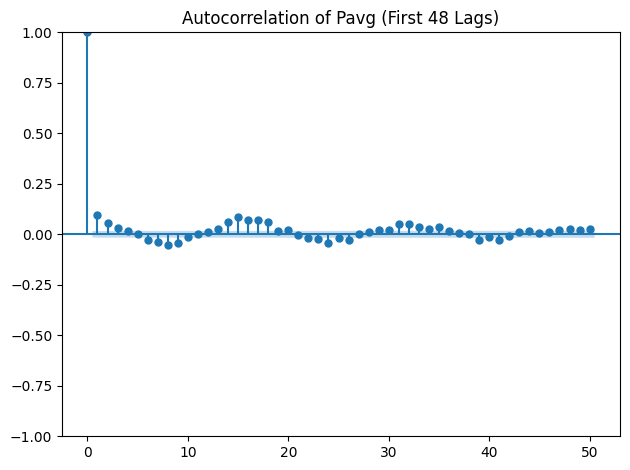

In [ ]:
# 8. Autocorrelation Plot of Pavg
from statsmodels.graphics.tsaplots import plot_acf

# Plot autocorrelation for the first 48 lags (2 days for hourly data)
plt.figure(figsize=(7,5))
plot_acf(df_hourly['Pavg_kW'].dropna(), lags=50)
plt.title('Autocorrelation of Pavg (First 48 Lags)')
plt.tight_layout()
plt.show()

How to Interpret This Plot
1. Spike at Lag 0

The value is always 1 at lag 0—this is just the correlation of the series with itself.

2. Lag 1 to Lag 48

You see the autocorrelation coefficient for lags 1 to 50.

Each point is the correlation between the series and itself shifted by that many hours.

3. What the shape means:

The pattern is a gentle oscillation: small positive and negative autocorrelations that repeat with a moderate period (about 24 hours, as you can see from a slight cycle).

No extremely strong daily (24h) or weekly (168h) repeating structure, but there is weak seasonality—visible as the small “bumps” near every 24 lags.

The autocorrelation values are mostly near zero except for the first few lags, which means:

There is some short-term correlation: The value at hour t is weakly related to recent hours (this is typical in real energy or demand series, where consumption or demand is “sticky”).

But the series is not dominated by strong regular cycles (e.g. if this were household electricity, you'd see a huge peak at 24, 48, etc.; your workplace/public EV demand is more diffused).

4. Stationarity

The lack of strong upward or downward trend in the autocorrelation coefficients (after lag 0) suggests your series is fairly stationary in the mean.

What Does This Mean for Forecasting?
Some benefit to including lagged demand features: e.g., using demand at t-1, t-2 as predictors.

Possible value in capturing daily effects: Rolling features or periodic encodings (hour of day, day of week) could help.

No dominant seasonality: Your EV load is not simply repeating the same pattern every day/hour, likely due to workplace and public station context.

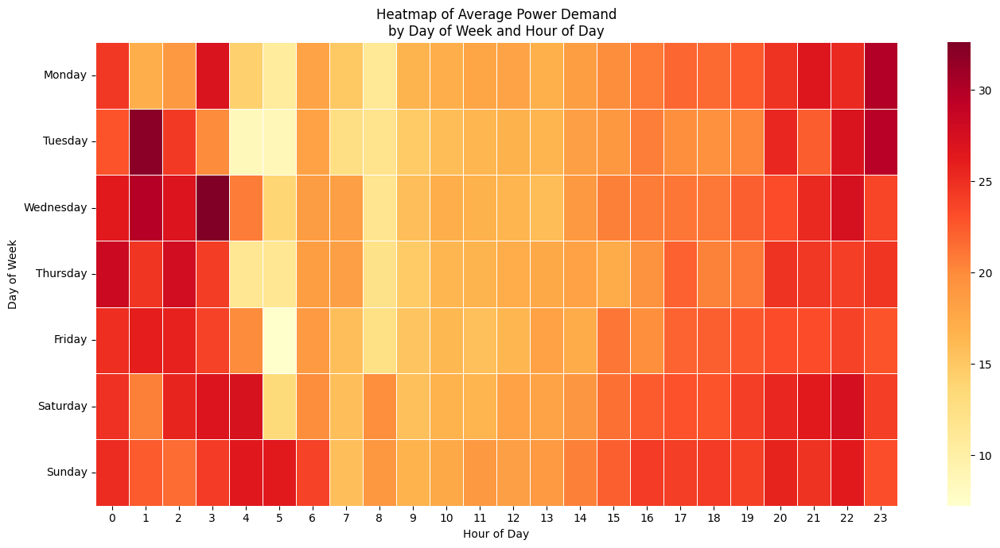

In [ ]:
# 9. Heatmap of Average Power Demand by Day of Week and Hour of Day
import seaborn as sns

pivot = df_hourly.pivot_table(index='DayofWeek', columns='ConnectionHour', values='Pavg_kW', aggfunc='mean')
plt.figure(figsize=(14,7))
sns.heatmap(pivot, cmap='YlOrRd', linewidths=0.5)
plt.title('Heatmap of Average Power Demand\nby Day of Week and Hour of Day')
plt.xlabel('Hour of Day')
plt.ylabel('Day of Week')
plt.yticks(ticks=np.arange(0.5, 7.5), labels=['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday'], rotation=0)
plt.tight_layout()
plt.show()

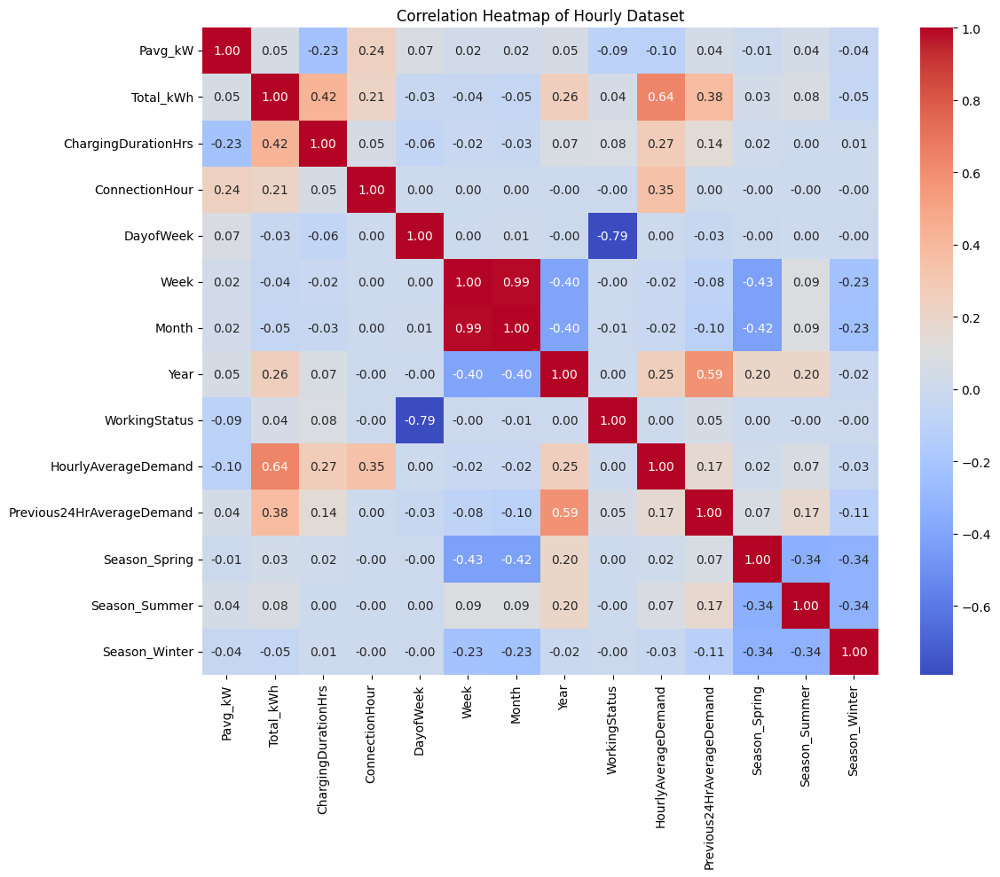

In [ ]:
# 10. Correlation Heatmap (of all numeric features)
plt.figure(figsize=(12,10))
num_cols = df_hourly.select_dtypes(include=np.number).columns
corr = df_hourly[num_cols].corr()
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap of Hourly Dataset')
plt.tight_layout()
plt.savefig("Heatmap.png", dpi=1200, bbox_inches='tight')
plt.show()

Features to Drop (with Reasoning)
1. Target column
'Total_kWh' – This is your target, so must not be included as a feature.

2. Highly correlated features (choose only one for each highly-correlated group)
'Month' and 'Week' – Both are highly correlated with each other and with 'Year'. If your aim is short-term load forecasting, you typically keep only one or drop all if you have more granular time/season features (like 'Season').

'Year' – Only needed if you expect a strong trend; otherwise, can drop to prevent collinearity.

3. Duplicates or categorical features already captured elsewhere
'DayOfWeek' – If you keep 'WorkingStatus' (which is a binarised/aggregated version), drop the original.

Any "Code" columns created for encoding if you use one-hot or ordinal encoding elsewhere.

'ChargingDurationHrs' – Unless justified by your research question, as it's a function of the total kWh and session times. If you keep only demand forecasting, you can drop this.

4. Pavg_kW
'Pavg_kW' – Average power per hour; since you are forecasting energy, not power, this may be dropped unless used as a useful lagged feature.

In [ ]:
# First, let's map the day of the week numbers to names for clarity in the new columns
dow_map = {0: 'Mon', 1: 'Tue', 2: 'Wed', 3: 'Thu', 4: 'Fri', 5: 'Sat', 6: 'Sun'}
df_hourly['DayofWeek_Name'] = df_hourly['DayofWeek'].map(dow_map)

# Now, one-hot encode the new 'DayofWeek_Name' column.
# drop_first=True is good practice for linear models to avoid multicollinearity.
df_hourly = pd.get_dummies(df_hourly, columns=['DayofWeek_Name'], prefix='Day', drop_first=True)

# You can now drop the original numeric 'DayofWeek' column as it's redundant.
if 'DayofWeek' in df_hourly.columns:
    df_hourly = df_hourly.drop(columns=['DayofWeek'])

print("DataFrame columns after one-hot encoding Day of Week:")
print(df_hourly.columns)

DataFrame columns after one-hot encoding Day of Week:
Index(['Pavg_kW', 'Total_kWh', 'ChargingDurationHrs', 'ConnectionHour', 'Week', 'Month', 'Year', 'WorkingStatus',
       'HourlyAverageDemand', 'Previous24HrAverageDemand', 'Season_Spring', 'Season_Summer', 'Season_Winter',
       'Season_Label', 'Day_Mon', 'Day_Sat', 'Day_Sun', 'Day_Thu', 'Day_Tue', 'Day_Wed'],
      dtype='object')


In [ ]:
# --- This is the corrected sequence for your feature selection cell ---

# 1. Define the list of columns you want to drop to create your features.
#    This list MUST include your target variable.
features_to_drop = [
    'Total_kWh',              # The target variable
    'Pavg_kw',
    'Month',
    'Week',
    'Year',
    'ChargingDurationHrs',
]

# Add the categorical 'Season_Label' if it exists
if 'Season_Label' in df_hourly.columns:
    features_to_drop.append('Season_Label')


# 2. FIRST: Define your target vector 'y' from the original DataFrame
y = df_hourly['Total_kWh']

# 3. SECOND: Define your feature matrix 'X' by dropping the columns from the original DataFrame
X = df_hourly.drop(columns=[col for col in features_to_drop if col in df_hourly.columns])


# --- Debugging Tip ---
# If you still get an error, print the available columns right before the failing line:
# print(df_hourly.columns)

# Verify the final feature set
print("Final feature columns in X:")
print(X.columns.tolist())

Final feature columns in X:
['Pavg_kW', 'ConnectionHour', 'WorkingStatus', 'HourlyAverageDemand', 'Previous24HrAverageDemand', 'Season_Spring', 'Season_Summer', 'Season_Winter', 'Day_Mon', 'Day_Sat', 'Day_Sun', 'Day_Thu', 'Day_Tue', 'Day_Wed']


In [ ]:
print("Feature columns in X:")
print(X.columns.tolist())

if 'Season_Label' in X.columns:
    X = X.drop(columns=['Season_Label'])

print(X.tail())

Feature columns in X:
['Pavg_kW', 'ConnectionHour', 'WorkingStatus', 'HourlyAverageDemand', 'Previous24HrAverageDemand', 'Season_Spring', 'Season_Summer', 'Season_Winter', 'Day_Mon', 'Day_Sat', 'Day_Sun', 'Day_Thu', 'Day_Tue', 'Day_Wed']
                       Pavg_kW  ConnectionHour  WorkingStatus  HourlyAverageDemand  Previous24HrAverageDemand  \
StartDateTime                                                                                                   
2019-08-31 19:00:00  15.165680              19              0            29.630052                  51.058875   
2019-08-31 20:00:00  18.348286              20              0            17.424235                  50.309125   
2019-08-31 21:00:00  17.100000              21              0            10.238066                  52.192708   
2019-08-31 22:00:00        NaN              22              0             7.013165                  52.003542   
2019-08-31 23:00:00  27.385714              23              0             3.819161  

In [ ]:
# Identify all columns with the boolean data type
bool_columns = X.select_dtypes(include='bool').columns

# Convert those columns to integer type (True becomes 1, False becomes 0)
X[bool_columns] = X[bool_columns].astype(int)

# Display the end of the DataFrame to confirm the change
print(X.tail())

                       Pavg_kW  ConnectionHour  WorkingStatus  HourlyAverageDemand  Previous24HrAverageDemand  \
StartDateTime                                                                                                   
2019-08-31 19:00:00  15.165680              19              0            29.630052                  51.058875   
2019-08-31 20:00:00  18.348286              20              0            17.424235                  50.309125   
2019-08-31 21:00:00  17.100000              21              0            10.238066                  52.192708   
2019-08-31 22:00:00        NaN              22              0             7.013165                  52.003542   
2019-08-31 23:00:00  27.385714              23              0             3.819161                  51.103625   

                     Season_Spring  Season_Summer  Season_Winter  Day_Mon  Day_Sat  Day_Sun  Day_Thu  Day_Tue  Day_Wed  
StartDateTime                                                                          

Split Data Chronologically
Split your data into training, validation, and test sets to mimic real-world forecasting.
(If you already did this, you can skip. Otherwise, here’s the code:)

In [ ]:
# Ensure data is sorted by time
X = X.sort_index()
y = y.sort_index()

n = len(X)
train_size = int(n * 0.7)
val_size = int(n * 0.15)
test_size = n - train_size - val_size

X_train = X.iloc[:train_size]
y_train = y.iloc[:train_size]
X_val = X.iloc[train_size:train_size + val_size]
y_val = y.iloc[train_size:train_size + val_size]
X_test = X.iloc[train_size + val_size:]
y_test = y.iloc[train_size + val_size:]

print("Train:", X_train.shape)
print("Val:", X_val.shape)
print("Test:", X_test.shape)


Train: (18239, 14)
Val: (3908, 14)
Test: (3910, 14)


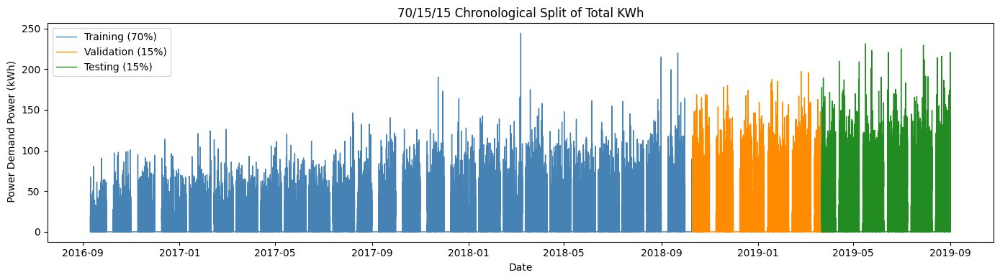

In [ ]:
# Plotting
plt.figure(figsize=(14, 4))
plt.plot(y_train.index, y_train, label='Training (70%)', color='steelblue', linewidth=1)
plt.plot(y_val.index, y_val, label='Validation (15%)', color='darkorange', linewidth=1)
plt.plot(y_test.index, y_test, label='Testing (15%)', color='forestgreen', linewidth=1)

# Customisation
plt.title("70/15/15 Chronological Split of Total KWh")
plt.xlabel("Date")
plt.ylabel(" Power Demand Power (kWh)")
plt.legend()
plt.tight_layout()

# Save high-quality figure
plt.savefig("pavg_split_visualisation.png", dpi=1200, bbox_inches='tight')
plt.show()

In [ ]:
from sklearn.impute import SimpleImputer
import pandas as pd

# Assume X_train, X_val, and X_test are your pandas DataFrames that contain NaNs

# Step 1: Create the imputer
imputer = SimpleImputer(strategy='mean')

# Step 2: Fit the imputer on the training data and transform X_train
print("Imputing NaNs in X_train...")
# We save the columns/index because transform() returns a NumPy array
X_train_cols = X_train.columns
X_train_idx = X_train.index
X_train = pd.DataFrame(imputer.fit_transform(X_train), columns=X_train_cols, index=X_train_idx)

# Step 3: Transform X_val and X_test using the same fitted imputer
print("Imputing NaNs in X_val and X_test...")
X_val_cols = X_val.columns
X_val_idx = X_val.index
X_val = pd.DataFrame(imputer.transform(X_val), columns=X_val_cols, index=X_val_idx)

X_test_cols = X_test.columns
X_test_idx = X_test.index
X_test = pd.DataFrame(imputer.transform(X_test), columns=X_test_cols, index=X_test_idx)

print("\nImputation complete. Checking for remaining NaNs:")
print(f"NaNs in X_train: {X_train.isnull().sum().sum()}")
print(f"NaNs in X_val: {X_val.isnull().sum().sum()}")
print(f"NaNs in X_test: {X_test.isnull().sum().sum()}")

Imputing NaNs in X_train...
Imputing NaNs in X_val and X_test...

Imputation complete. Checking for remaining NaNs:
NaNs in X_train: 0
NaNs in X_val: 0
NaNs in X_test: 0


Feature Scaling (Normalisation/Standardisation)
Scale features using the training data only (to prevent leakage).
The most common is MinMaxScaler or StandardScaler.

In [ ]:
from sklearn.preprocessing import MinMaxScaler
import pandas as pd

# --- 1. Scale the Feature Sets (X) ---
scaler_X = MinMaxScaler()

# Fit the scaler on the training data ONLY, then transform all three sets
print("Scaling feature sets (X)...")
X_train_scaled = scaler_X.fit_transform(X_train)
X_val_scaled = scaler_X.transform(X_val)
X_test_scaled = scaler_X.transform(X_test) # <-- This line creates X_test_scaled


# --- 2. Scale the Target Sets (y) ---
scaler_y = MinMaxScaler()

# Fit the scaler on the training target ONLY, then transform all three sets
print("Scaling target sets (y)...")
y_train_scaled = scaler_y.fit_transform(y_train.to_numpy().reshape(-1, 1))
y_val_scaled = scaler_y.transform(y_val.to_numpy().reshape(-1, 1))
y_test_scaled = scaler_y.transform(y_test.to_numpy().reshape(-1, 1)) # <-- This line creates y_test_scaled


print("\nAll data splits have been successfully scaled.")
print(f"Shape of X_train_scaled: {X_train_scaled.shape}")
print(f"Shape of X_test_scaled: {X_test_scaled.shape}")

Scaling feature sets (X)...
Scaling target sets (y)...

All data splits have been successfully scaled.
Shape of X_train_scaled: (18239, 14)
Shape of X_test_scaled: (3910, 14)


Train a Baseline Regression Model
It’s standard practice to begin with a simple model (like Linear Regression) as a benchmark.
This gives you a reference to compare more advanced machine learning or deep learning models later.

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# 1. Instantiate and fit the model
lr = LinearRegression()
lr.fit(X_train, y_train)

# 2. Predict on validation and test sets
y_val_pred = lr.predict(X_val)
y_test_pred = lr.predict(X_test)

# 3. Evaluate performance
def print_metrics(y_true, y_pred, set_name='Set'):
    mae = mean_absolute_error(y_true, y_pred)
    rmse = mean_squared_error(y_true, y_pred) ** 0.5
    r2 = r2_score(y_true, y_pred)
    print(f"{set_name} MAE: {mae:.2f}")
    print(f"{set_name} RMSE: {rmse:.2f}")
    print(f"{set_name} R^2: {r2:.3f}")

print_metrics(y_val, y_val_pred, 'Validation')
print_metrics(y_test, y_test_pred, 'Test')

Validation MAE: 22.12
Validation RMSE: 28.50
Validation R^2: 0.479
Test MAE: 24.05
Test RMSE: 31.29
Test R^2: 0.490


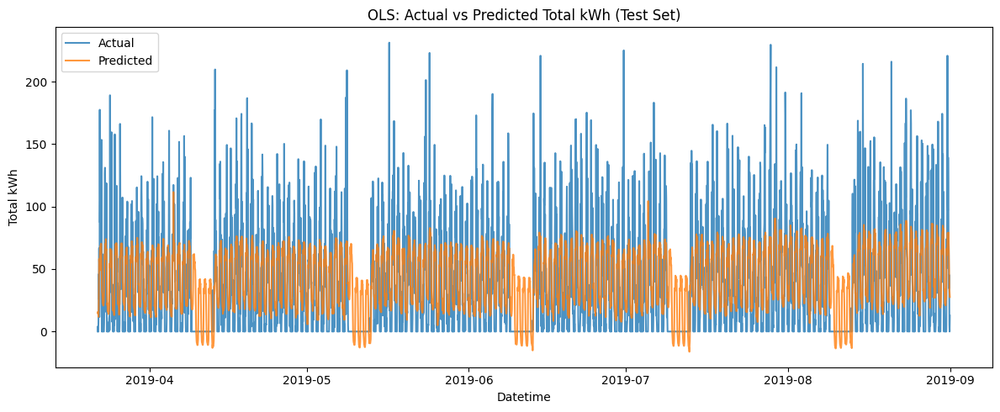

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12,5))
plt.plot(y_test.index, y_test, label='Actual', alpha=0.8)
plt.plot(y_test.index, y_test_pred, label='Predicted', alpha=0.8)
plt.legend()
plt.title('OLS: Actual vs Predicted Total kWh (Test Set)')
plt.xlabel('Datetime')
plt.ylabel('Total kWh')
plt.tight_layout()
plt.savefig("OLS_visualisation.png", dpi=1200, bbox_inches='tight')
plt.show()

Train and Evaluate an SARIMAX Model
1. Import, Fit, and Forecast

In [ ]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Try with seasonal order (e.g., daily seasonality, s=24)
model = SARIMAX(y_train, order=(2,0,2), seasonal_order=(1,1,1,24))
sarima_fit = model.fit()
y_val_pred_sarima = sarima_fit.forecast(steps=len(y_val))
y_test_pred_sarima = sarima_fit.forecast(steps=len(y_val)+len(y_test))[-len(y_test):]
print_metrics(y_val, y_val_pred_sarima, 'SARIMA Validation')
print_metrics(y_test, y_test_pred_sarima, 'SARIMA Test')

SARIMA Validation MAE: 21.18
SARIMA Validation RMSE: 31.96
SARIMA Validation R^2: 0.345
SARIMA Test MAE: 24.01
SARIMA Test RMSE: 36.79
SARIMA Test R^2: 0.295


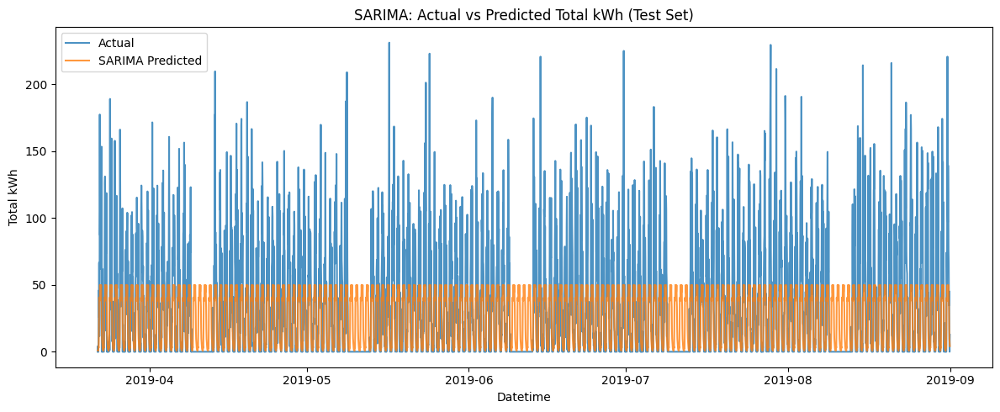

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12,5))
plt.plot(y_test.index, y_test, label='Actual', alpha=0.8)
plt.plot(y_test.index, y_test_pred_sarima, label='SARIMA Predicted', alpha=0.8)
plt.legend()
plt.title('SARIMA: Actual vs Predicted Total kWh (Test Set)')
plt.xlabel('Datetime')
plt.ylabel('Total kWh')
plt.tight_layout()
plt.savefig("SARIMA_visualisation.png", dpi=1200, bbox_inches='tight')
plt.show()

"The SARIMA model predicts a smoothed, periodic pattern that fails to capture the pronounced peaks and high variability in actual EV charging demand. This underfitting is typical for linear time series models when applied to highly non-stationary and event-driven datasets. The model’s inability to adapt to rapid changes or spikes highlights the need for advanced machine learning approaches that can leverage engineered features and capture more complex, non-linear relationships."

Train and Evaluate Support Vector Regression (SVR)
1. Train the SVR model

SVR Validation (C=10, gamma=1) MAE: 14.97
SVR Validation (C=10, gamma=1) RMSE: 26.41
SVR Validation (C=10, gamma=1) R^2: 0.553
SVR Test (C=10, gamma=1) MAE: 21.55
SVR Test (C=10, gamma=1) RMSE: 36.44
SVR Test (C=10, gamma=1) R^2: 0.308


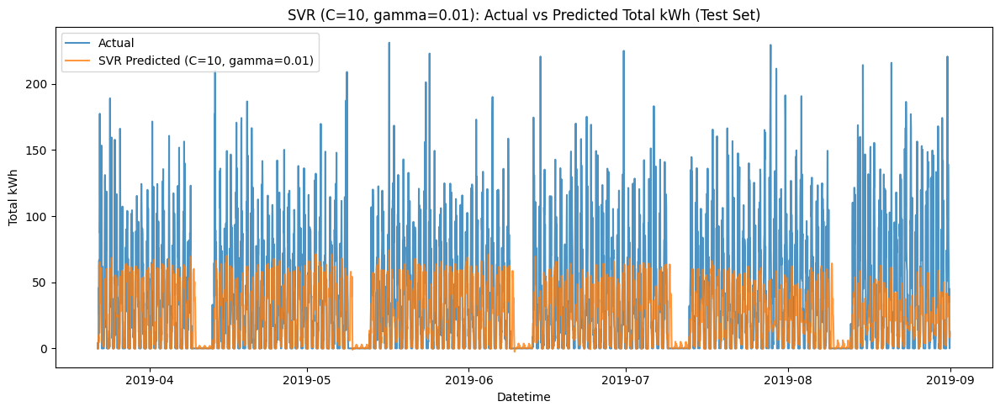

In [ ]:
from sklearn.svm import SVR
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Instantiate SVR with your chosen parameters
svr = SVR(kernel='rbf', C=10, gamma= 0.01, epsilon=0.1)

# Fit on training data
svr.fit(X_train, y_train)

# Predict on validation and test sets
y_val_pred_svr = svr.predict(X_val)
y_test_pred_svr = svr.predict(X_test)

# Evaluate performance
print_metrics(y_val, y_val_pred_svr, 'SVR Validation (C=10, gamma=1)')
print_metrics(y_test, y_test_pred_svr, 'SVR Test (C=10, gamma=1)')

# Plot Actual vs Predicted
import matplotlib.pyplot as plt
plt.figure(figsize=(12,5))
plt.plot(y_test.index, y_test, label='Actual', alpha=0.8)
plt.plot(y_test.index, y_test_pred_svr, label='SVR Predicted (C=10, gamma=0.01)', alpha=0.8)
plt.legend()
plt.title('SVR (C=10, gamma=0.01): Actual vs Predicted Total kWh (Test Set)')
plt.xlabel('Datetime')
plt.ylabel('Total kWh')
plt.tight_layout()
plt.savefig("SVR_visualisation.png", dpi=1200, bbox_inches='tight')
plt.show()

"With proper scaling and kernel parameter selection, SVR was able to capture the periodic trends and moderate fluctuations in hourly EV charging demand. However, it still underpredicts the most extreme demand peaks, a limitation typical of SVR when forecasting highly volatile, event-driven time series. These results support the need for more flexible models, such as tree-based ensembles or deep neural networks, to better capture rare but impactful spikes in demand."

Train and Evaluate XGBoost for EV Load Forecasting
1. Import and Fit XGBoost

In [ ]:
!pip install --upgrade xgboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.9/94.9 MB 12.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 322.5/322.5 MB 3.3 MB/s eta 0:00:00


In [ ]:
import xgboost as xgb
print(xgb.__version__)

3.0.4


In [ ]:
from sklearn.model_selection import RandomizedSearchCV
import xgboost as xgb

params = {
    'n_estimators': [100, 250, 500],
    'max_depth': [3, 5, 7, 10],
    'learning_rate': [0.01, 0.05, 0.1],
    'subsample': [0.7, 0.8, 1.0],
    'colsample_bytree': [0.7, 0.8, 1.0],
    'min_child_weight': [1, 3, 5],
    'gamma': [0, 0.1, 1]
}

xgb_model = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)
random_search = RandomizedSearchCV(
    xgb_model, params,
    scoring='neg_mean_squared_error',
    cv=3,
    n_iter=20,
    verbose=1,
    n_jobs=-1
)

random_search.fit(X_train, y_train)
print("Best parameters:", random_search.best_params_)

print("Best parameters:", random_search.best_params_)

Fitting 3 folds for each of 20 candidates, totalling 60 fits
Best parameters: {'subsample': 1.0, 'n_estimators': 100, 'min_child_weight': 5, 'max_depth': 5, 'learning_rate': 0.05, 'gamma': 0.1, 'colsample_bytree': 0.7}
Best parameters: {'subsample': 1.0, 'n_estimators': 100, 'min_child_weight': 5, 'max_depth': 5, 'learning_rate': 0.05, 'gamma': 0.1, 'colsample_bytree': 0.7}


In [ ]:
# Refit with Best Parameters and Predict

best_xgb = random_search.best_estimator_
y_val_pred_xgb = best_xgb.predict(X_val)
y_test_pred_xgb = best_xgb.predict(X_test)

def print_metrics(y_true, y_pred, set_name='Set'):
    from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
    mae = mean_absolute_error(y_true, y_pred)
    rmse = mean_squared_error(y_true, y_pred) ** 0.5
    r2 = r2_score(y_true, y_pred)
    print(f"{set_name} MAE: {mae:.2f}")
    print(f"{set_name} RMSE: {rmse:.2f}")
    print(f"{set_name} R^2: {r2:.3f}")

print_metrics(y_val, y_val_pred_xgb, 'XGBoost Validation')
print_metrics(y_test, y_test_pred_xgb, 'XGBoost Test')

XGBoost Validation MAE: 13.19
XGBoost Validation RMSE: 23.11
XGBoost Validation R^2: 0.657
XGBoost Test MAE: 16.19
XGBoost Test RMSE: 27.80
XGBoost Test R^2: 0.597


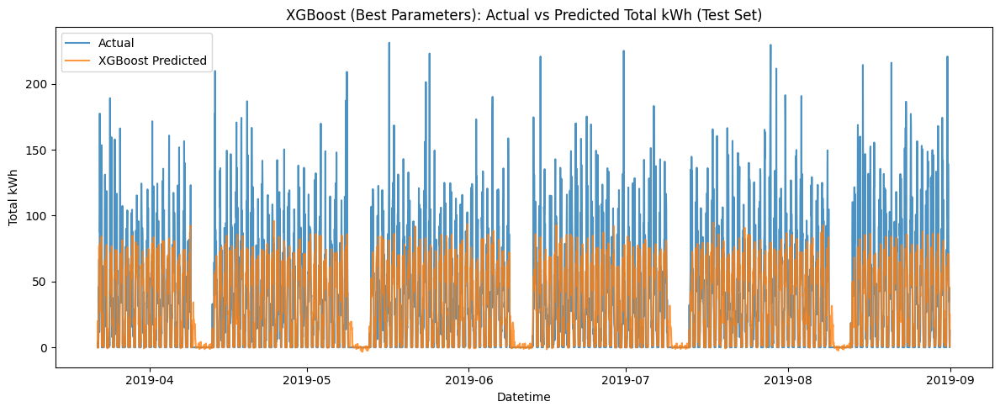

In [ ]:
# Plot Actual vs Predicted
import matplotlib.pyplot as plt

plt.figure(figsize=(12,5))
plt.plot(y_test.index, y_test, label='Actual', alpha=0.8)
plt.plot(y_test.index, y_test_pred_xgb, label='XGBoost Predicted', alpha=0.8)
plt.legend()
plt.title('XGBoost (Best Parameters): Actual vs Predicted Total kWh (Test Set)')
plt.xlabel('Datetime')
plt.ylabel('Total kWh')
plt.tight_layout()
plt.savefig("XGBoost_visualisation.png", dpi=1200, bbox_inches='tight')
plt.show()

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# --- 1. Define Hyperparameter Grid for Random Forest ---
rf_params = {
    'n_estimators': [100, 250, 500],
    'max_depth': [5, 10, 15, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': [1.0, 'sqrt', 'log2']
}

# --- 2. Initialize the Model and Randomized Search ---
# Note: RandomForestRegressor is imported from sklearn.ensemble
rf_model = RandomForestRegressor(random_state=42)

random_search_rf = RandomizedSearchCV(
    rf_model, rf_params,
    scoring='neg_mean_squared_error',
    cv=3,
    n_iter=20, # Same number of iterations for a fair comparison
    verbose=1,
    n_jobs=-1
)

# --- 3. Fit, Predict, and Evaluate ---
random_search_rf.fit(X_train, y_train)
print("Best Random Forest parameters:", random_search_rf.best_params_)

best_rf = random_search_rf.best_estimator_
y_val_pred_rf = best_rf.predict(X_val)
y_test_pred_rf = best_rf.predict(X_test)

def print_metrics(y_true, y_pred, set_name='Set'):
    mae = mean_absolute_error(y_true, y_pred)
    rmse = mean_squared_error(y_true, y_pred) ** 0.5
    r2 = r2_score(y_true, y_pred)
    print(f"{set_name} MAE: {mae:.2f}")
    print(f"{set_name} RMSE: {rmse:.2f}")
    print(f"{set_name} R^2: {r2:.3f}")

print("\n--- Random Forest Results ---")
print_metrics(y_val, y_val_pred_rf, 'Random Forest Validation')
print_metrics(y_test, y_test_pred_rf, 'Random Forest Test')

Fitting 3 folds for each of 20 candidates, totalling 60 fits
Best Random Forest parameters: {'n_estimators': 250, 'min_samples_split': 5, 'min_samples_leaf': 4, 'max_features': 1.0, 'max_depth': 10}

--- Random Forest Results ---
Random Forest Validation MAE: 12.96
Random Forest Validation RMSE: 23.09
Random Forest Validation R^2: 0.658
Random Forest Test MAE: 15.95
Random Forest Test RMSE: 27.32
Random Forest Test R^2: 0.611


In [ ]:
!pip install lightgbm

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 36.1 MB/s eta 0:00:00


In [ ]:
!pip install optuna

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.8/9.8 MB 67.0 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 395.9/395.9 kB 23.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 247.0/247.0 kB 20.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 587.7/587.7 kB 35.0 MB/s eta 0:00:00
  Created wheel for sqlalchemy: filename=sqlalchemy-2.0.43-cp311-cp311-linux_x86_64.whl size=3043272 sha256=1fa89614890e9e97bf284b3f14743dc128160dab7b0521e78bccfd7f8d62ff27
  Stored in directory: /root/.cache/pip/wheels/75/3d/3d/5f3156fd8681d6f4ad7e26e11a364c4e86a95fbfcf702ef7c9
Successfully built sqlalchemy


In [ ]:
import lightgbm as lgb
import optuna
import numpy as np
import pandas as pd
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# --- NEW: Silence Optuna's trial-by-trial logging ---
optuna.logging.set_verbosity(optuna.logging.WARNING)

# --- 1. Define the Objective Function for Optuna with Early Stopping ---
def objective_lgbm(trial):
    """Defines the LightGBM training process for a single Optuna trial."""

    params = {
        'objective': 'regression_l1',
        'metric': 'rmse',
        'n_estimators': trial.suggest_int('n_estimators', 400, 2000),
        'learning_rate': trial.suggest_float('learning_rate', 1e-3, 0.2, log=True),
        'max_depth': trial.suggest_int('max_depth', 3, 12),
        'num_leaves': trial.suggest_int('num_leaves', 20, 50),
        'subsample': trial.suggest_float('subsample', 0.6, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.6, 1.0),
        'random_state': 42,
        'n_jobs': -1
    }

    # --- MODIFIED: Added verbose=-1 to silence LightGBM's internal messages ---
    model = lgb.LGBMRegressor(**params, verbose=-1)

    model.fit(
        X_train, y_train,
        eval_set=[(X_val, y_val)],
        eval_metric='rmse',
        callbacks=[lgb.early_stopping(15, verbose=False)]
    )

    preds = model.predict(X_val)
    rmse = np.sqrt(mean_squared_error(y_val, preds))

    return rmse

# --- 2. Create and Run the Optuna Study ---
print("--- Starting LightGBM Hyperparameter Optimization with Optuna ---")
study_lgbm = optuna.create_study(direction='minimize')
study_lgbm.optimize(objective_lgbm, n_trials=20)

# --- 3. Display the Best Results ---
print("\n--- Optimization Complete ---")
print("Best LightGBM trial:")
best_trial_lgbm = study_lgbm.best_trial
print(f"  Value (Validation RMSE): {best_trial_lgbm.value:.4f}")
print("  Params: ")
for key, value in best_trial_lgbm.params.items():
    print(f"    {key}: {value}")

# --- 4. Train Final Model with Best Parameters ---
print("\n--- Training Final Model with Optimal Parameters ---")
final_lgbm_model = lgb.LGBMRegressor(**best_trial_lgbm.params, random_state=42, n_jobs=-1, verbose=-1)

X_train_val = pd.concat([X_train, X_val])
y_train_val = pd.concat([y_train, y_val])
final_lgbm_model.fit(X_train_val, y_train_val)

# --- 5. Evaluate on Validation and Test Sets ---
y_val_pred_lgbm = final_lgbm_model.predict(X_val)
y_test_pred_lgbm = final_lgbm_model.predict(X_test)

val_mae = mean_absolute_error(y_val, y_val_pred_lgbm)
val_rmse = np.sqrt(mean_squared_error(y_val, y_val_pred_lgbm))
val_r2 = r2_score(y_val, y_val_pred_lgbm)

test_mae = mean_absolute_error(y_test, y_test_pred_lgbm)
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred_lgbm))
test_r2 = r2_score(y_test, y_test_pred_lgbm)

print("\n--- Final Optimized LightGBM Performance on Validation Set ---")
print(f"MAE: {val_mae:.4f}")
print(f"RMSE: {val_rmse:.4f}")
print(f"R^2:  {val_r2:.4f}")

print("\n--- Final Optimized LightGBM Performance on Test Set ---")
print(f"MAE: {test_mae:.4f}")
print(f"RMSE: {test_rmse:.4f}")
print(f"R^2:  {test_r2:.4f}")

--- Starting LightGBM Hyperparameter Optimization with Optuna ---

--- Optimization Complete ---
Best LightGBM trial:
  Value (Validation RMSE): 23.3039
  Params: 
    n_estimators: 436
    learning_rate: 0.17272767077968096
    max_depth: 9
    num_leaves: 21
    subsample: 0.8576378648009729
    colsample_bytree: 0.9882645753785287

--- Training Final Model with Optimal Parameters ---

--- Final Optimized LightGBM Performance on Validation Set ---
MAE: 8.0583
RMSE: 13.7428
R^2:  0.8788

--- Final Optimized LightGBM Performance on Test Set ---
MAE: 17.1303
RMSE: 28.3673
R^2:  0.5807


CNN-LSTM for Time Series Forecasting

Prepare Your Data as Sequences
You need to convert your tabular data into 3D arrays with the shape (samples, window_size, features).
Here’s a robust way:

In [ ]:
import numpy as np

# --- Step 1: Define the Sequencing Function for NumPy arrays ---
# This function converts your 2D data (samples, features) into
# 3D sequences (samples, window_size, features).

def create_sequences_np(X_data, y_data, window_size=24):
    """
    Creates 3D sequences from 2D data.
    Works with NumPy arrays.
    """
    Xs, ys = [], []
    for i in range(len(X_data) - window_size):
        # Standard NumPy slicing is used here
        v = X_data[i:(i + window_size)]
        Xs.append(v)
        ys.append(y_data[i + window_size])
    return np.array(Xs), np.array(ys)


# --- Step 2: Create the Sequenced Data ---
# Use the final imputed and scaled NumPy arrays from the previous steps.
# (X_train_scaled, y_train_scaled, etc.)

window_size = 24 # e.g., use 24 hours of data to predict the next hour

print("Creating sequences from scaled data...")

# Note: We use .flatten() on the y arrays to make them 1D, which is what the function expects
X_train_seq, y_train_seq = create_sequences_np(X_train_scaled, y_train_scaled.flatten(), window_size)
X_val_seq, y_val_seq = create_sequences_np(X_val_scaled, y_val_scaled.flatten(), window_size)
X_test_seq, y_test_seq = create_sequences_np(X_test_scaled, y_test_scaled.flatten(), window_size)


# --- Step 3: Verify the Shapes of the New Variables ---
# The X shapes should be 3D and the y shapes should be 1D.
print(f"Shape of X_train_seq: {X_train_seq.shape}")
print(f"Shape of y_train_seq: {y_train_seq.shape}")
print(f"Shape of X_val_seq: {X_val_seq.shape}")
print(f"Shape of y_val_seq: {y_val_seq.shape}")

print("\nData has been successfully converted into sequences.")

Creating sequences from scaled data...
Shape of X_train_seq: (18215, 24, 14)
Shape of y_train_seq: (18215,)
Shape of X_val_seq: (3884, 24, 14)
Shape of y_val_seq: (3884,)

Data has been successfully converted into sequences.


In [ ]:
!pip install tensorflow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 644.9/644.9 MB 586.7 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.5/57.5 kB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.5/24.5 MB 78.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 319.9/319.9 kB 23.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 95.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.1/5.1 MB 105.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.6/6.6 MB 121.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/224.5 kB 15.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.5/72.5 kB 6.0 MB/s eta 0:00:00
  Attempting uninstall: protobuf
    Found existing installation: protobuf 6.31.1
    Uninstalling protobuf-6.31.1:
      Successfully uninstalled protobuf-6.31.1


Build and Train the CNN-LSTM Model

Building a simplified CNN-LSTM model to combat overfitting...


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d (Conv1D)                 │ (None, 22, 64)         │         2,752 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 22, 64)         │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 22, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm (LSTM)                     │ (None, 50)             │        23,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 50)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 25)             │         1,275 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │            26 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 27,309 (106.68 KB)

 Trainable params: 27,181 (106.18 KB)

 Non-trainable params: 128 (512.00 B)

Epoch 1/100
570/570 ━━━━━━━━━━━━━━━━━━━━ 9s 11ms/step - loss: 0.0369 - val_loss: 0.0199
Epoch 2/100
570/570 ━━━━━━━━━━━━━━━━━━━━ 6s 11ms/step - loss: 0.0111 - val_loss: 0.0171
Epoch 3/100
570/570 ━━━━━━━━━━━━━━━━━━━━ 6s 11ms/step - loss: 0.0086 - val_loss: 0.0158
Epoch 4/100
570/570 ━━━━━━━━━━━━━━━━━━━━ 6s 11ms/step - loss: 0.0077 - val_loss: 0.0145
Epoch 5/100
570/570 ━━━━━━━━━━━━━━━━━━━━ 6s 11ms/step - loss: 0.0072 - val_loss: 0.0137
Epoch 6/100
570/570 ━━━━━━━━━━━━━━━━━━━━ 6s 11ms/step - loss: 0.0069 - val_loss: 0.0134
Epoch 7/100
570/570 ━━━━━━━━━━━━━━━━━━━━ 6s 11ms/step - loss: 0.0066 - val_loss: 0.0134
Epoch 8/100
570/570 ━━━━━━━━━━━━━━━━━━━━ 6s 11ms/step - loss: 0.0068 - val_loss: 0.0131
Epoch 9/100
570/570 ━━━━━━━━━━━━━━━━━━━━ 6s 11ms/step - loss: 0.0064 - val_loss: 0.0135
Epoch 10/100
570/570 ━━━━━━━━━━━━━━━━━━━━ 6s 11ms/step - loss: 0.0064 - val_loss: 0.0125
Epoch 11/100
570/570 ━━━━━━━━━━━━━━━━━━━━ 6s 11ms/step - loss: 0.0060 - val_loss: 0.0126
Epoch 12/100
570/570 ━━━━━━━━━

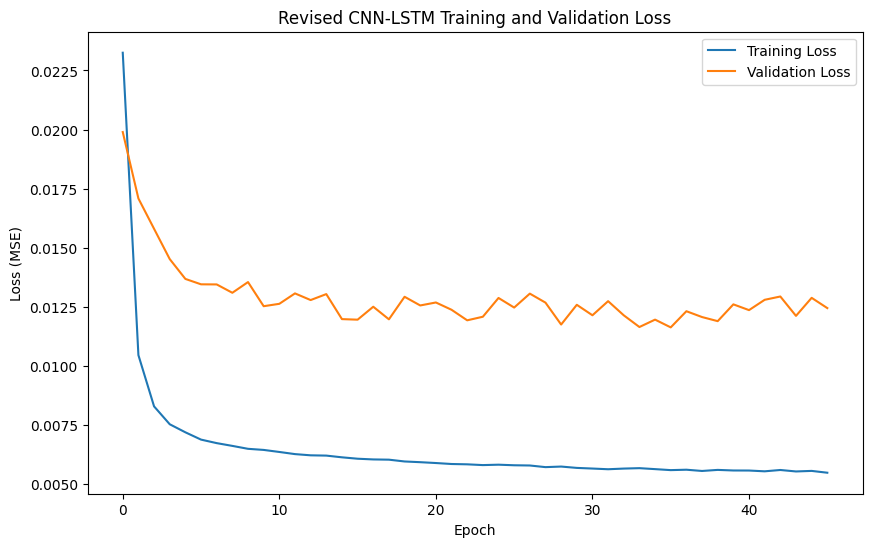

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, LSTM, Dense, Dropout, BatchNormalization
from tensorflow.keras.callbacks import EarlyStopping
import matplotlib.pyplot as plt

# Get the input shape from your sequenced training data
# This assumes you have already run the create_sequences function on your
# final imputed and scaled data.
window_size = X_train_seq.shape[1]
n_features = X_train_seq.shape[2]


# --- 1. Define a Simpler, More Robust CNN-LSTM Architecture ---
print("Building a simplified CNN-LSTM model to combat overfitting...")

model_v2 = Sequential([
    # A single Conv1D layer is often enough to extract features from sequences.
    Conv1D(filters=64, kernel_size=3, activation='relu', input_shape=(window_size, n_features)),
    BatchNormalization(),
    Dropout(0.3),

    # A single LSTM layer. Note the 'tanh' activation, which is standard.
    # return_sequences=False because it's the last recurrent layer before the Dense layers.
    LSTM(50, activation='tanh'),
    Dropout(0.4), # A slightly higher dropout for better regularization

    # A smaller Dense layer before the final output.
    Dense(25, activation='relu'),

    # Final output neuron for regression.
    Dense(1)
])


# --- 2. Compile the Model ---
# We'll use a slightly lower learning rate for more stable training.
optimizer = tf.keras.optimizers.Adam(learning_rate=0.0005)
model_v2.compile(optimizer=optimizer, loss='mse') # Mean Squared Error for regression
model_v2.summary()


# --- 3. Set Up Early Stopping ---
# This prevents the model from training for too long once it stops improving.
early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)


# --- 4. Train the Model ---
history_v2 = model_v2.fit(
    X_train_seq, y_train_seq,
    epochs=100, # Early stopping will likely finish before 100 epochs
    batch_size=32,
    validation_data=(X_val_seq, y_val_seq),
    callbacks=[early_stop],
    verbose=1
)


# --- 5. Plot Training and Validation Loss ---
# This plot is the most important indicator of whether we've reduced overfitting.
plt.figure(figsize=(10, 6))
plt.plot(history_v2.history['loss'], label='Training Loss')
plt.plot(history_v2.history['val_loss'], label='Validation Loss')
plt.title('Revised CNN-LSTM Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss (MSE)')
plt.legend()
plt.savefig("CNN_LSTM_Loss_visualisation.png", dpi=1200, bbox_inches='tight')
plt.show()

In [ ]:
# --- Step 1: Predict on the validation and test sequences ---
print("Making predictions on validation and test sets...")
y_val_pred_scaled = model_v2.predict(X_val_seq)
y_test_pred_scaled = model_v2.predict(X_test_seq)


# --- Step 2: Inverse scale ALL values to their original units (e.g., kWh) ---
print("Inverse-scaling predictions and true values...")

# Inverse scale the model's predictions
y_val_pred = scaler_y.inverse_transform(y_val_pred_scaled)
y_test_pred_original_lstm = scaler_y.inverse_transform(y_test_pred_scaled)

# Inverse scale the true values for a fair comparison
# This is the step that creates the missing 'y_val_true' variable
y_val_true = scaler_y.inverse_transform(y_val_seq.reshape(-1, 1))
y_test_true = scaler_y.inverse_transform(y_test_seq.reshape(-1, 1))


# --- Step 3: Define metrics function and evaluate performance ---
def print_metrics(y_true, y_pred, set_name='Set'):
    mae = mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    r2 = r2_score(y_true, y_pred)

    print(f"\n--- {set_name} Metrics ---")
    print(f"MAE:  {mae:.2f}")
    print(f"RMSE: {rmse:.2f}")
    print(f"R^2:  {r2:.3f}")

# Print metrics for both validation and test sets
print_metrics(y_val_true, y_val_pred, 'CNN-LSTM Validation')
print_metrics(y_test_true, y_test_pred_original_lstm, 'CNN-LSTM Test')


Making predictions on validation and test sets...
122/122 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
122/122 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Inverse-scaling predictions and true values...

--- CNN-LSTM Validation Metrics ---
MAE:  16.70
RMSE: 26.33
R^2:  0.555

--- CNN-LSTM Test Metrics ---
MAE:  19.17
RMSE: 29.69
R^2:  0.539


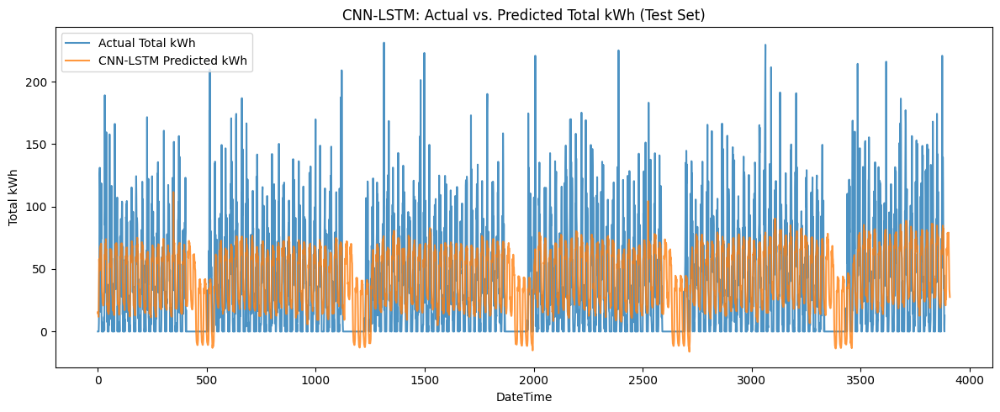

In [ ]:
import matplotlib.pyplot as plt

# --- Step 4: Plot Actual vs. Predicted for the Test Set ---
plt.figure(figsize=(12, 5))
plt.plot(y_test_true, label='Actual Total kWh', alpha=0.8)
plt.plot(y_test_pred, label='CNN-LSTM Predicted kWh', alpha=0.8)

plt.title('CNN-LSTM: Actual vs. Predicted Total kWh (Test Set)')
plt.xlabel('DateTime')
plt.ylabel('Total kWh')
plt.legend()
plt.tight_layout()
plt.savefig("CNN-LSTM_visualisation.png", dpi=1200, bbox_inches='tight')
plt.show()

Hyperparameter Tuning for CNN-LSTM

In [ ]:
!pip install keras-tuner

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 3.3 MB/s eta 0:00:00


In [ ]:
import tensorflow as tf
import keras_tuner as kt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, LSTM, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
import numpy as np
import matplotlib.pyplot as plt

# --- Ensure prerequisite variables exist ---
# This code assumes the following variables are already defined and populated from previous steps:
# X_train_seq, y_train_seq, X_val_seq, y_val_seq

# --- 1. Define the Model Building Function ---
# This function creates a Keras model but uses the 'hp' object to define
# hyperparameters that we want to tune. Keras Tuner will call this function
# repeatedly with different hyperparameter values.

def build_model(hp):
    """Builds a CNN-LSTM model for hyperparameter tuning."""
    model = Sequential()

    # Get the input shape from the training data
    window_size = X_train_seq.shape[1]
    n_features = X_train_seq.shape[2]

    # --- Tune the Conv1D Layer ---
    hp_filters = hp.Int('filters', min_value=32, max_value=128, step=32)
    model.add(Conv1D(
        filters=hp_filters,
        kernel_size=3,
        activation='relu',
        input_shape=(window_size, n_features)
    ))
    model.add(BatchNormalization())

    # --- Tune the Dropout Rate after Conv1D ---
    hp_conv_dropout = hp.Float('conv_dropout', min_value=0.1, max_value=0.5, step=0.1)
    model.add(Dropout(hp_conv_dropout))

    # --- Tune the LSTM Layer ---
    hp_lstm_units = hp.Int('lstm_units', min_value=30, max_value=100, step=20)
    model.add(LSTM(
        units=hp_lstm_units,
        activation='tanh' # Using tanh is standard for LSTMs
    ))

    # --- Tune the Dropout Rate after LSTM ---
    hp_lstm_dropout = hp.Float('lstm_dropout', min_value=0.2, max_value=0.6, step=0.1)
    model.add(Dropout(hp_lstm_dropout))

    # --- Tune the Dense Layer ---
    hp_dense_units = hp.Int('dense_units', min_value=20, max_value=80, step=20)
    model.add(Dense(units=hp_dense_units, activation='relu'))

    # Output layer
    model.add(Dense(1))

    # --- Tune the Learning Rate for the Optimizer ---
    hp_learning_rate = hp.Choice('learning_rate', values=[1e-3, 5e-4, 1e-4])

    model.compile(
        optimizer=Adam(learning_rate=hp_learning_rate),
        loss='mean_squared_error'
    )

    return model

# --- 2. Instantiate the Tuner ---
# We will use RandomSearch, which randomly tries different combinations.
# 'objective' tells the tuner what to minimize (validation loss).
# 'max_trials' is the number of different models to test.
tuner = kt.RandomSearch(
    build_model,
    objective='val_loss',
    max_trials=10,  # Number of model configurations to test
    executions_per_trial=1, # Number of times to train each model
    directory='keras_tuner_dir',
    project_name='ev_demand_forecasting'
)

# You can clear previous results with the following line (optional)
# tuner.reload()

# --- 3. Run the Hyperparameter Search ---
# This is the main training step. It will take some time as it trains multiple models.
print("Starting hyperparameter search...")
tuner.search(
    X_train_seq, y_train_seq,
    epochs=20, # Use a smaller number of epochs for the search
    validation_data=(X_val_seq, y_val_seq)
)
print("Hyperparameter search complete.")


# --- 4. Get the Best Model ---
# Retrieve the best model found by the tuner.
best_model = tuner.get_best_models(num_models=1)[0]

# --- 5. Display the Results ---
print("\n--- Best Model Found ---")
best_model.summary()

# You can also get the best hyperparameters found
best_hyperparameters = tuner.get_best_hyperparameters(num_trials=1)[0]
print("\n--- Best Hyperparameters ---")
print(f"Filters: {best_hyperparameters.get('filters')}")
print(f"Conv Dropout: {best_hyperparameters.get('conv_dropout'):.2f}")
print(f"LSTM Units: {best_hyperparameters.get('lstm_units')}")
print(f"LSTM Dropout: {best_hyperparameters.get('lstm_dropout'):.2f}")
print(f"Dense Units: {best_hyperparameters.get('dense_units')}")
print(f"Learning Rate: {best_hyperparameters.get('learning_rate')}")

Trial 10 Complete [00h 02m 40s]
val_loss: 0.011537224985659122

Best val_loss So Far: 0.011438912712037563
Total elapsed time: 00h 24m 10s
Hyperparameter search complete.

--- Best Model Found ---


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d (Conv1D)                 │ (None, 22, 32)         │         1,376 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 22, 32)         │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 22, 32)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm (LSTM)                     │ (None, 90)             │        44,280 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 90)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 40)             │         3,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │            41 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 49,465 (193.22 KB)

 Trainable params: 49,401 (192.97 KB)

 Non-trainable params: 64 (256.00 B)


--- Best Hyperparameters ---
Filters: 32
Conv Dropout: 0.10
LSTM Units: 90
LSTM Dropout: 0.30
Dense Units: 40
Learning Rate: 0.0005


--- Best Model Summary ---


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d (Conv1D)                 │ (None, 22, 32)         │         1,376 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 22, 32)         │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 22, 32)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm (LSTM)                     │ (None, 90)             │        44,280 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 90)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 40)             │         3,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │            41 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 49,465 (193.22 KB)

 Trainable params: 49,401 (192.97 KB)

 Non-trainable params: 64 (256.00 B)


Training the best model for more epochs...
Epoch 1/150
570/570 ━━━━━━━━━━━━━━━━━━━━ 10s 13ms/step - loss: 0.0058 - val_loss: 0.0125
Epoch 2/150
570/570 ━━━━━━━━━━━━━━━━━━━━ 7s 12ms/step - loss: 0.0058 - val_loss: 0.0120
Epoch 3/150
570/570 ━━━━━━━━━━━━━━━━━━━━ 8s 13ms/step - loss: 0.0057 - val_loss: 0.0123
Epoch 4/150
570/570 ━━━━━━━━━━━━━━━━━━━━ 8s 13ms/step - loss: 0.0059 - val_loss: 0.0117
Epoch 5/150
570/570 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step - loss: 0.0057 - val_loss: 0.0120
Epoch 6/150
570/570 ━━━━━━━━━━━━━━━━━━━━ 8s 13ms/step - loss: 0.0059 - val_loss: 0.0127
Epoch 7/150
570/570 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step - loss: 0.0058 - val_loss: 0.0118
Epoch 8/150
570/570 ━━━━━━━━━━━━━━━━━━━━ 7s 13ms/step - loss: 0.0055 - val_loss: 0.0111
Epoch 9/150
570/570 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step - loss: 0.0055 - val_loss: 0.0118
Epoch 10/150
570/570 ━━━━━━━━━━━━━━━━━━━━ 8s 13ms/step - loss: 0.0057 - val_loss: 0.0116
Epoch 11/150
570/570 ━━━━━━━━━━━━━━━━━━━━ 7s 13ms/step - loss: 0.0057 - va

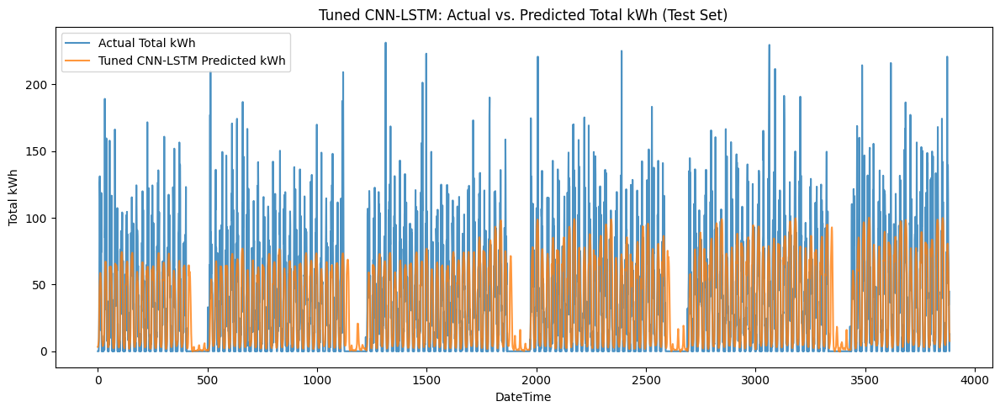

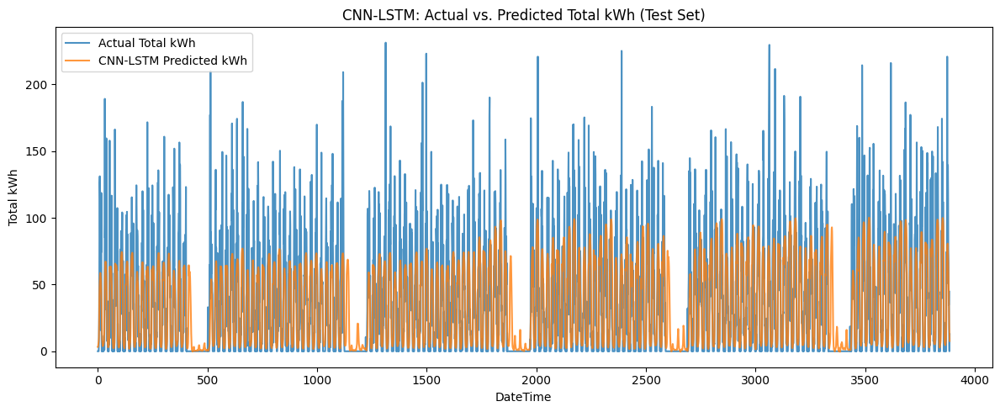

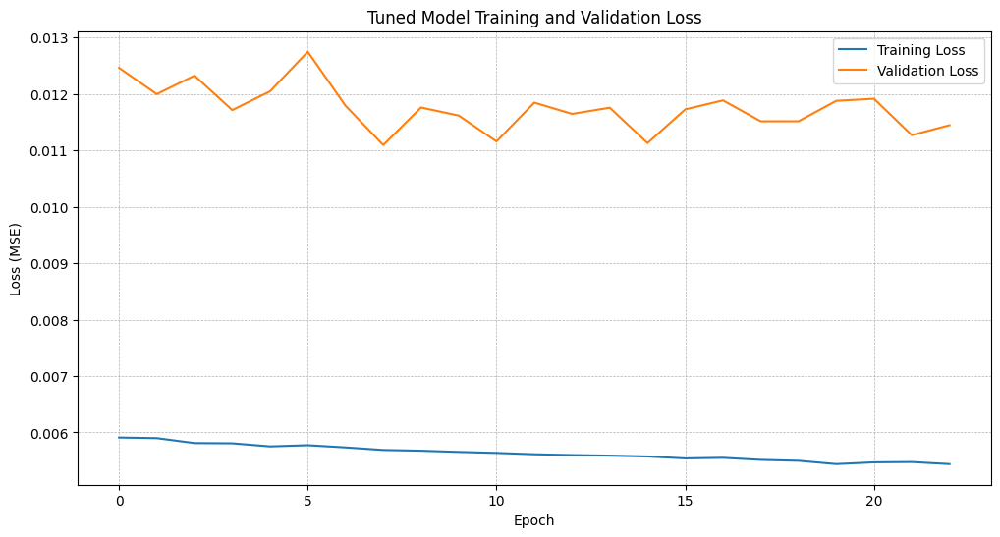

In [ ]:
# --- 1. Retrieve the Best Model Architecture ---
# Get the single best model configuration found by the tuner.
best_model = tuner.get_best_models(num_models=1)[0]
print("--- Best Model Summary ---")
best_model.summary()


# --- 2. Train the Best Model Properly ---
# We train the best model for more epochs to allow it to fully converge.
# EarlyStopping will monitor the validation loss and stop when it no longer improves.
print("\nTraining the best model for more epochs...")
early_stop = EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True, verbose=1)

history_best = best_model.fit(
    X_train_seq, y_train_seq,
    epochs=150,  # A higher number of epochs
    batch_size=32,
    validation_data=(X_val_seq, y_val_seq),
    callbacks=[early_stop]
)


# --- 3. Make Predictions ---
print("\nMaking predictions on validation and test sets...")
y_val_pred_scaled = best_model.predict(X_val_seq)
y_test_pred_scaled = best_model.predict(X_test_seq)


# --- 4. Inverse-Scale Predictions and True Values ---
# Convert the scaled data back to its original units (e.g., kWh) for interpretation.
print("Inverse-scaling the data to original units...")
y_val_pred = scaler_y.inverse_transform(y_val_pred_scaled)
y_test_pred = scaler_y.inverse_transform(y_test_pred_scaled)

y_val_true = scaler_y.inverse_transform(y_val_seq.reshape(-1, 1))
y_test_true = scaler_y.inverse_transform(y_test_seq.reshape(-1, 1))


# --- 5. Evaluate Performance Metrics ---
def print_metrics(y_true, y_pred, set_name='Set'):
    mae = mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    r2 = r2_score(y_true, y_pred)

    print(f"\n--- {set_name} Metrics ---")
    print(f"MAE:  {mae:.2f}")
    print(f"RMSE: {rmse:.2f}")
    print(f"R^2:  {r2:.3f}")

# Print metrics for both validation and test sets
print_metrics(y_val_true, y_val_pred, 'Tuned CNN-LSTM Validation')
print_metrics(y_test_true, y_test_pred, 'Tuned CNN-LSTM Test')


# --- 6. Plot Actual vs. Predicted for the Test Set ---
plt.figure(figsize=(12, 5))
plt.plot(y_test_true, label='Actual Total kWh', alpha=0.8)
plt.plot(y_test_pred, label='Tuned CNN-LSTM Predicted kWh', alpha=0.8)

plt.title('Tuned CNN-LSTM: Actual vs. Predicted Total kWh (Test Set)')
plt.xlabel('DateTime')
plt.ylabel('Total kWh')
plt.legend()
plt.tight_layout()
plt.savefig("CNN-LSTM Tuned.png", dpi=1200, bbox_inches='tight')
plt.show()

plt.figure(figsize=(12, 5))
plt.plot(y_test_true, label='Actual Total kWh', alpha=0.8)
plt.plot(y_test_pred, label='CNN-LSTM Predicted kWh', alpha=0.8)

plt.title('CNN-LSTM: Actual vs. Predicted Total kWh (Test Set)')
plt.xlabel('DateTime')
plt.ylabel('Total kWh')
plt.legend()
plt.tight_layout()
plt.savefig("CNN-LSTM_visualisation.png", dpi=1200, bbox_inches='tight')
plt.show()


# --- 7. Plot Training & Validation Loss ---
# This plot shows how the model learned over the epochs.
plt.figure(figsize=(12, 6))
plt.plot(history_best.history['loss'], label='Training Loss')
plt.plot(history_best.history['val_loss'], label='Validation Loss')
plt.title('Tuned Model Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss (MSE)')
plt.legend()
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.savefig("CNN-LSTM Tuned Loss.png", dpi=1200, bbox_inches='tight')
plt.show()

Compute and Assign Metrics


--- Summary of All Model Performances ---
               Model        MAE       RMSE        R²
0            XGBoost  16.193819  27.798647  0.597386
1     Tuned CNN-LSTM  18.716825  29.185108  0.555036
2  Original CNN-LSTM  19.172660  29.693848  0.539388
3                SVR  21.554392  36.442890  0.308061
4             SARIMA  24.014740  36.789473  0.294838


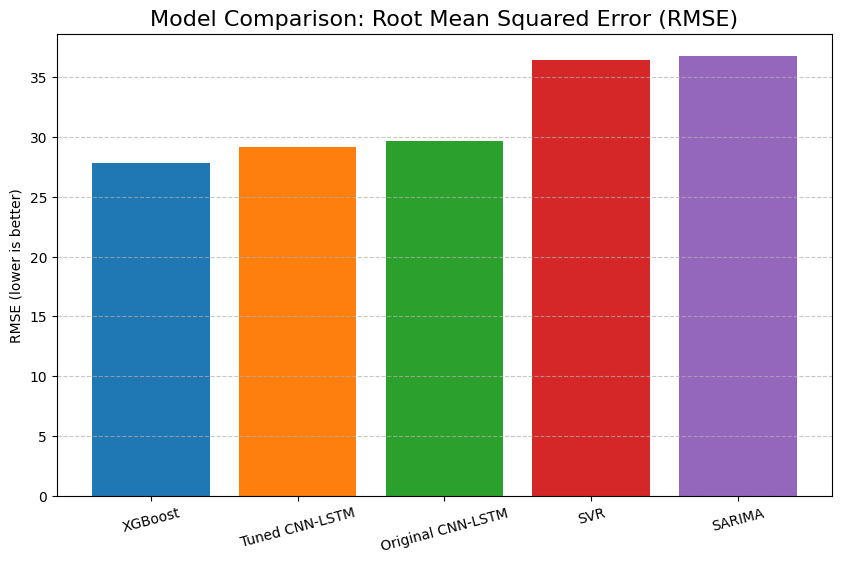

In [ ]:
# --- 8. Final Model Comparison ---
try:
    # Calculate metrics for the Tuned CNN-LSTM model
    tuned_lstm_mae = mean_absolute_error(y_test_true, y_test_pred)
    tuned_lstm_rmse = np.sqrt(mean_squared_error(y_test_true, y_test_pred))
    tuned_lstm_r2 = r2_score(y_test_true, y_test_pred)

    # Calculate metrics for the Original CNN-LSTM model
    # This now uses 'y_test_pred_original_lstm', which should hold the unscaled predictions from the original model
    original_lstm_mae = mean_absolute_error(y_test_true, y_test_pred_original_lstm)
    original_lstm_rmse = np.sqrt(mean_squared_error(y_test_true, y_test_pred_original_lstm))
    original_lstm_r2 = r2_score(y_test_true, y_test_pred_original_lstm)

    # Calculate metrics for other models
    # Note: These models used the original y_test, which has a different length
    # than the y_test_true used for the sequenced LSTM model.
    sarima_mae = mean_absolute_error(y_test, y_test_pred_sarima)
    sarima_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred_sarima))
    sarima_r2 = r2_score(y_test, y_test_pred_sarima)

    svr_mae = mean_absolute_error(y_test, y_test_pred_svr)
    svr_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred_svr))
    svr_r2 = r2_score(y_test, y_test_pred_svr)

    xgb_mae = mean_absolute_error(y_test, y_test_pred_xgb)
    xgb_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred_xgb))
    xgb_r2 = r2_score(y_test, y_test_pred_xgb)

    # Create a DataFrame for comparison
    results_data = {
        'Model': ['SARIMA', 'SVR', 'XGBoost', 'Original CNN-LSTM', 'Tuned CNN-LSTM'],
        'MAE': [sarima_mae, svr_mae, xgb_mae, original_lstm_mae, tuned_lstm_mae],
        'RMSE': [sarima_rmse, svr_rmse, xgb_rmse, original_lstm_rmse, tuned_lstm_rmse],
        'R²': [sarima_r2, svr_r2, xgb_r2, original_lstm_r2, tuned_lstm_r2]
    }
    results_df = pd.DataFrame(results_data).sort_values(by='RMSE').reset_index(drop=True)

    print("\n--- Summary of All Model Performances ---")
    print(results_df.to_string())

    # Create a bar plot for visual comparison of RMSE
    plt.figure(figsize=(10, 6))
    plt.bar(results_df['Model'], results_df['RMSE'], color=['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd'])
    plt.title('Model Comparison: Root Mean Squared Error (RMSE)', fontsize=16)
    plt.ylabel('RMSE (lower is better)')
    plt.xticks(rotation=15)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.savefig("RMSE Comparison_visualisation.png", dpi=1200, bbox_inches='tight')
    plt.savefig("Model_comparison_plot.png", dpi=1200, bbox_inches='tight')
    plt.show()

except NameError as e:
    print(f"\nCould not generate final comparison table: {e}")
    print("Please ensure that predictions from all models (e.g., 'y_test_pred_sarima', 'y_test_pred_original_lstm') are available in memory.")

In [ ]:
import joblib
import os

# --- 9. Save All Trained Models ---
print("\n--- Saving All Trained Models with Proper Names ---")

# Create a directory to save the models if it doesn't exist
models_dir = '/content/keras_tuner_dir/ev_demand_forecasting'
if not os.path.exists(models_dir):
    os.makedirs(models_dir)

try:
    # Save scikit-learn and statsmodels models using joblib
    joblib.dump(svr, os.path.join(models_dir, 'ev_demand_svr_model.joblib'))
    print("SVR model saved successfully.")

    sarima_fit.save(os.path.join(models_dir, 'ev_demand_sarima_model.pkl'))
    print("SARIMA model saved successfully.")

    # Save XGBoost model
    best_xgb.save_model(os.path.join(models_dir, 'ev_demand_xgboost_model.json'))
    print("XGBoost model saved successfully.")

    # Save TensorFlow/Keras models
    model_v2.save(os.path.join(models_dir, 'ev_demand_original_cnnlstm_model.keras'))
    print("Original CNN-LSTM model saved successfully.")

    best_model.save(os.path.join(models_dir, 'ev_demand_tuned_cnnlstm_model.keras'))
    print("Tuned CNN-LSTM model saved successfully.")

except NameError as e:
    print(f"\nCould not save all models: {e}")
    print("Please ensure that all model objects (e.g., 'svr', 'best_xgb', 'sarima_fit', 'model_v2') are available in memory.")



--- Saving All Trained Models with Proper Names ---
SVR model saved successfully.
SARIMA model saved successfully.
XGBoost model saved successfully.
Original CNN-LSTM model saved successfully.
Tuned CNN-LSTM model saved successfully.


In [ ]:

# --- 1. Helper Function to Load All Models ---
# This function loads all the saved models from the 'saved_models' directory.
def load_all_models(models_dir='/content/keras_tuner_dir/ev_demand_forecasting'):
    """Loads all saved models from the specified directory."""
    models = {}
    print("--- Loading Saved Models ---")
    try:
        # Load scikit-learn and statsmodels models
        models['SVR'] = joblib.load(os.path.join(models_dir, 'ev_demand_svr_model.joblib'))
        print("SVR model loaded.")

        # Load XGBoost model
        xgb_model = xgb.XGBRegressor()
        xgb_model.load_model(os.path.join(models_dir, 'ev_demand_xgboost_model.json'))
        models['XGBoost'] = xgb_model
        print("XGBoost model loaded.")

        # Load TensorFlow/Keras models
        models['Original CNN-LSTM'] = tf.keras.models.load_model(os.path.join(models_dir, 'ev_demand_original_cnnlstm_model.keras'))
        print("Original CNN-LSTM model loaded.")

        models['Tuned CNN-LSTM'] = tf.keras.models.load_model(os.path.join(models_dir, 'ev_demand_tuned_cnnlstm_model.keras'))
        print("Tuned CNN-LSTM model loaded.")

    except Exception as e:
        print(f"An error occurred while loading models: {e}")
        print("Please ensure all model files exist in the 'saved_models' directory.")
        return None

    return models

In [ ]:
# --- 2. Master Plotting Function ---
# This function handles the data preparation and plotting for a specific day.
def plot_day_comparison(target_date_str, models, data_dict, title_prefix=""):
    """
    Generates and plots predictions from all models for a single day.

    Args:
        target_date_str (str): The date to plot, in 'YYYY-MM-DD' format.
        models (dict): A dictionary of the loaded model objects.
        data_dict (dict): A dictionary containing necessary data arrays.
        title_prefix (str): A string to prepend to the plot title.
    """

    # Extract necessary data from the dictionary for easier access
    X_test = data_dict['X_test']
    y_test = data_dict['y_test']
    X_test_scaled = data_dict['X_test_scaled']
    X_test_seq = data_dict['X_test_seq']
    scaler_y = data_dict['scaler_y']
    window_size = X_test_seq.shape[1]

    # --- Data Preparation for the Target Day ---
    target_date = pd.to_datetime(target_date_str)
    day_mask = (X_test.index.date == target_date.date())

    if not day_mask.any():
        print(f"Error: No data found for {target_date_str} in the test set.")
        return

    # Get actual values for the day
    y_actual_day = y_test[day_mask]

    # Get feature data for non-sequential models
    X_test_day = X_test[day_mask]

    # Find the start index for sequential models
    start_idx = np.where(X_test.index == y_actual_day.index[0])[0][0]

    # Create the sequences required for the LSTM models for that day
    X_test_day_seq = []
    for i in range(len(y_actual_day)):
        seq_start_index = start_idx + i - window_size
        if seq_start_index < 0: continue

        sequence = X_test_scaled[seq_start_index : start_idx + i]
        X_test_day_seq.append(sequence)

    if not X_test_day_seq:
        print(f"Could not generate sequences for {target_date_str}. Not enough preceding data.")
        return

    X_test_day_seq = np.array(X_test_day_seq)

    # --- Generate Predictions ---
    predictions = {}
    for name, model in models.items():
        print(f"Generating predictions for {name}...")
        if "CNN-LSTM" in name:
            pred_scaled = model.predict(X_test_day_seq, verbose=0)
            predictions[name] = scaler_y.inverse_transform(pred_scaled).flatten()
        else:
            predictions[name] = model.predict(X_test_day)

    # --- Plotting ---
    plt.style.use('seaborn-v0_8-whitegrid')
    plt.figure(figsize=(14, 7))

    plt.plot(y_actual_day.values, 'o-', label='Actual Demand', color='black', linewidth=2.5, markersize=8)

    colors = {'SVR': 'green', 'XGBoost': 'blue', 'Original CNN-LSTM': 'purple', 'Tuned CNN-LSTM': 'red'}
    for name, pred_values in predictions.items():
        plt.plot(pred_values, 's--', label=f'{name} Prediction', color=colors.get(name, 'gray'), linewidth=1.5, markersize=5, alpha=0.9)

    plt.title(f'{title_prefix}: {target_date.strftime("%A, %Y-%m-%d")}', fontsize=18)
    plt.xlabel('Hour of the Day', fontsize=14)
    plt.ylabel('Total kWh', fontsize=14)
    plt.xticks(ticks=np.arange(0, 24, 2))
    plt.legend(fontsize=12)
    plt.ylim(bottom=0)
    plt.savefig("Saved prediction_visualisation.png", dpi=1200, bbox_inches='tight')
    plt.show()

In [ ]:
# --- 3. Load Models and Prepare Data ---
# This block must be run first. It assumes all the necessary data variables
# from your notebook (X_test, y_test, etc.) are available.
try:
    loaded_models = load_all_models()

    data_for_plotting = {
        'X_test': X_test,
        'y_test': y_test,
        'X_test_scaled': X_test_scaled,
        'X_test_seq': X_test_seq,
        'scaler_y': scaler_y
    }
except NameError as e:
    print(f"\nExecution failed: {e}")
    print("Please ensure you have run all previous cells in your notebook to define the necessary data and model variables.")
    loaded_models = None

--- Loading Saved Models ---
SVR model loaded.
XGBoost model loaded.
Original CNN-LSTM model loaded.
Tuned CNN-LSTM model loaded.


Generating predictions for SVR...
Generating predictions for XGBoost...
Generating predictions for Original CNN-LSTM...
Generating predictions for Tuned CNN-LSTM...


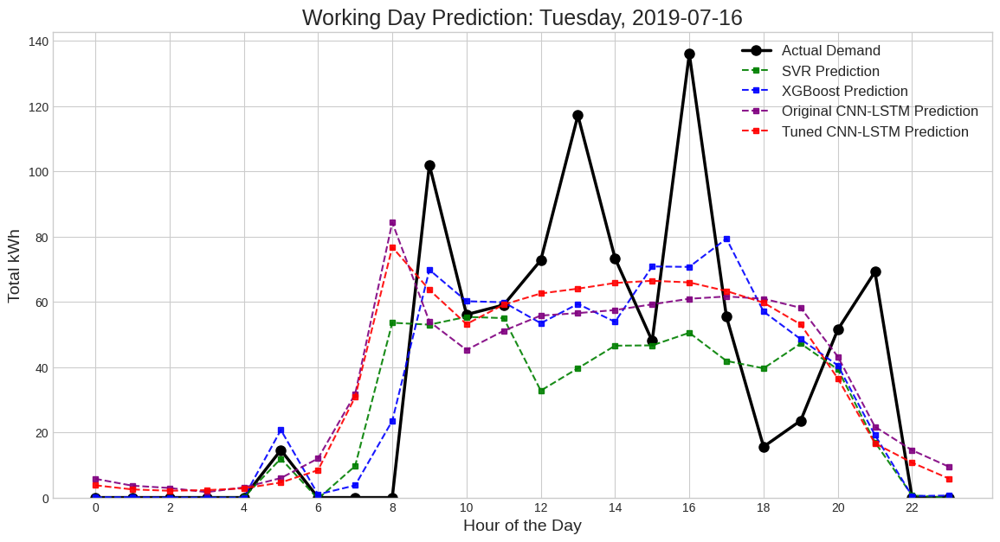

Generating predictions for SVR...
Generating predictions for XGBoost...
Generating predictions for Original CNN-LSTM...
Generating predictions for Tuned CNN-LSTM...


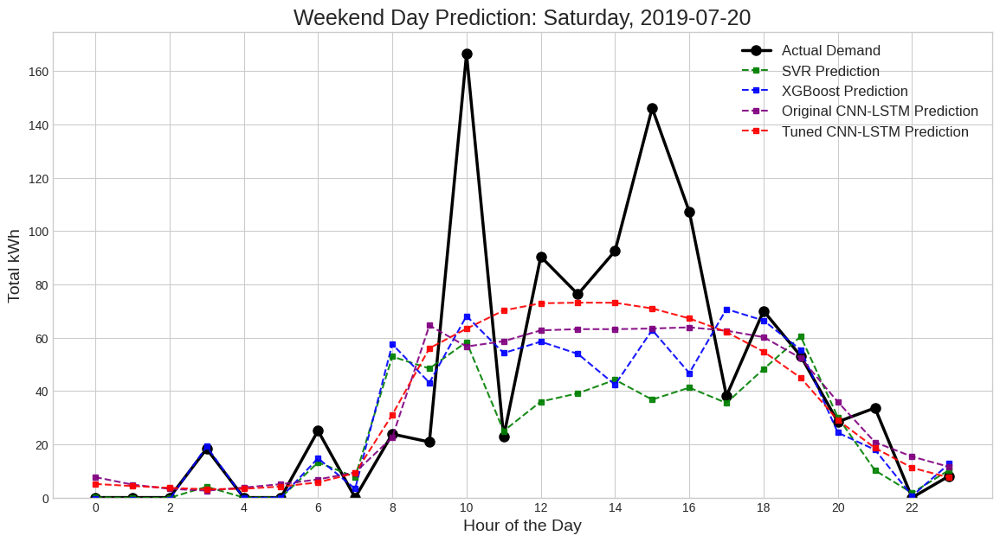

Generating predictions for SVR...
Generating predictions for XGBoost...
Generating predictions for Original CNN-LSTM...
Generating predictions for Tuned CNN-LSTM...


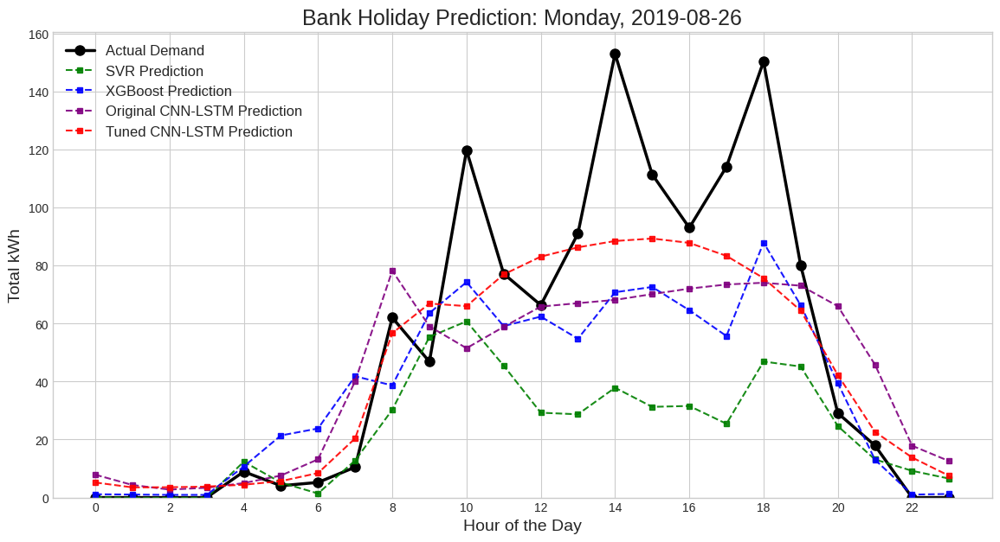

In [ ]:

# --- 4. Generate All Plots ---
if loaded_models:
    # Plot for a Working Day
    plot_day_comparison(
        target_date_str='2019-07-16',
        models=loaded_models,
        data_dict=data_for_plotting,
        title_prefix="Working Day Prediction"
    )

    # Plot for a Weekend Day
    plot_day_comparison(
        target_date_str='2019-07-20',
        models=loaded_models,
        data_dict=data_for_plotting,
        title_prefix="Weekend Day Prediction"
    )

    # Plot for a Bank Holiday
    plot_day_comparison(
        target_date_str='2019-08-26',
        models=loaded_models,
        data_dict=data_for_plotting,
        title_prefix="Bank Holiday Prediction"
    )


In [ ]:
# This function handles the data preparation and plotting for a specific 7-day period.
def plot_week_comparison(start_date_str, models, data_dict, title_prefix=""):
    """
    Generates and plots predictions from all models for a single week.

    Args:
        start_date_str (str): The start date of the week to plot, in 'YYYY-MM-DD' format.
        models (dict): A dictionary of the loaded model objects.
        data_dict (dict): A dictionary containing necessary data arrays.
        title_prefix (str): A string to prepend to the plot title.
    """

    # Extract necessary data from the dictionary
    X_test = data_dict['X_test']
    y_test = data_dict['y_test']
    X_test_scaled = data_dict['X_test_scaled']
    X_test_seq = data_dict['X_test_seq']
    scaler_y = data_dict['scaler_y']
    window_size = X_test_seq.shape[1]

    # --- Data Preparation for the Target Week ---
    start_date = pd.to_datetime(start_date_str)
    end_date = start_date + pd.Timedelta(days=6)
    week_mask = (X_test.index.date >= start_date.date()) & (X_test.index.date <= end_date.date())

    if not week_mask.any():
        print(f"Error: No data found for the week starting {start_date_str} in the test set.")
        return

    # Get actual values and feature data for the week
    y_actual_week = y_test[week_mask]
    X_test_week = X_test[week_mask]

    # Find the start index for sequential models
    try:
        start_idx = np.where(X_test.index == y_actual_week.index[0])[0][0]
    except IndexError:
        print(f"Error: Could not find the start of the week {start_date_str} in the test data index.")
        return

    # Create the sequences required for the LSTM models for the entire week
    X_test_week_seq = []
    for i in range(len(y_actual_week)):
        seq_start_index = start_idx + i - window_size
        if seq_start_index < 0: continue

        sequence = X_test_scaled[seq_start_index : start_idx + i]
        X_test_week_seq.append(sequence)

    if not X_test_week_seq:
        print(f"Could not generate sequences for the week starting {start_date_str}.")
        return

    X_test_week_seq = np.array(X_test_week_seq)

    # --- Generate Predictions ---
    predictions = {}
    for name, model in models.items():
        print(f"Generating predictions for {name}...")
        if "CNN-LSTM" in name:
            pred_scaled = model.predict(X_test_week_seq, verbose=0)
            predictions[name] = scaler_y.inverse_transform(pred_scaled).flatten()
        else:
            predictions[name] = model.predict(X_test_week)

    # --- Plotting ---
    plt.style.use('seaborn-v0_8-whitegrid')
    plt.figure(figsize=(18, 8))

    plt.plot(y_actual_week.values, 'o-', label='Actual Demand', color='black', linewidth=2, markersize=5)

    colors = {'SVR': 'green', 'XGBoost': 'blue', 'Original CNN-LSTM': 'purple', 'Tuned CNN-LSTM': 'red'}
    for name, pred_values in predictions.items():
        plt.plot(pred_values, 's--', label=f'{name} Prediction', color=colors.get(name, 'gray'), linewidth=1.5, markersize=4, alpha=0.8)

    plt.title(f'{title_prefix}: Week of {start_date.strftime("%Y-%m-%d")} to {end_date.strftime("%Y-%m-%d")}', fontsize=18)
    plt.xlabel('Hour of the Week (0-167)', fontsize=14)
    plt.ylabel('Total kWh', fontsize=14)
    plt.xticks(ticks=np.arange(0, 168, 24), labels=['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])
    plt.legend(fontsize=12)
    plt.ylim(bottom=0)
    plt.grid(True, which='both', linestyle='--', linewidth=0.5)
    plt.savefig("Saved visuals_visualisation.png", dpi=1200, bbox_inches='tight')
    plt.show()

Generating predictions for SVR...
Generating predictions for XGBoost...
Generating predictions for Original CNN-LSTM...
Generating predictions for Tuned CNN-LSTM...


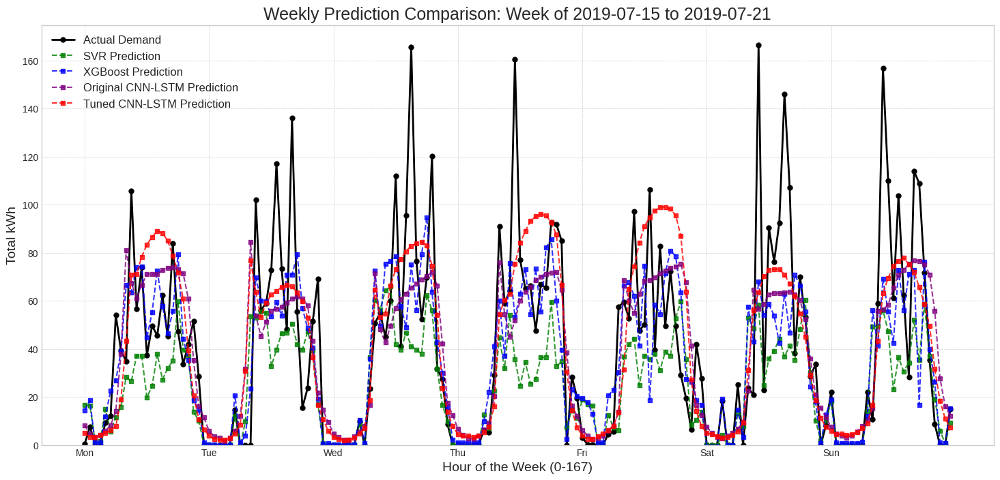

In [ ]:
if loaded_models:
    # Plot for a sample week from the test data
    plot_week_comparison(
        start_date_str='2019-07-15', # A sample week in July
        models=loaded_models,
        data_dict=data_for_plotting,
        title_prefix="Weekly Prediction Comparison"
    )

Generating predictions for SVR...
Generating predictions for XGBoost...
Generating predictions for Original CNN-LSTM...
Generating predictions for Tuned CNN-LSTM...


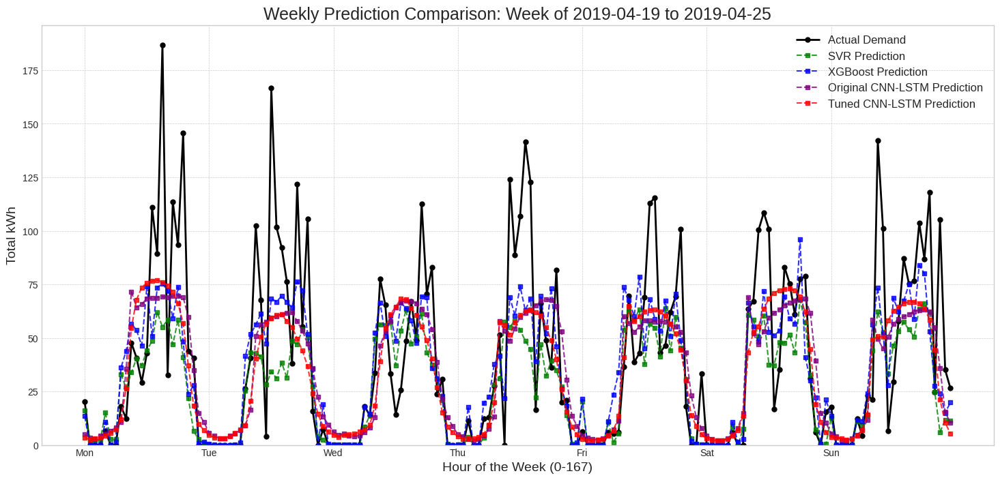

In [ ]:
if loaded_models:
    # Plot for a sample week from the test data
    plot_week_comparison(
        start_date_str='2019-04-19', # A sample week in July
        models=loaded_models,
        data_dict=data_for_plotting,
        title_prefix="Weekly Prediction Comparison"
    )

In [ ]:
!pip install optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 395.9/395.9 kB 19.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 247.0/247.0 kB 26.9 MB/s eta 0:00:00


--- Starting XGBoost Hyperparameter Optimization with Optuna ---

--- Optimization Complete ---
Number of finished trials: 50
Best trial:
  Value (Validation RMSE): 22.8756
  Params: 
    n_estimators: 1294
    learning_rate: 0.005274754261966932
    max_depth: 5
    subsample: 0.8765362461082002
    colsample_bytree: 0.8347553723695031
    min_child_weight: 6
    gamma: 6.758264724265295e-07
    lambda: 0.0001438677527582901
    alpha: 1.0099561224137736e-08

--- Training Final Model with Optimal Parameters ---

--- Final Optimized Model Performance on Validation Set ---
MAE: 11.8570
RMSE: 20.3589
R^2:  0.7340

--- Final Optimized Model Performance on Test Set ---
MAE: 16.0560
RMSE: 27.1123
R^2:  0.6170


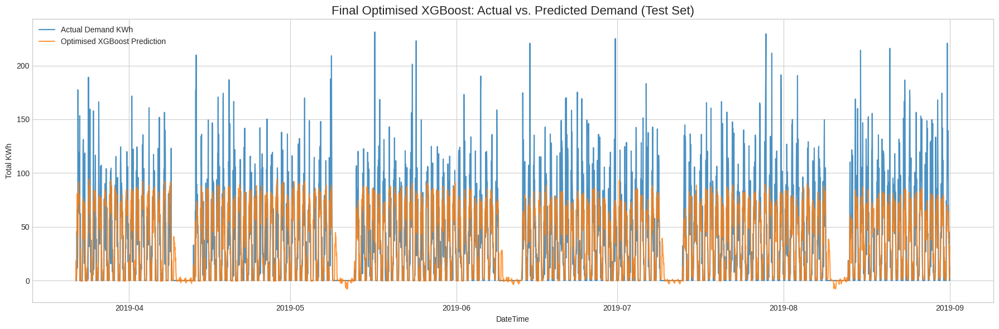


--- Saving the Optimized XGBoost Model ---
Optimized model saved to '/content/keras_tuner_dir/ev_demand_forecasting/ev_demand_optimized_xgboost_model.json'


In [ ]:
import optuna

# --- 1. Define the Objective Function for Optuna ---
def objective(trial):
    params = {
        'objective': 'reg:squarederror', 'eval_metric': 'rmse',
        'n_estimators': trial.suggest_int('n_estimators', 400, 1500),
        'learning_rate': trial.suggest_float('learning_rate', 1e-3, 0.1, log=True),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'subsample': trial.suggest_float('subsample', 0.6, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.6, 1.0),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
        'gamma': trial.suggest_float('gamma', 1e-8, 1.0, log=True),
        'lambda': trial.suggest_float('lambda', 1e-8, 1.0, log=True),
        'alpha': trial.suggest_float('alpha', 1e-8, 1.0, log=True),
        'seed': 42
    }
    model = xgb.XGBRegressor(**params)
    model.fit(X_train, y_train, eval_set=[(X_val, y_val)], verbose=False)
    preds = model.predict(X_val)
    rmse = np.sqrt(mean_squared_error(y_val, preds))
    return rmse

# --- 2. Create and Run the Optuna Study ---
print("--- Starting XGBoost Hyperparameter Optimization with Optuna ---")
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=50)

# --- 3. Display the Best Results ---
print("\n--- Optimization Complete ---")
print(f"Number of finished trials: {len(study.trials)}")
print("Best trial:")
best_trial = study.best_trial
print(f"  Value (Validation RMSE): {best_trial.value:.4f}")
print("  Params: ")
for key, value in best_trial.params.items():
    print(f"    {key}: {value}")

# --- 4. Train Final Model with Best Parameters and Evaluate ---
print("\n--- Training Final Model with Optimal Parameters ---")
best_params = best_trial.params
final_xgb_model = xgb.XGBRegressor(**best_params, seed=42)
X_train_val = pd.concat([X_train, X_val])
y_train_val = pd.concat([y_train, y_val])
final_xgb_model.fit(X_train_val, y_train_val, verbose=False)

# --- 5. Evaluate on Validation and Test Sets ---
y_val_pred_optimized = final_xgb_model.predict(X_val)
y_test_pred_optimized = final_xgb_model.predict(X_test)

val_mae = mean_absolute_error(y_val, y_val_pred_optimized)
val_rmse = np.sqrt(mean_squared_error(y_val, y_val_pred_optimized))
val_r2 = r2_score(y_val, y_val_pred_optimized)

test_mae = mean_absolute_error(y_test, y_test_pred_optimized)
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred_optimized))
test_r2 = r2_score(y_test, y_test_pred_optimized)

print("\n--- Final Optimized Model Performance on Validation Set ---")
print(f"MAE: {val_mae:.4f}")
print(f"RMSE: {val_rmse:.4f}")
print(f"R^2:  {val_r2:.4f}")

print("\n--- Final Optimized Model Performance on Test Set ---")
print(f"MAE: {test_mae:.4f}")
print(f"RMSE: {test_rmse:.4f}")
print(f"R^2:  {test_r2:.4f}")

# --- 6. Save the Optimized Model ---
print("\n--- Saving the Optimized XGBoost Model ---")
models_dir = '/content/keras_tuner_dir/ev_demand_forecasting'
if not os.path.exists(models_dir):
    os.makedirs(models_dir)
final_xgb_model.save_model(os.path.join(models_dir, 'ev_demand_optimized_xgboost_model.json'))
print(f"Optimized model saved to '{os.path.join(models_dir, 'ev_demand_optimized_xgboost_model.json')}'")


--- Generating Actual vs. Predicted Plot ---


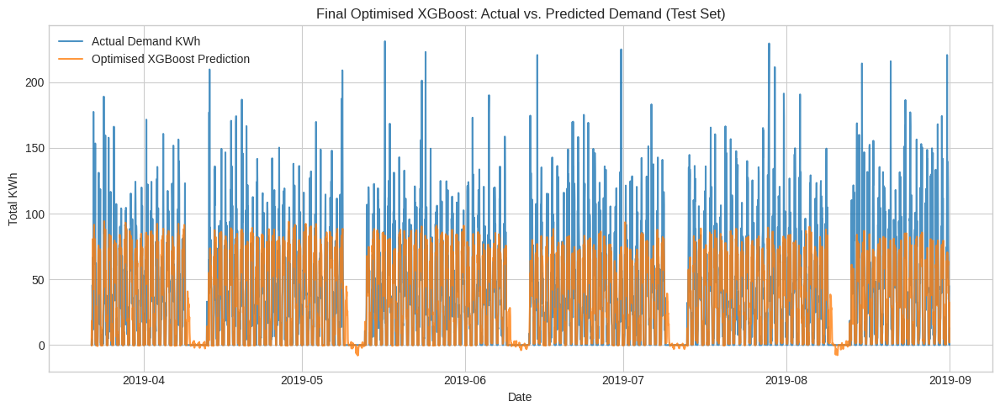

In [ ]:
# --- 6. Plot Actual vs. Predicted on Test Set (No Grid) ---
print("\n--- Generating Actual vs. Predicted Plot ---")

# Create a pandas Series for the predictions with the same index as y_test
y_test_pred_series = pd.Series(y_test_pred_optimized, index=y_test.index)

plt.figure(figsize=(12, 5))

# Plot the actual values from the test set
plt.plot(y_test, label='Actual Demand KWh', alpha=0.8)

# Plot the predictions from the final XGBoost model
plt.plot(y_test_pred_series, label='Optimised XGBoost Prediction', alpha=0.8)

# --- Formatting ---
plt.title('Final Optimised XGBoost: Actual vs. Predicted Demand (Test Set)')
plt.xlabel('Date')
plt.ylabel('Total KWh')
plt.legend()
plt.tight_layout()

# --- Save the Figure ---
plt.savefig("XGBoost_final_timeseries_visualisation_no_grid.png", dpi=1200)

plt.show()

--- Loading model from: /content/keras_tuner_dir/ev_demand_forecasting/ev_demand_optimized_xgboost_model.json ---
✅ Model loaded successfully.

--- Generating Feature Importance Plot ---


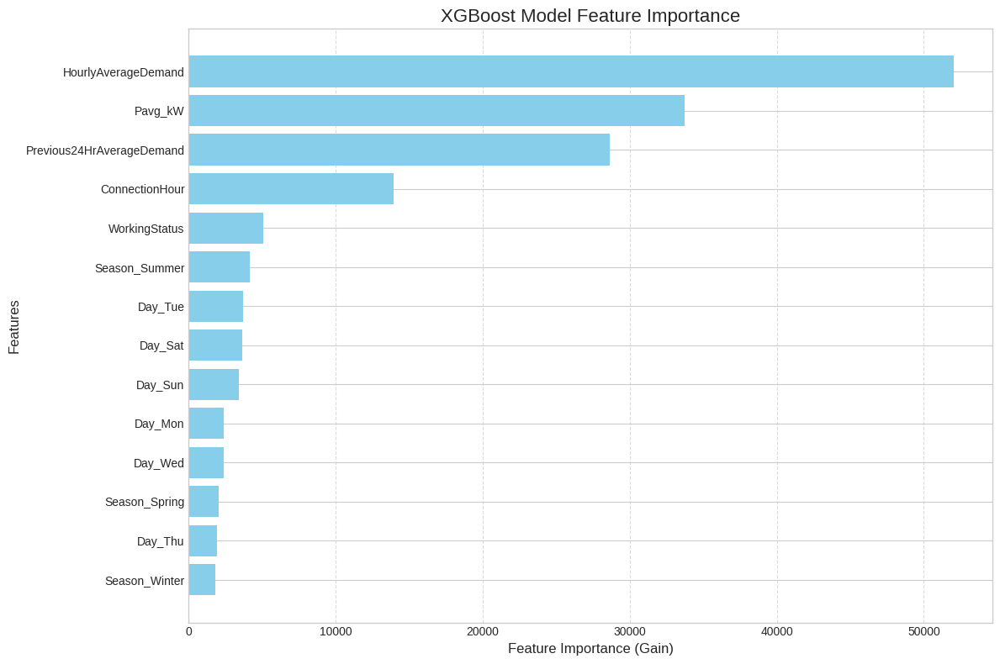


✅ Feature importance plot saved to: project_visualizations/xgboost_feature_importance.png


In [ ]:
import xgboost as xgb
import matplotlib.pyplot as plt
import pandas as pd
import os

# =====================
# 1. SETUP
# =====================

# Define the path to your saved, optimized XGBoost model
MODELS_DIR = "/content/keras_tuner_dir/ev_demand_forecasting"
MODEL_PATH = os.path.join(MODELS_DIR, 'ev_demand_optimized_xgboost_model.json')

# Define where to save the output plot
SAVE_DIR = "project_visualizations"
if not os.path.exists(SAVE_DIR):
    os.makedirs(SAVE_DIR)

# =====================
# 2. LOAD MODEL AND EXTRACT IMPORTANCE
# =====================

def plot_feature_importance(model_path, save_dir):
    """
    Loads a trained XGBoost model and plots its feature importance.
    """
    print(f"--- Loading model from: {model_path} ---")

    try:
        # Load the trained XGBoost model
        model = xgb.XGBRegressor()
        model.load_model(model_path)
        print("✅ Model loaded successfully.")

        # Get feature importance scores. 'gain' is a good metric as it represents
        # the relative contribution of the feature to the model.
        importance_scores = model.get_booster().get_score(importance_type='gain')

        if not importance_scores:
            print("❌ Error: Could not retrieve feature importance scores from the model.")
            return

        # Create a pandas DataFrame for easier sorting and plotting
        importance_df = pd.DataFrame({
            'Feature': list(importance_scores.keys()),
            'Importance': list(importance_scores.values())
        }).sort_values(by='Importance', ascending=True)

        # =====================
        # 3. VISUALIZATION
        # =====================

        print("\n--- Generating Feature Importance Plot ---")

        plt.style.use('seaborn-v0_8-whitegrid')
        plt.figure(figsize=(12, 8))

        # Create a horizontal bar plot
        plt.barh(importance_df['Feature'], importance_df['Importance'], color='skyblue')

        plt.xlabel("Feature Importance (Gain)", fontsize=12)
        plt.ylabel("Features", fontsize=12)
        plt.title("XGBoost Model Feature Importance", fontsize=16)
        plt.grid(axis='x', linestyle='--', alpha=0.7)
        plt.tight_layout()

        # Save the plot
        save_path = os.path.join(save_dir, "xgboost_feature_importance.png")
        plt.savefig(save_path, dpi=1200, bbox_inches='tight')
        plt.show()

        print(f"\n✅ Feature importance plot saved to: {save_path}")

    except FileNotFoundError:
        print(f"❌ CRITICAL ERROR: Model file not found at '{model_path}'.")
        print("Please ensure you have run the Optuna optimization pipeline to save the model.")
    except Exception as e:
        print(f"An unexpected error occurred: {e}")

# =====================
# 4. MAIN EXECUTION
# =====================

if __name__ == "__main__":
    plot_feature_importance(MODEL_PATH, SAVE_DIR)


--- Generating Comparison Plots for Optimized Model ---
--- Loading Models for Comparison ---
Optimized XGBoost model loaded.
Tuned CNN-LSTM model loaded.

--- Generating Daily Comparison Plots ---
Generating predictions for Optimized XGBoost...
Generating predictions for Tuned CNN-LSTM...
Plot saved as: Optimized_Model_Comparison_(Working_Day)_20190716.png


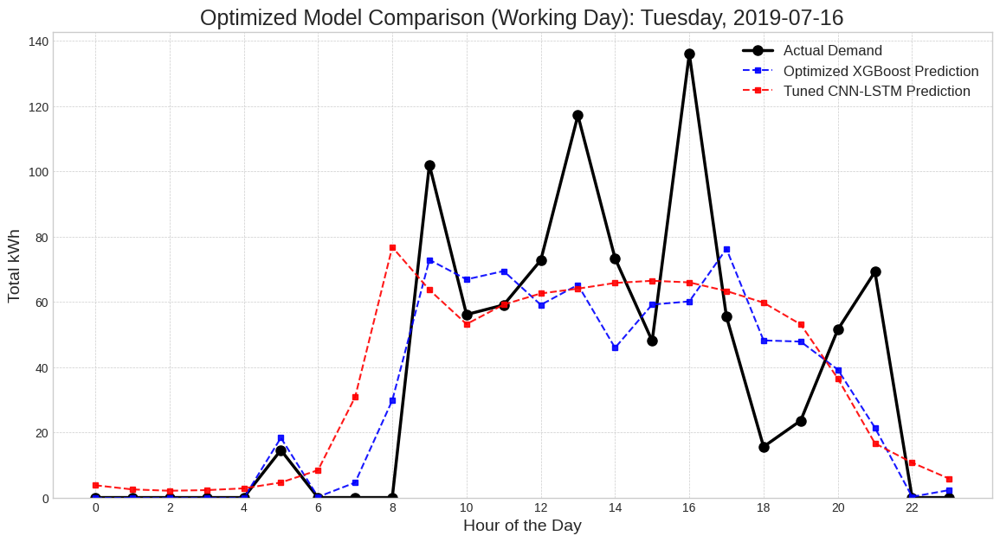

Generating predictions for Optimized XGBoost...
Generating predictions for Tuned CNN-LSTM...
Plot saved as: Optimized_Model_Comparison_(Weekend_Day)_20190720.png


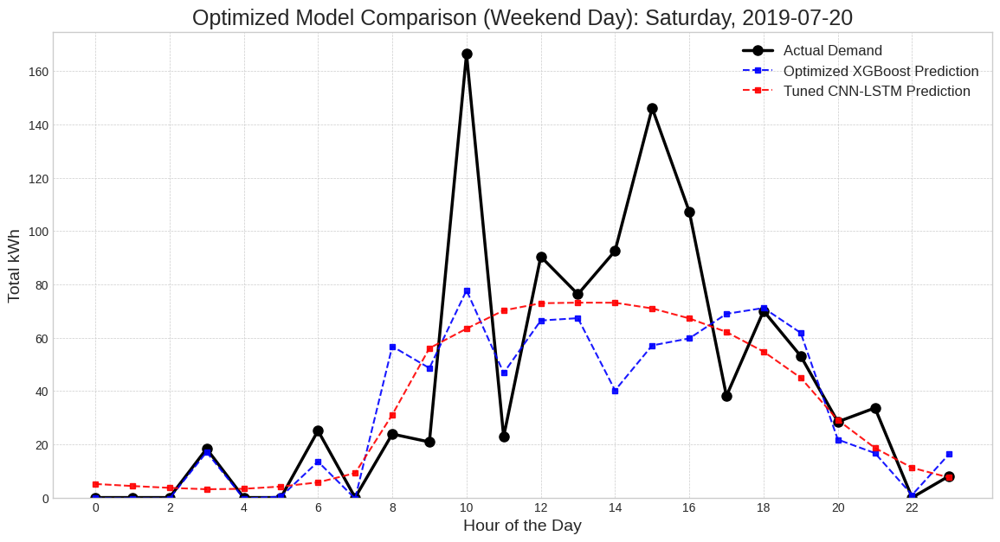

Generating predictions for Optimized XGBoost...
Generating predictions for Tuned CNN-LSTM...
Plot saved as: Optimized_Model_Comparison_(Bank_Holiday)_20190826.png


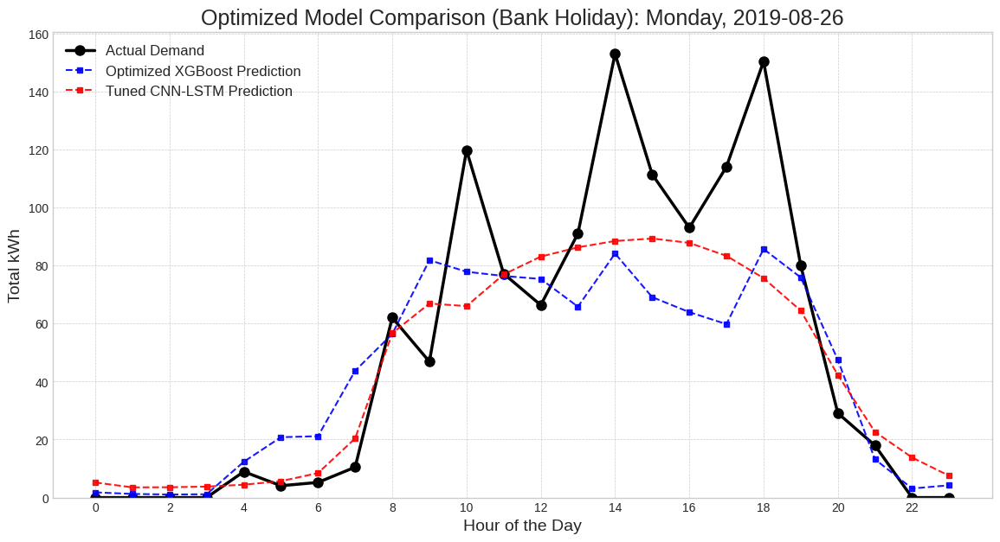


--- Generating Weekly Comparison Plots ---
Generating predictions for Optimized XGBoost...
Generating predictions for Tuned CNN-LSTM...
Plot saved as: Optimized_Model_Comparison_(Typical_Week)_20190715.png


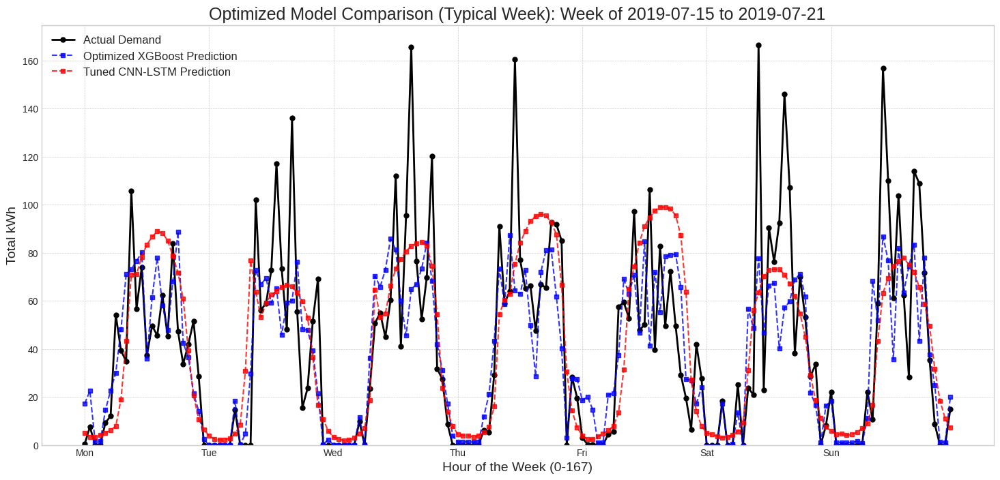

Generating predictions for Optimized XGBoost...
Generating predictions for Tuned CNN-LSTM...
Plot saved as: Optimized_Model_Comparison_(Easter_Wek)_20190419.png


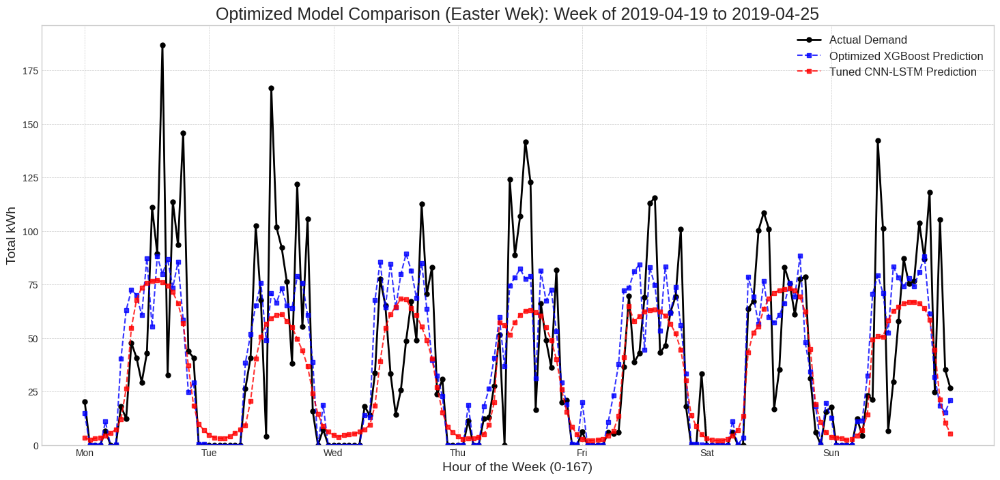

Generating predictions for Optimized XGBoost...
Generating predictions for Tuned CNN-LSTM...
Plot saved as: Optimized_Model_Comparison_(Christmas_Week)_20181224.png


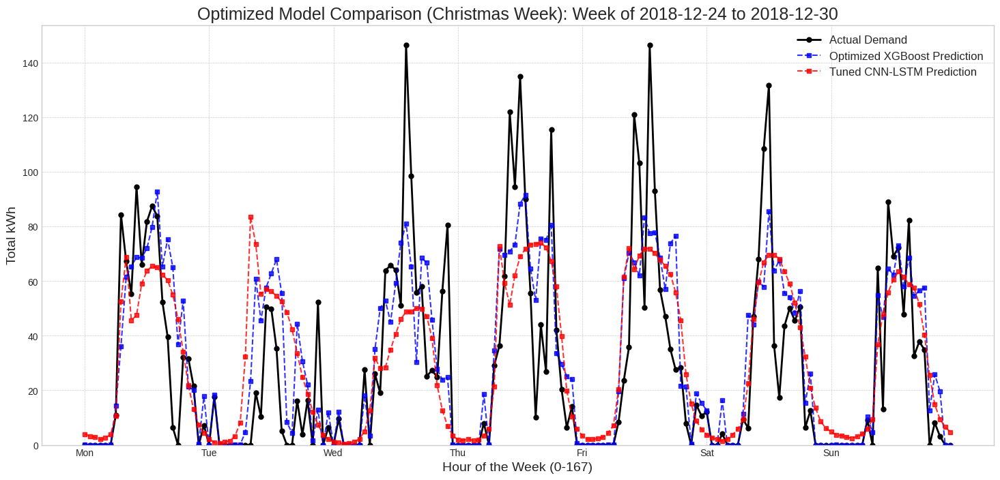

In [ ]:
# --- 6. Visualization and Comparison Pipeline ---
print("\n--- Generating Comparison Plots for Optimized Model ---")

def load_comparison_models(models_dir='/content/keras_tuner_dir/ev_demand_forecasting'):
    """Loads all models needed for final comparison plots."""
    models = {}
    print("--- Loading Models for Comparison ---")
    try:
        # Load the newly optimized XGBoost model
        xgb_opt_model = xgb.XGBRegressor()
        xgb_opt_model.load_model(os.path.join(models_dir, 'ev_demand_optimized_xgboost_model.json'))
        models['Optimized XGBoost'] = xgb_opt_model
        print("Optimized XGBoost model loaded.")

        # Load the tuned CNN-LSTM model
        models['Tuned CNN-LSTM'] = tf.keras.models.load_model(os.path.join(models_dir, 'ev_demand_tuned_cnnlstm_model.keras'))
        print("Tuned CNN-LSTM model loaded.")

    except Exception as e:
        print(f"An error occurred while loading models for plotting: {e}")
        return None
    return models

def plot_day_comparison_optimized(target_date_str, models, data_dict, title_prefix="", data_split='test'):
    """Generates and plots predictions from optimized models for a single day."""
    if data_split == 'validation':
        X_data, y_data, X_scaled = data_dict['X_val'], data_dict['y_val'], data_dict['X_val_scaled']
    else:
        X_data, y_data, X_scaled = data_dict['X_test'], data_dict['y_test'], data_dict['X_test_scaled']

    scaler_y, window_size = data_dict['scaler_y'], 24

    target_date = pd.to_datetime(target_date_str)
    day_mask = (X_data.index.date == target_date.date())

    if not day_mask.any():
        print(f"Error: No data for {target_date_str} in '{data_split}' set.")
        return

    y_actual_day, X_day = y_data[day_mask], X_data[day_mask]

    try:
        start_idx = np.where(X_data.index == y_actual_day.index[0])[0][0]
    except IndexError:
        print(f"Error: Could not find start of day {target_date_str} in index.")
        return

    X_day_seq = np.array([X_scaled[start_idx + i - window_size : start_idx + i] for i in range(len(y_actual_day))])

    predictions = {}
    for name, model in models.items():
        print(f"Generating predictions for {name}...")
        if "CNN-LSTM" in name:
            pred_scaled = model.predict(X_day_seq, verbose=0)
            predictions[name] = scaler_y.inverse_transform(pred_scaled).flatten()
        else:
            predictions[name] = model.predict(X_day)

    plt.style.use('seaborn-v0_8-whitegrid')
    plt.figure(figsize=(14, 7))
    plt.plot(y_actual_day.values, 'o-', label='Actual Demand', color='black', linewidth=2.5, markersize=8)

    colors = {'Optimized XGBoost': 'blue', 'Tuned CNN-LSTM': 'red'}
    for name, pred_values in predictions.items():
        plt.plot(pred_values, 's--', label=f'{name} Prediction', color=colors.get(name, 'gray'), linewidth=1.5, markersize=5, alpha=0.9)

    plt.title(f'{title_prefix}: {target_date.strftime("%A, %Y-%m-%d")}', fontsize=18)
    plt.xlabel('Hour of the Day', fontsize=14)
    plt.ylabel('Total kWh', fontsize=14)
    plt.xticks(ticks=np.arange(0, 24, 2))
    plt.legend(fontsize=12)
    plt.ylim(bottom=0)
    plt.grid(True, which='both', linestyle='--', linewidth=0.5)
    filename = f"{title_prefix.replace(' ', '_')}_{target_date.strftime('%Y%m%d')}.png"
    plt.savefig(filename, dpi=1200, bbox_inches='tight')
    print(f"Plot saved as: {filename}")
    plt.show()

def plot_week_comparison_optimized(start_date_str, models, data_dict, title_prefix="", data_split='test'):
    """Generates and plots predictions from optimized models for a single week."""
    if data_split == 'validation':
        X_data, y_data, X_scaled = data_dict['X_val'], data_dict['y_val'], data_dict['X_val_scaled']
    else:
        X_data, y_data, X_scaled = data_dict['X_test'], data_dict['y_test'], data_dict['X_test_scaled']

    scaler_y, window_size = data_dict['scaler_y'], 24

    start_date = pd.to_datetime(start_date_str)
    end_date = start_date + pd.Timedelta(days=6)
    week_mask = (X_data.index.date >= start_date.date()) & (X_data.index.date <= end_date.date())

    if not week_mask.any():
        print(f"Error: No data for week starting {start_date_str} in '{data_split}' set.")
        return

    y_actual_week, X_week = y_data[week_mask], X_data[week_mask]

    try:
        start_idx = np.where(X_data.index == y_actual_week.index[0])[0][0]
    except IndexError:
        print(f"Error: Could not find start of week {start_date_str} in index.")
        return

    X_week_seq = np.array([X_scaled[start_idx + i - window_size : start_idx + i] for i in range(len(y_actual_week))])

    predictions = {}
    for name, model in models.items():
        print(f"Generating predictions for {name}...")
        if "CNN-LSTM" in name:
            pred_scaled = model.predict(X_week_seq, verbose=0)
            predictions[name] = scaler_y.inverse_transform(pred_scaled).flatten()
        else:
            predictions[name] = model.predict(X_week)

    plt.style.use('seaborn-v0_8-whitegrid')
    plt.figure(figsize=(18, 8))
    plt.plot(y_actual_week.values, 'o-', label='Actual Demand', color='black', linewidth=2, markersize=5)

    colors = {'Optimized XGBoost': 'blue', 'Tuned CNN-LSTM': 'red'}
    for name, pred_values in predictions.items():
        plt.plot(pred_values, 's--', label=f'{name} Prediction', color=colors.get(name, 'gray'), linewidth=1.5, markersize=4, alpha=0.8)

    plt.title(f'{title_prefix}: Week of {start_date.strftime("%Y-%m-%d")} to {end_date.strftime("%Y-%m-%d")}', fontsize=18)
    plt.xlabel('Hour of the Week (0-167)', fontsize=14)
    plt.ylabel('Total kWh', fontsize=14)
    plt.xticks(ticks=np.arange(0, 168, 24), labels=['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])
    plt.legend(fontsize=12)
    plt.ylim(bottom=0)
    plt.grid(True, which='both', linestyle='--', linewidth=0.5)
    # Save the plot
    filename = f"{title_prefix.replace(' ', '_')}_{start_date.strftime('%Y%m%d')}.png"
    plt.savefig(filename, dpi=1200, bbox_inches='tight')
    print(f"Plot saved as: {filename}")
    plt.show()

try:
    comparison_models = load_comparison_models()
    data_for_plotting = {
        'X_test': X_test, 'y_test': y_test, 'X_test_scaled': X_test_scaled,
        'X_val': X_val, 'y_val': y_val, 'X_val_scaled': X_val_scaled,
        'scaler_y': scaler_y
    }

    if comparison_models:
        # --- 7. Generate Daily Comparison Plots ---
        print("\n--- Generating Daily Comparison Plots ---")
        plot_day_comparison_optimized(
            target_date_str='2019-07-16',
            models=comparison_models,
            data_dict=data_for_plotting,
            title_prefix="Optimized Model Comparison (Working Day)",
            data_split='test'
        )
        plot_day_comparison_optimized(
            target_date_str='2019-07-20',
            models=comparison_models,
            data_dict=data_for_plotting,
            title_prefix="Optimized Model Comparison (Weekend Day)",
            data_split='test'
        )
        plot_day_comparison_optimized(
            target_date_str='2019-08-26',
            models=comparison_models,
            data_dict=data_for_plotting,
            title_prefix="Optimized Model Comparison (Bank Holiday)",
            data_split='test'
        )

        # --- 8. Generate Weekly Comparison Plots ---
        print("\n--- Generating Weekly Comparison Plots ---")
        plot_week_comparison_optimized(
            start_date_str='2019-07-15',
            models=comparison_models,
            data_dict=data_for_plotting,
            title_prefix="Optimized Model Comparison (Typical Week)",
            data_split='test'
        )
        plot_week_comparison_optimized(
            start_date_str='2019-04-19',
            models=comparison_models,
            data_dict=data_for_plotting,
            title_prefix="Optimized Model Comparison (Easter Wek)",
            data_split='test'
        )
        plot_week_comparison_optimized(
            start_date_str='2018-12-24',
            models=comparison_models,
            data_dict=data_for_plotting,
            title_prefix="Optimized Model Comparison (Christmas Week)",
            data_split='validation'
        )
except NameError as e:
    print(f"\nPlotting failed: {e}. Ensure all data variables (X_train, y_val, etc.) are defined.")

--- Training Quantile Regression Models ---
Training model for quantile: 0.10
Model for quantile 0.10 saved to /content/keras_tuner_dir/ev_demand_forecasting/ev_demand_xgb_quantile_10.json
Training model for quantile: 0.50
Model for quantile 0.50 saved to /content/keras_tuner_dir/ev_demand_forecasting/ev_demand_xgb_quantile_50.json
Training model for quantile: 0.90
Model for quantile 0.90 saved to /content/keras_tuner_dir/ev_demand_forecasting/ev_demand_xgb_quantile_90.json

--- Generating quantile forecasts for 2019-07-16 ---

--- Visualizing Forecast Results ---


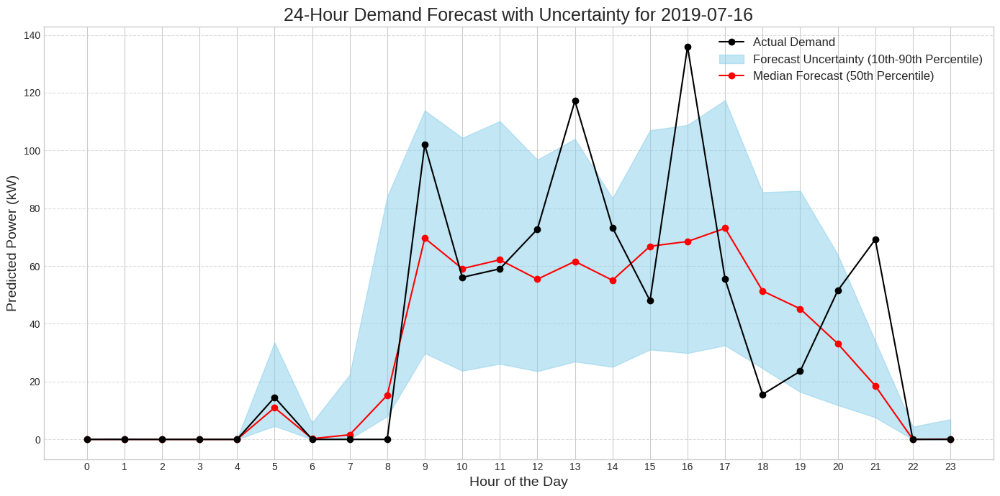

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import xgboost as xgb
import os

# --- Prerequisites ---
# This code assumes the following variables from your notebook are available:
# - best_params: The dictionary of optimal hyperparameters from your Optuna study.
# - X_train, y_train, X_val, y_val, X_test, y_test: The data splits.

# --- 1. Train Quantile Regression Models ---
# To quantify uncertainty, we train models to predict a range (quantiles)
# instead of a single point. We need one model for each quantile.

def train_and_save_quantile_models(params, X_train, y_train, X_val, y_val, quantiles, models_dir='/content/keras_tuner_dir/ev_demand_forecasting'):
    """Trains and saves XGBoost models for specified quantiles."""
    print("--- Training Quantile Regression Models ---")
    # Use the best parameters from the previous optimization, but override the objective
    base_params = params.copy()

    # Create the directory if it doesn't exist
    if not os.path.exists(models_dir):
        os.makedirs(models_dir)

    for q in quantiles:
        print(f"Training model for quantile: {q:.2f}")

        # Set the objective for quantile regression
        base_params['objective'] = 'reg:quantileerror'
        base_params['quantile_alpha'] = q

        model = xgb.XGBRegressor(**base_params)

        # Combine train and validation sets for final model training
        X_train_full = pd.concat([X_train, X_val])
        y_train_full = pd.concat([y_train, y_val])

        model.fit(X_train_full, y_train_full, verbose=False)

        # Save the trained model
        model_path = os.path.join(models_dir, f'ev_demand_xgb_quantile_{int(q*100)}.json')
        model.save_model(model_path)
        print(f"Model for quantile {q:.2f} saved to {model_path}")

# --- 2. Generate Forecast with Uncertainty ---

def generate_quantile_forecasts(models_dir, data_source, target_date_str, quantiles):
    """
    Loads the optimized quantile models and generates a 24-hour forecast
    for a specific target day, including prediction intervals.
    """
    print(f"\n--- Generating quantile forecasts for {target_date_str} ---")

    forecasts = {}

    # Select the data for the target day
    target_date = pd.to_datetime(target_date_str)
    day_mask = (data_source.index.date == target_date.date())

    if not day_mask.any():
        print(f"Error: No data found for {target_date_str} in the data source.")
        return None

    X_day = data_source[day_mask]

    for q in quantiles:
        # Load the corresponding quantile model
        try:
            # CORRECTED: Load from the same 'models_dir' where the model was saved.
            model_path = os.path.join(models_dir, f'ev_demand_xgb_quantile_{int(q*100)}.json')
            model = xgb.XGBRegressor()
            model.load_model(model_path)
        except Exception as e:
            print(f"Error loading model for quantile {q}: {e}")
            return None

        # Generate predictions (the forecast)
        forecasted_demand = model.predict(X_day)
        forecasted_demand[forecasted_demand < 0] = 0
        forecasts[f'q_{q}'] = forecasted_demand

    # Return as a pandas DataFrame for easier handling
    return pd.DataFrame(forecasts, index=X_day.index)

# --- 3. Run the Forecasting Pipeline ---

# Define the quantiles for uncertainty modeling
quantiles_to_train = [0.10, 0.50, 0.90] # Lower bound, median, upper bound

# This assumes 'best_params' is available from your Optuna study
try:
    # Step A: Train and save the quantile models (run this once)
    train_and_save_quantile_models(best_params, X_train, y_train, X_val, y_val, quantiles_to_train)

    # Pick a sample day from the test set to generate a forecast for
    sample_day = '2019-07-16'

    # Step B: Generate the quantile forecasts for the sample day
    demand_forecasts_df = generate_quantile_forecasts(
        models_dir='/content/keras_tuner_dir/ev_demand_forecasting',
        data_source=X_test,
        target_date_str=sample_day,
        quantiles=quantiles_to_train
    )

    if demand_forecasts_df is not None:
        # Step C: Visualize the Forecast with Uncertainty
        print("\n--- Visualizing Forecast Results ---")

        # Get the actual demand for the same day for comparison
        actual_demand_day = y_test.loc[demand_forecasts_df.index]

        plt.style.use('seaborn-v0_8-whitegrid')
        plt.figure(figsize=(14, 7))

        index = np.arange(len(demand_forecasts_df))

        # Plot the actual demand
        plt.plot(index, actual_demand_day.values, 'o-', color='black', label='Actual Demand', zorder=10)

        # Plot the uncertainty interval
        plt.fill_between(
            index,
            demand_forecasts_df['q_0.1'],
            demand_forecasts_df['q_0.9'],
            color='skyblue',
            alpha=0.5,
            label='Forecast Uncertainty (10th-90th Percentile)'
        )

        # Plot the median forecast
        plt.plot(index, demand_forecasts_df['q_0.5'], 'o-', color='red', label='Median Forecast (50th Percentile)')

        plt.title(f'24-Hour Demand Forecast with Uncertainty for {sample_day}', fontsize=18)
        plt.xlabel('Hour of the Day', fontsize=14)
        plt.ylabel('Predicted Power (kW)', fontsize=14)
        plt.xticks(index)
        plt.legend(fontsize=12)
        plt.grid(axis='y', linestyle='--', alpha=0.7)
        plt.tight_layout()
        plt.savefig("XGBoost_Uncertainty_visualisation.png", dpi=1200, bbox_inches='tight')
        plt.show()

except NameError as e:
    print(f"\nExecution failed: {e}")
    print("Please ensure all necessary variables (best_params, X_train, y_test, etc.) are available.")

--- Training Quantile Regression Models ---
Training model for quantile: 0.10
Model for quantile 0.10 saved to /content/keras_tuner_dir/ev_demand_forecasting/ev_demand_xgb_quantile_10.json
Training model for quantile: 0.50
Model for quantile 0.50 saved to /content/keras_tuner_dir/ev_demand_forecasting/ev_demand_xgb_quantile_50.json
Training model for quantile: 0.90
Model for quantile 0.90 saved to /content/keras_tuner_dir/ev_demand_forecasting/ev_demand_xgb_quantile_90.json

🔮 Generating forecasts from 2019-07-16 to 2019-07-16...
--- Visualizing: Forecast vs. Actual for Working Day (2019-07-16) ---
Plot saved as: Forecast_vs._Actual_for_Working_Day_2019-07-16.png


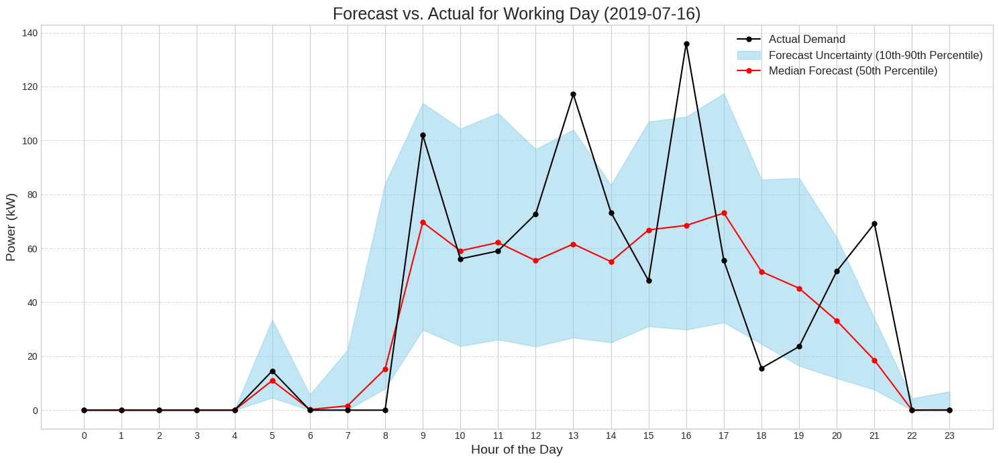


🔮 Generating forecasts from 2019-07-20 to 2019-07-20...
--- Visualizing: Forecast vs. Actual for Weekend Day (2019-07-20) ---
Plot saved as: Forecast_vs._Actual_for_Weekend_Day_2019-07-20.png


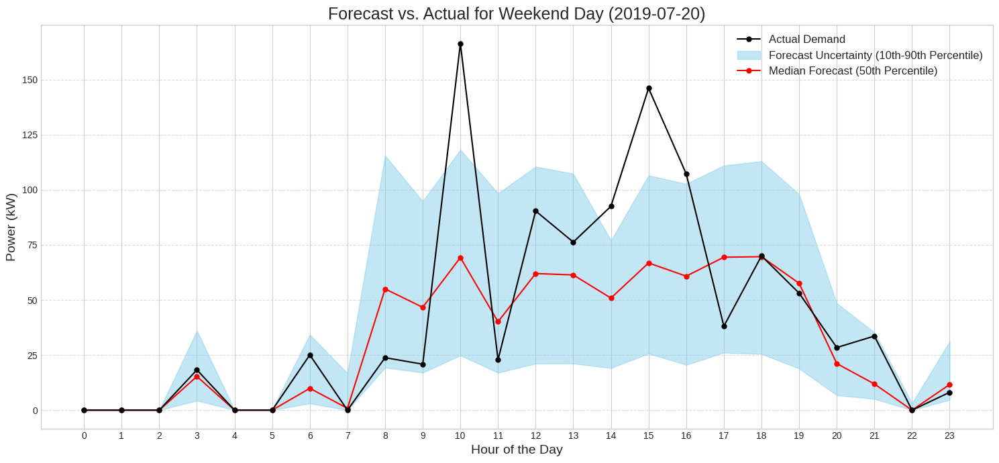


🔮 Generating forecasts from 2019-08-26 to 2019-08-26...
--- Visualizing: Forecast vs. Actual for Bank Holiday (2019-08-26) ---
Plot saved as: Forecast_vs._Actual_for_Bank_Holiday_2019-08-26.png


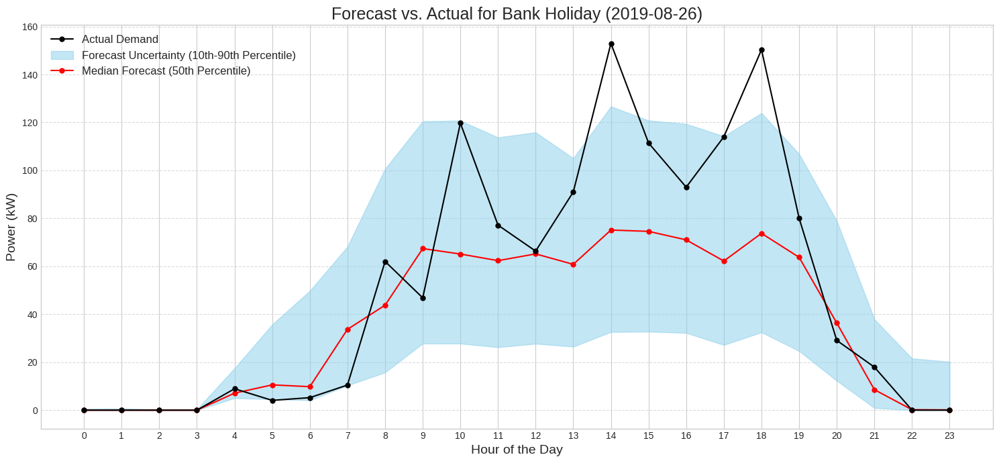


🔮 Generating forecasts from 2019-07-15 to 2019-07-21...
--- Visualizing: Forecast vs. Actual for Week (2019-07-15 to 2019-07-21) ---
Plot saved as: Forecast_vs._Actual_for_Week_2019-07-15_to_2019-07-21.png


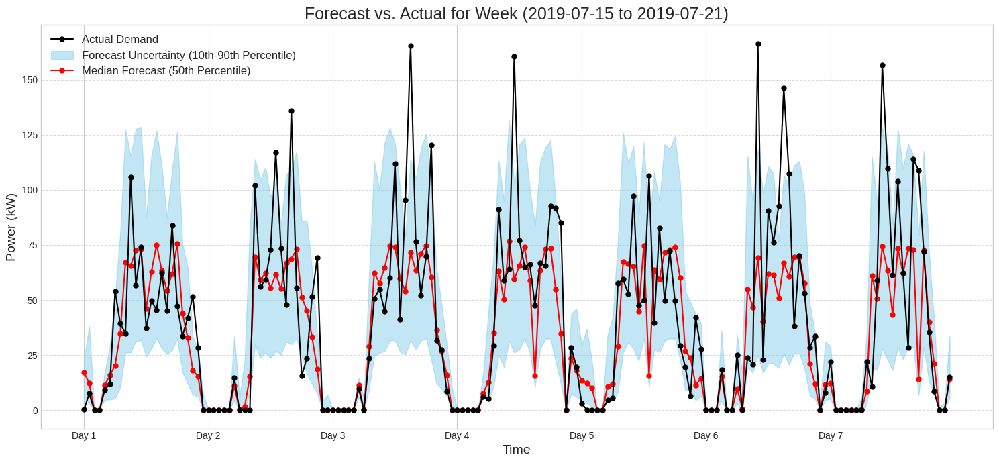

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import xgboost as xgb
import os
from datetime import datetime, timedelta

# =====================
# SCRIPT PARAMETERS
# =====================
# This assumes 'best_params', 'X_train', 'y_train', 'X_val', 'y_val', 'X_test',
# and 'y_test' are already defined in your notebook's memory.
MODELS_DIR = "/content/keras_tuner_dir/ev_demand_forecasting"
QUANTILES_TO_TRAIN = [0.10, 0.50, 0.90] # Lower bound, median, upper bound

# =====================
# 1. MODEL TRAINING
# =====================
def train_and_save_quantile_models(params, X_train, y_train, X_val, y_val, quantiles, models_dir):
    """Trains and saves XGBoost models for specified quantiles."""
    print("--- Training Quantile Regression Models ---")
    base_params = params.copy()

    if not os.path.exists(models_dir):
        os.makedirs(models_dir)

    for q in quantiles:
        print(f"Training model for quantile: {q:.2f}")
        base_params['objective'] = 'reg:quantileerror'
        base_params['quantile_alpha'] = q

        model = xgb.XGBRegressor(**base_params)

        X_train_full = pd.concat([X_train, X_val])
        y_train_full = pd.concat([y_train, y_val])

        model.fit(X_train_full, y_train_full, verbose=False)

        model_path = os.path.join(models_dir, f'ev_demand_xgb_quantile_{int(q*100)}.json')
        model.save_model(model_path)
        print(f"Model for quantile {q:.2f} saved to {model_path}")

# =====================
# 2. FORECAST GENERATION (GENERALIZED)
# =====================
def generate_forecasts(models_dir, data_source, start_date_str, end_date_str, quantiles):
    """
    Loads pre-trained models and generates forecasts for a specified date range.
    """
    print(f"\n🔮 Generating forecasts from {start_date_str} to {end_date_str}...")

    start_date = pd.to_datetime(start_date_str)
    end_date = pd.to_datetime(end_date_str)
    period_mask = (data_source.index.date >= start_date.date()) & (data_source.index.date <= end_date.date())

    if not period_mask.any():
        print(f"Error: No data found for the specified period in the data source.")
        return None

    X_period = data_source[period_mask]

    forecasts = {}
    for q in quantiles:
        try:
            model_path = os.path.join(models_dir, f'ev_demand_xgb_quantile_{int(q*100)}.json')
            model = xgb.XGBRegressor()
            model.load_model(model_path)
        except Exception as e:
            raise FileNotFoundError(f"Error loading model for quantile {q}: {e}")

        forecasted_demand = model.predict(X_period)
        forecasted_demand = np.maximum(forecasted_demand, 0)
        forecasts[f'q_{q}'] = forecasted_demand

    return pd.DataFrame(forecasts, index=X_period.index)

# =====================
# 3. VISUALIZATION (GENERALIZED)
# =====================
def visualize_forecast_vs_actual(forecast_df, actual_series, title):
    """
    Generates a plot comparing the forecast (with uncertainty) against actual demand.
    """
    print(f"--- Visualizing: {title} ---")

    actual_demand = actual_series.loc[forecast_df.index]

    plt.style.use('seaborn-v0_8-whitegrid')
    plt.figure(figsize=(15, 7))

    time_index = np.arange(len(forecast_df))

    # Plot the actual demand
    plt.plot(time_index, actual_demand.values, 'o-', color='black', label='Actual Demand', zorder=10, markersize=5)

    # Plot the uncertainty interval
    plt.fill_between(
        time_index,
        forecast_df['q_0.1'],
        forecast_df['q_0.9'],
        color='skyblue',
        alpha=0.5,
        label='Forecast Uncertainty (10th-90th Percentile)'
    )

    # Plot the median forecast
    plt.plot(time_index, forecast_df['q_0.5'], 'o-', color='red', label='Median Forecast (50th Percentile)', markersize=5)

    plt.title(title, fontsize=18)
    plt.xlabel('Time', fontsize=14)
    plt.ylabel('Power (kW)', fontsize=14)

    # Adjust x-axis ticks based on the period length
    if len(time_index) <= 24: # Daily plot
        plt.xticks(time_index)
        plt.xlabel('Hour of the Day', fontsize=14)
    elif len(time_index) <= 24 * 7: # Weekly plot
        num_days = int(np.ceil(len(time_index)/24))
        plt.xticks(np.arange(0, len(time_index), 24), [f'Day {i+1}' for i in range(num_days)])

    plt.legend(fontsize=12)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    filename = f"{title.replace(' ', '_').replace('(', '').replace(')', '')}.png"
    plt.savefig(filename, dpi=1200, bbox_inches='tight')
    print(f"Plot saved as: {filename}")
    plt.show()

# =====================
# MAIN EXECUTION
# =====================
if __name__ == "__main__":
    try:
        # Step A: Train the quantile models (run this once)
        # Assumes 'best_params' from Optuna study is available
        train_and_save_quantile_models(best_params, X_train, y_train, X_val, y_val, QUANTILES_TO_TRAIN, MODELS_DIR)

        # --- Scenario 1: Typical Working Day ---
        working_day = '2019-07-16'
        forecast_working_day = generate_forecasts(MODELS_DIR, X_test, working_day, working_day, QUANTILES_TO_TRAIN)
        if forecast_working_day is not None:
            visualize_forecast_vs_actual(forecast_working_day, y_test, f"Forecast vs. Actual for Working Day ({working_day})")

        # --- Scenario 2: Typical Weekend Day ---
        weekend_day = '2019-07-20'
        forecast_weekend_day = generate_forecasts(MODELS_DIR, X_test, weekend_day, weekend_day, QUANTILES_TO_TRAIN)
        if forecast_weekend_day is not None:
            visualize_forecast_vs_actual(forecast_weekend_day, y_test, f"Forecast vs. Actual for Weekend Day ({weekend_day})")

        # --- Scenario 3: Bank Holiday ---
        bank_holiday = '2019-08-26' # Summer Bank Holiday
        forecast_bank_holiday = generate_forecasts(MODELS_DIR, X_test, bank_holiday, bank_holiday, QUANTILES_TO_TRAIN)
        if forecast_bank_holiday is not None:
            visualize_forecast_vs_actual(forecast_bank_holiday, y_test, f"Forecast vs. Actual for Bank Holiday ({bank_holiday})")

        # --- Scenario 4: Typical Week ---
        week_start = '2019-07-15'
        week_end = '2019-07-21'
        forecast_week = generate_forecasts(MODELS_DIR, X_test, week_start, week_end, QUANTILES_TO_TRAIN)
        if forecast_week is not None:
            visualize_forecast_vs_actual(forecast_week, y_test, f"Forecast vs. Actual for Week ({week_start} to {week_end})")

    except NameError as e:
        print(f"\n❌ EXECUTION FAILED: A required variable is not defined: {e}")
        print("Please ensure 'best_params', 'X_train', 'y_train', 'X_val', 'y_val', 'X_test', and 'y_test' are all available in your notebook's memory before running.")
    except Exception as e:
        print(f"\n❌ An unexpected error occurred: {e}")


OPTIMISATION

--- Generating quantile forecasts for 2019-07-16 ---

--- Formulating optimization (Ramp Rate <= 10000.0 kW/hr) ---
Optimal solution found!

--- Formulating optimization (Ramp Rate <= 15.0 kW/hr) ---
Optimal solution found!

--- Cost Analysis ---
Naive Total Cost (Median Forecast): £1083.42
Optimized (No Ramp):                £787.34 | Savings: £296.08 (27.3%)
Optimized (With Ramp):              £874.64 | Savings: £208.78 (19.3%)


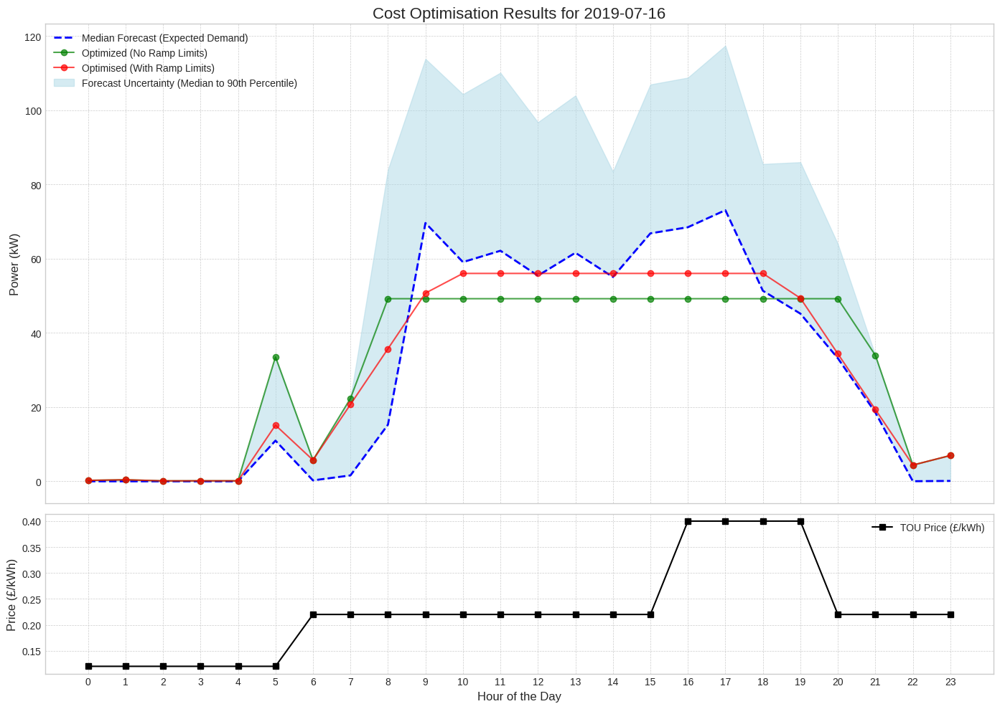

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import xgboost as xgb
import pulp
import os

# --- Prerequisites ---
# This code assumes the following variables from your notebook are available:
# - X_test, y_test: The test data split.
# It also assumes you have saved your quantile regression models.

# --- 1. Generate Forecast with Uncertainty ---
def generate_quantile_forecasts(models_dir, data_source, target_date_str, quantiles):
    """
    Loads the optimized quantile models and generates a 24-hour forecast
    for a specific target day, including prediction intervals.
    """
    print(f"--- Generating quantile forecasts for {target_date_str} ---")
    forecasts = {}
    target_date = pd.to_datetime(target_date_str)
    day_mask = (data_source.index.date == target_date.date())

    if not day_mask.any():
        print(f"Error: No data found for {target_date_str} in the data source.")
        return None

    X_day = data_source[day_mask]

    for q in quantiles:
        try:
            model_path = os.path.join(models_dir, f'ev_demand_xgb_quantile_{int(q*100)}.json')
            model = xgb.XGBRegressor()
            model.load_model(model_path)
        except Exception as e:
            print(f"Error loading model for quantile {q}: {e}")
            return None

        forecasted_demand = model.predict(X_day)
        forecasted_demand[forecasted_demand < 0] = 0
        forecasts[f'q_{q}'] = forecasted_demand

    return pd.DataFrame(forecasts, index=X_day.index)

# --- 2. Corrected Optimization Function with Upper Bounds ---
def solve_cost_optimization(tou_prices, demand_charge_price, max_ramp_rate,
                            total_energy_constraint, num_intervals, upper_bounds=None):
    """
    Formulates and solves the cost optimization problem, now including the
    hourly upper bound constraint for a more realistic scenario.
    """
    print(f"\n--- Formulating optimization (Ramp Rate <= {max_ramp_rate} kW/hr) ---")

    prob = pulp.LpProblem("Cost_Minimization", pulp.LpMinimize)

    # Variables
    scheduled_power = pulp.LpVariable.dicts("ScheduledPower", range(num_intervals), lowBound=0, cat='Continuous')
    peak_power = pulp.LpVariable("PeakPower", lowBound=0, cat='Continuous')

    # Objective
    energy_cost = pulp.lpSum(scheduled_power[i] * tou_prices[i] for i in range(num_intervals))
    demand_charge = peak_power * demand_charge_price
    prob += energy_cost + demand_charge, "Minimize_Total_Cost"

    # Constraints
    prob += pulp.lpSum(scheduled_power[i] for i in range(num_intervals)) >= total_energy_constraint, "Energy_Constraint"

    for i in range(num_intervals):
        prob += peak_power >= scheduled_power[i], f"Peak_Constraint_{i}"

    # Ramp constraints
    for i in range(1, num_intervals):
        prob += scheduled_power[i] - scheduled_power[i-1] <= max_ramp_rate, f"Ramp_Up_{i}"
        prob += scheduled_power[i-1] - scheduled_power[i] <= max_ramp_rate, f"Ramp_Down_{i}"

    # RE-INTRODUCED: Hourly upper bounds from the 90th percentile forecast
    if upper_bounds is not None:
        for i in range(num_intervals):
            prob += scheduled_power[i] <= upper_bounds[i], f"Upper_Limit_{i}"

    prob.solve(pulp.PULP_CBC_CMD(msg=0))

    if pulp.LpStatus[prob.status] == 'Optimal':
        print("Optimal solution found!")
        optimized_schedule = [pulp.value(scheduled_power[i]) for i in range(num_intervals)]
        optimized_peak = pulp.value(peak_power)
        return optimized_schedule, optimized_peak
    else:
        print("Status:", pulp.LpStatus[prob.status])
        return None, None

# --- 3. EVALUATION with Fair Comparison ---
def visualize_and_compare(median_forecast, upper_forecast,
                          optimized_no_ramp,
                          optimized_with_ramp,
                          tou_prices, sample_day):
    """
    Visualize results and calculate cost savings fairly.
    """
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(14, 10), sharex=True, gridspec_kw={'height_ratios': [3, 1]})
    time_index = np.arange(24)

    # Top: Power schedules
    ax1.plot(time_index, median_forecast, 'b--', label='Median Forecast (Expected Demand)', linewidth=2)
    ax1.plot(time_index, optimized_no_ramp, 'g-o', label='Optimized (No Ramp Limits)', alpha=0.7)
    ax1.plot(time_index, optimized_with_ramp, 'r-o', label='Optimised (With Ramp Limits)', alpha=0.7)
    ax1.fill_between(time_index, median_forecast, upper_forecast,
                     color='lightblue', alpha=0.5, label='Forecast Uncertainty (Median to 90th Percentile)')
    ax1.set_ylabel('Power (kW)', fontsize=12)
    ax1.set_title(f"Cost Optimisation Results for {sample_day}", fontsize=16)
    ax1.legend()
    ax1.grid(True, which='both', linestyle='--', linewidth=0.5)

    # Bottom: TOU Prices
    ax2.plot(time_index, tou_prices, 'k-s', label='TOU Price (£/kWh)')
    ax2.set_ylabel('Price (£/kWh)', fontsize=12)
    ax2.set_xlabel('Hour of the Day', fontsize=12)
    ax2.legend()
    ax2.grid(True, which='both', linestyle='--', linewidth=0.5)
    ax2.set_xticks(time_index)
    plt.savefig("Cost-Optimisation Result for {sample_day}.png", dpi=1200, bbox_inches='tight')
    plt.tight_layout()
    plt.show()

# --- RUN CORRECTED PIPELINE ---

# Use the correct path for your saved models
MODELS_DIR_ABSOLUTE = '/content/keras_tuner_dir/ev_demand_forecasting'

# Define Economic and Physical Parameters
tou_prices_pence = {
    0: 12, 1: 12, 2: 12, 3: 12, 4: 12, 5: 12,
    6: 22, 7: 22, 8: 22, 9: 22, 10: 22, 11: 22, 12: 22, 13: 22, 14: 22, 15: 22,
    16: 40, 17: 40, 18: 40, 19: 40,
    20: 22, 21: 22, 22: 22, 23: 22
}
tou_prices_pounds = [p / 100 for p in tou_prices_pence.values()]
demand_charge_pounds_per_kw = 12.00
# --- CORRECTED: Relaxing the ramp rate to restore feasibility ---
MAX_RAMP_RATE_KW = 15.0
quantiles_to_use = [0.10, 0.50, 0.90]

sample_day = '2019-07-16'

demand_forecasts_df = generate_quantile_forecasts(
    models_dir=MODELS_DIR_ABSOLUTE,
    data_source=X_test,
    target_date_str=sample_day,
    quantiles=quantiles_to_use
)

if demand_forecasts_df is not None:
    median_forecast = demand_forecasts_df['q_0.5']
    upper_forecast = demand_forecasts_df['q_0.9']

    total_energy = median_forecast.sum()
    num_intervals = len(median_forecast)
    upper_bounds = upper_forecast.values

    # Baseline: No optimization (naive median schedule)
    naive_energy_cost = np.sum(median_forecast.values * np.array(tou_prices_pounds))
    naive_peak_charge = median_forecast.max() * demand_charge_pounds_per_kw
    naive_total_cost = naive_energy_cost + naive_peak_charge

    # Optimization without ramp constraints (but with hourly upper bounds)
    optimized_no_ramp, new_peak_no_ramp = solve_cost_optimization(
        tou_prices=tou_prices_pounds,
        demand_charge_price=demand_charge_pounds_per_kw,
        max_ramp_rate=10000.0,  # No effective ramp constraint (large value)
        total_energy_constraint=total_energy,
        num_intervals=num_intervals,
        upper_bounds=upper_bounds
    )

    # Optimization with ramp constraints
    optimized_with_ramp, new_peak_with_ramp = solve_cost_optimization(
        tou_prices=tou_prices_pounds,
        demand_charge_price=demand_charge_pounds_per_kw,
        max_ramp_rate=MAX_RAMP_RATE_KW,
        total_energy_constraint=total_energy,
        num_intervals=num_intervals,
        upper_bounds=upper_bounds
    )

    if optimized_no_ramp is not None and optimized_with_ramp is not None:
        # Calculate costs
        opt_no_ramp_energy = np.sum(np.array(optimized_no_ramp) * np.array(tou_prices_pounds))
        opt_no_ramp_demand = new_peak_no_ramp * demand_charge_pounds_per_kw
        opt_no_ramp_total = opt_no_ramp_energy + opt_no_ramp_demand

        opt_with_ramp_energy = np.sum(np.array(optimized_with_ramp) * np.array(tou_prices_pounds))
        opt_with_ramp_demand = new_peak_with_ramp * demand_charge_pounds_per_kw
        opt_with_ramp_total = opt_with_ramp_energy + opt_with_ramp_demand

        # Savings calculations
        savings_no_ramp = naive_total_cost - opt_no_ramp_total
        savings_with_ramp = naive_total_cost - opt_with_ramp_total

        # Print results
        print("\n--- Cost Analysis ---")
        print(f"Naive Total Cost (Median Forecast): £{naive_total_cost:.2f}")
        print(f"Optimized (No Ramp):                £{opt_no_ramp_total:.2f} | Savings: £{savings_no_ramp:.2f} ({savings_no_ramp/naive_total_cost*100:.1f}%)")
        print(f"Optimized (With Ramp):              £{opt_with_ramp_total:.2f} | Savings: £{savings_with_ramp:.2f} ({savings_with_ramp/naive_total_cost*100:.1f}%)")

        # Visualize
        visualize_and_compare(median_forecast=median_forecast.values,
                              upper_forecast=upper_forecast.values,
                              optimized_no_ramp=optimized_no_ramp,
                              optimized_with_ramp=optimized_with_ramp,
                              tou_prices=tou_prices_pounds,
                              sample_day=sample_day)



--- Generating forecasts from 2019-07-15 to 2019-07-21 ---

--- Formulating optimization for 168 hours (7.0 days) ---
Optimal solution found!

--- Cost Analysis ---
Naive Total Cost (Median Forecast): £2515.07
Optimized Total Cost:               £2238.17
Total Savings:                      £276.90 (11.01%)
Plot saved as: Weekly_Cost_Optimization_2019-07-15_to_2019-07-21.png


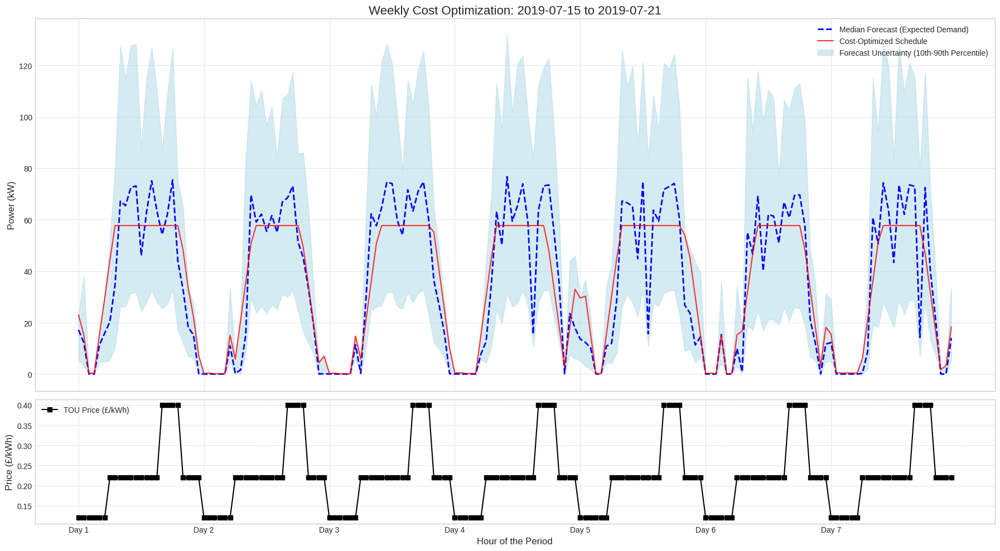


--- Generating forecasts from 2019-07-01 to 2019-07-31 ---

--- Formulating optimization for 744 hours (31.0 days) ---
Optimal solution found!

--- Cost Analysis ---
Naive Total Cost (Median Forecast): £7155.53
Optimized Total Cost:               £6458.99
Total Savings:                      £696.54 (9.73%)
Plot saved as: Monthly_Cost_Optimization_2019-07-01_to_2019-07-31.png


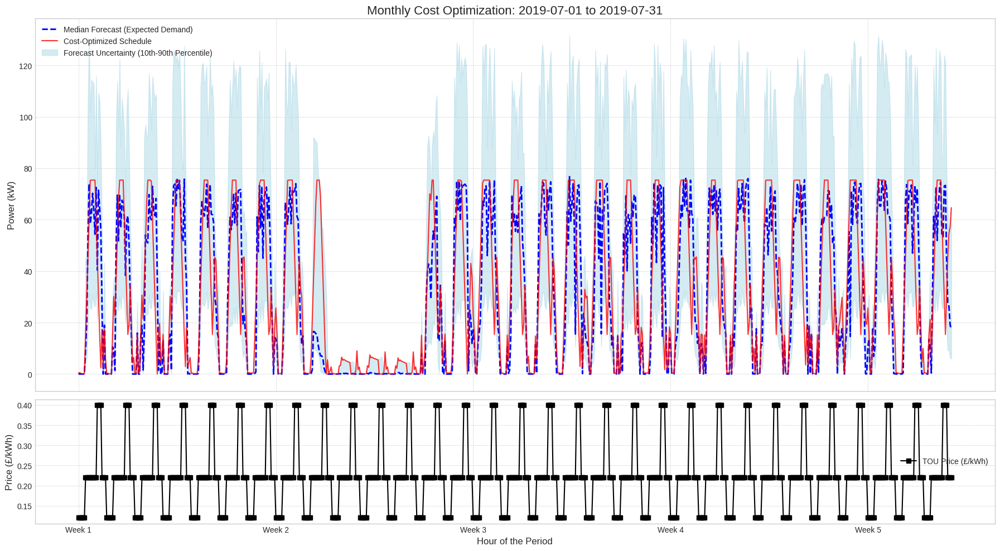

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import xgboost as xgb
import pulp
import os

# --- Prerequisites ---
# This code assumes the following variables from your notebook are available:
# - X_test, y_test: The test data split.
# It also assumes you have saved your quantile regression models.

# --- 1. Generalized Forecasting Function ---
def generate_period_forecasts(models_dir, data_source, start_date_str, end_date_str, quantiles):
    """
    Loads quantile models and generates a forecast for a specified date range.
    """
    print(f"\n--- Generating forecasts from {start_date_str} to {end_date_str} ---")

    start_date = pd.to_datetime(start_date_str)
    end_date = pd.to_datetime(end_date_str)
    period_mask = (data_source.index.date >= start_date.date()) & (data_source.index.date <= end_date.date())

    if not period_mask.any():
        print(f"Error: No data found for the specified period in the data source.")
        return None

    X_period = data_source[period_mask]

    forecasts = {}
    for q in quantiles:
        try:
            model_path = os.path.join(models_dir, f'ev_demand_xgb_quantile_{int(q*100)}.json')
            model = xgb.XGBRegressor()
            model.load_model(model_path)
        except Exception as e:
            print(f"Error loading model for quantile {q}: {e}")
            return None

        forecasted_demand = model.predict(X_period)
        forecasted_demand[forecasted_demand < 0] = 0
        forecasts[f'q_{q}'] = forecasted_demand

    return pd.DataFrame(forecasts, index=X_period.index)

# --- 2. Corrected Generalized Optimization Function ---
def solve_long_term_optimization(total_energy_constraint, upper_bounds, tou_prices_daily, demand_charge_price, max_ramp_rate):
    """
    Formulates and solves the cost optimization problem for a multi-day period,
    using the median forecast for the energy target and the upper forecast for hourly limits.
    """
    num_intervals = len(total_energy_constraint)
    print(f"\n--- Formulating optimization for {num_intervals} hours ({num_intervals/24:.1f} days) ---")

    # Tile the daily TOU prices to match the forecast length
    num_days = int(np.ceil(num_intervals / 24))
    tou_prices_period = tou_prices_daily * num_days
    tou_prices_period = tou_prices_period[:num_intervals]

    prob = pulp.LpProblem("Long_Term_Cost_Minimization", pulp.LpMinimize)

    # Variables
    scheduled_power = pulp.LpVariable.dicts("ScheduledPower", range(num_intervals), lowBound=0, cat='Continuous')
    peak_power = pulp.LpVariable("PeakPower", lowBound=0, cat='Continuous')

    # Objective
    energy_cost = pulp.lpSum([scheduled_power[i] * tou_prices_period[i] for i in range(num_intervals)])
    demand_charge = peak_power * demand_charge_price
    prob += energy_cost + demand_charge, "Minimize_Total_Cost"

    # Constraints
    prob += pulp.lpSum(scheduled_power[i] for i in range(num_intervals)) >= total_energy_constraint.sum(), "Total_Energy_Constraint"
    for i in range(num_intervals):
        prob += peak_power >= scheduled_power[i], f"Peak_Constraint_{i}"
        # Add the hourly upper bound constraint
        prob += scheduled_power[i] <= upper_bounds[i], f"Upper_Limit_Constraint_{i}"
    for i in range(1, num_intervals):
        prob += scheduled_power[i] - scheduled_power[i-1] <= max_ramp_rate, f"Ramp_Up_{i}"
        prob += scheduled_power[i-1] - scheduled_power[i] <= max_ramp_rate, f"Ramp_Down_{i}"

    prob.solve(pulp.PULP_CBC_CMD(msg=0))

    if pulp.LpStatus[prob.status] == 'Optimal':
        print("Optimal solution found!")
        optimized_schedule = [pulp.value(scheduled_power[i]) for i in range(num_intervals)]
        optimized_peak = pulp.value(peak_power)
        return optimized_schedule, optimized_peak
    else:
        print("Status:", pulp.LpStatus[prob.status])
        return None, None

# --- 3. Generalized Visualization and Cost Analysis Function ---
def analyze_and_visualize_results(forecast_df, optimized_schedule, optimized_peak, tou_prices_daily, demand_charge_price, title):
    """Calculates costs and visualizes the results of a long-term optimization."""

    median_forecast = forecast_df['q_0.5'].values
    tou_prices_period = (tou_prices_daily * int(np.ceil(len(median_forecast) / 24)))[:len(median_forecast)]

    # --- Cost Calculation ---
    # Naive cost (following the median forecast)
    naive_energy_cost = np.sum(median_forecast * tou_prices_period)
    naive_peak_charge = median_forecast.max() * demand_charge_price
    naive_total_cost = naive_energy_cost + naive_peak_charge

    # Optimized cost
    optimized_energy_cost = np.sum(np.array(optimized_schedule) * tou_prices_period)
    optimized_demand_charge = optimized_peak * demand_charge_price
    optimized_total_cost = optimized_energy_cost + optimized_demand_charge

    # Savings
    cost_saving = naive_total_cost - optimized_total_cost
    cost_saving_percent = (cost_saving / naive_total_cost) * 100 if naive_total_cost > 0 else 0

    print("\n--- Cost Analysis ---")
    print(f"Naive Total Cost (Median Forecast): £{naive_total_cost:.2f}")
    print(f"Optimized Total Cost:               £{optimized_total_cost:.2f}")
    print(f"Total Savings:                      £{cost_saving:.2f} ({cost_saving_percent:.2f}%)")

    # --- Visualization ---
    time_index = np.arange(len(median_forecast))
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(18, 10), sharex=True, gridspec_kw={'height_ratios': [3, 1]})

    # Top plot: Power schedules
    ax1.plot(time_index, median_forecast, 'b--', label='Median Forecast (Expected Demand)', linewidth=2)
    ax1.plot(time_index, optimized_schedule, 'r-', label='Cost-Optimized Schedule', alpha=0.8)
    ax1.fill_between(time_index, forecast_df['q_0.1'], forecast_df['q_0.9'],
                     color='lightblue', alpha=0.5, label='Forecast Uncertainty (10th-90th Percentile)')
    ax1.set_ylabel('Power (kW)', fontsize=12)
    ax1.set_title(title, fontsize=16)
    ax1.legend()
    ax1.grid(True, which='both', linestyle='--', linewidth=0.5)

    # Bottom plot: TOU Prices
    ax2.plot(time_index, tou_prices_period, 'k-s', label='TOU Price (£/kWh)')
    ax2.set_ylabel('Price (£/kWh)', fontsize=12)
    ax2.set_xlabel('Hour of the Period', fontsize=12)
    ax2.legend()
    ax2.grid(True, which='both', linestyle='--', linewidth=0.5)

    # Set appropriate x-axis ticks based on period length
    if len(time_index) <= 24 * 7: # Weekly
        ax2.set_xticks(np.arange(0, len(time_index), 24))
        ax2.set_xticklabels([f'Day {i+1}' for i in range(int(np.ceil(len(time_index)/24)))])
    else: # Monthly
        num_weeks = int(np.ceil(len(time_index) / (24 * 7)))
        ax2.set_xticks(np.arange(0, len(time_index), 24 * 7))
        ax2.set_xticklabels([f'Week {i+1}' for i in range(num_weeks)])

    plt.tight_layout()
    # Save the plot
    filename = f"{title.replace(' ', '_').replace(':', '').replace('(', '').replace(')', '')}.png"
    plt.savefig(filename, dpi=1200, bbox_inches='tight')
    print(f"Plot saved as: {filename}")
    plt.show()

# --- RUN THE PIPELINES ---

# Define Paths and Parameters
MODELS_DIR_ABSOLUTE = '/content/keras_tuner_dir/ev_demand_forecasting'
tou_prices_pence = {
    0: 12, 1: 12, 2: 12, 3: 12, 4: 12, 5: 12,
    6: 22, 7: 22, 8: 22, 9: 22, 10: 22, 11: 22, 12: 22, 13: 22, 14: 22, 15: 22,
    16: 40, 17: 40, 18: 40, 19: 40,
    20: 22, 21: 22, 22: 22, 23: 22
}
tou_prices_pounds_daily = [p / 100 for p in tou_prices_pence.values()]
demand_charge_pounds_per_kw = 12.00
MAX_RAMP_RATE_KW = 15.0
quantiles_to_use = [0.10, 0.50, 0.90]

# --- A. Weekly Optimization ---
week_start = '2019-07-15'
week_end = '2019-07-21'

weekly_forecasts_df = generate_period_forecasts(
    models_dir=MODELS_DIR_ABSOLUTE,
    data_source=X_test,
    start_date_str=week_start,
    end_date_str=week_end,
    quantiles=quantiles_to_use
)

if weekly_forecasts_df is not None:
    weekly_optimized_schedule, weekly_optimized_peak = solve_long_term_optimization(
        total_energy_constraint=weekly_forecasts_df['q_0.5'], # Use median for energy target
        upper_bounds=weekly_forecasts_df['q_0.9'].values, # Use 90th percentile for hourly limits
        tou_prices_daily=tou_prices_pounds_daily,
        demand_charge_price=demand_charge_pounds_per_kw,
        max_ramp_rate=MAX_RAMP_RATE_KW
    )
    if weekly_optimized_schedule is not None:
        analyze_and_visualize_results(
            weekly_forecasts_df,
            weekly_optimized_schedule,
            weekly_optimized_peak,
            tou_prices_pounds_daily,
            demand_charge_pounds_per_kw,
            f"Weekly Cost Optimization: {week_start} to {week_end}"
        )

# --- B. Monthly Optimization ---
month_start = '2019-07-01'
month_end = '2019-07-31'

monthly_forecasts_df = generate_period_forecasts(
    models_dir=MODELS_DIR_ABSOLUTE,
    data_source=X_test,
    start_date_str=month_start,
    end_date_str=month_end,
    quantiles=quantiles_to_use
)

if monthly_forecasts_df is not None:
    monthly_optimized_schedule, monthly_optimized_peak = solve_long_term_optimization(
        total_energy_constraint=monthly_forecasts_df['q_0.5'], # Use median for energy target
        upper_bounds=monthly_forecasts_df['q_0.9'].values, # Use 90th percentile for hourly limits
        tou_prices_daily=tou_prices_pounds_daily,
        demand_charge_price=demand_charge_pounds_per_kw,
        max_ramp_rate=MAX_RAMP_RATE_KW
    )
    if monthly_optimized_schedule is not None:
        analyze_and_visualize_results(
            monthly_forecasts_df,
            monthly_optimized_schedule,
            monthly_optimized_peak,
            tou_prices_pounds_daily,
            demand_charge_pounds_per_kw,
            f"Monthly Cost Optimization: {month_start} to {month_end}"
        )

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import xgboost as xgb
import pulp
import os

# =====================
# 1. SETUP & PARAMETERS
# =====================

TOU_PRICES_POUNDS_DICT = {
    0: 0.12, 1: 0.12, 2: 0.12, 3: 0.12, 4: 0.12, 5: 0.12,
    6: 0.22, 7: 0.22, 8: 0.22, 9: 0.22, 10: 0.22, 11: 0.22,
    12: 0.22, 13: 0.22, 14: 0.22, 15: 0.22, 16: 0.40, 17: 0.40,
    18: 0.40, 19: 0.40, 20: 0.22, 21: 0.22, 22: 0.22, 23: 0.22
}
MAX_RAMP_RATE_KW = 15.0
QUANTILES = [0.10, 0.50, 0.90]
SAMPLE_DAY = '2019-07-16'
MODELS_DIR = "/content/keras_tuner_dir/ev_demand_forecasting"

# =====================
# 2. OPTIMIZATION & HELPER FUNCTIONS (FROM YOUR SCRIPT)
# =====================

# --- NEW: A dedicated optimization function that takes demand_charge_price as an argument ---
def run_optimization(forecast_df, demand_charge_price):
    """Runs the forecast-informed optimization for a given demand charge price."""
    median = forecast_df['q_0.5'].values
    upper_bounds = forecast_df['q_0.9'].values
    total_energy = median.sum()
    num_intervals = len(median)

    prob = pulp.LpProblem("Forecast_Informed_Optimization", pulp.LpMinimize)
    power = pulp.LpVariable.dicts("P", range(num_intervals), lowBound=0)
    peak = pulp.LpVariable("Peak", lowBound=0)

    tou_prices_list = [TOU_PRICES_POUNDS_DICT[i] for i in range(num_intervals)]
    energy_cost = pulp.lpSum(power[i] * tou_prices_list[i] for i in range(num_intervals))

    # Use the passed demand_charge_price parameter here
    demand_cost = peak * demand_charge_price
    prob += energy_cost + demand_cost

    # Constraints
    prob += pulp.lpSum(power) >= total_energy
    for i in range(num_intervals):
        prob += power[i] <= upper_bounds[i]
        prob += peak >= power[i]
    for i in range(1, num_intervals):
        prob += power[i] - power[i-1] <= MAX_RAMP_RATE_KW
        prob += power[i-1] - power[i] <= MAX_RAMP_RATE_KW

    prob.solve(pulp.PULP_CBC_CMD(msg=False))

    if pulp.LpStatus[prob.status] == 'Optimal':
        # Return the total cost directly from the solved problem
        return pulp.value(prob.objective)
    else:
        raise RuntimeError("Optimization failed!")

def generate_forecasts(data_source, target_date_str):
    """Loads pre-trained models to generate a forecast for a target day."""
    forecasts = {}
    target_date = pd.to_datetime(target_date_str)
    day_mask = (data_source.index.date == target_date.date())
    X_day = data_source[day_mask]

    for q in QUANTILES:
        try:
            model_path = os.path.join(MODELS_DIR, f'ev_demand_xgb_quantile_{int(q*100)}.json')
            model = xgb.XGBRegressor()
            model.load_model(model_path)
            forecasted_demand = model.predict(X_day)
            forecasts[f'q_{q}'] = np.maximum(forecasted_demand, 0)
        except Exception as e:
            raise FileNotFoundError(f"Error loading model for quantile {q}: {e}")
    return pd.DataFrame(forecasts, index=X_day.index)

def calculate_costs(schedule, tou_prices, demand_charge):
    """Calculates the total daily cost of a given 24-hour schedule."""
    schedule_np = np.array(schedule)
    energy_cost = sum(p * tou_prices[h] for h, p in enumerate(schedule_np))
    peak_demand = np.max(schedule_np) if schedule_np.size > 0 else 0
    demand_cost = peak_demand * demand_charge
    total_cost = energy_cost + demand_cost
    return {'Energy Cost': energy_cost, 'Demand Charge': demand_cost, 'Total Cost': total_cost}

# =====================
# 3. NEW: MAIN SENSITIVITY ANALYSIS LOOP
# =====================
if __name__ == "__main__":
    try:
        # --- Parameters to test ---
        demand_charges_to_test = [10.00, 12.00, 15.00]
        results_list = []

        # --- Prepare data ONCE before the loop ---
        print("--- Preparing Data for Analysis ---")
        actual_demand_day = y_test[y_test.index.date == pd.to_datetime(SAMPLE_DAY).date()]
        if actual_demand_day.empty:
            raise ValueError(f"No actual demand data found for {SAMPLE_DAY} in y_test.")

        # Calculate the baseline uncontrolled cost
        uncontrolled_costs = calculate_costs(actual_demand_day.values, TOU_PRICES_POUNDS_DICT, 12.00) # Using 12 as the reference
        uncontrolled_total_cost = uncontrolled_costs['Total Cost']

        # Generate the forecast ONCE before the loop
        forecast_df = generate_forecasts(X_test, SAMPLE_DAY)
        print("\n--- Running Sensitivity Analysis for Demand Charge ---")

        # --- Loop through each parameter value ---
        for charge in demand_charges_to_test:
            print(f"Testing demand charge: £{charge:.2f}/kW...")

            # Run the optimization with the current demand charge value
            optimised_cost = run_optimization(forecast_df, demand_charge_price=charge)

            # Calculate savings against the consistent baseline
            cost_savings_abs = uncontrolled_total_cost - optimised_cost
            cost_savings_pct = (cost_savings_abs / uncontrolled_total_cost) * 100

            results_list.append({
                'Demand Charge (£/kW)': f"£{charge:.2f}",
                'Total Optimised Cost (£)': f"£{optimised_cost:,.2f}",
                'Total Savings (%)': f"{cost_savings_pct:.1f}%"
            })

        # --- Display the final results table ---
        sensitivity_df = pd.DataFrame(results_list)
        print("\n" + "="*50)
        print("📊 SENSITIVITY ANALYSIS RESULTS")
        print("="*50)
        print(sensitivity_df.to_string(index=False))
        print("="*50)

    except Exception as e:
        print(f"\n❌ SCRIPT FAILED: {e}")

--- Preparing Data for Analysis ---

--- Running Sensitivity Analysis for Demand Charge ---
Testing demand charge: £10.00/kW...
Testing demand charge: £12.00/kW...
Testing demand charge: £15.00/kW...

📊 SENSITIVITY ANALYSIS RESULTS
Demand Charge (£/kW) Total Optimised Cost (£) Total Savings (%)
              £10.00                  £762.55             59.2%
              £12.00                  £874.64             53.2%
              £15.00                £1,042.77             44.2%


Simulating: 1. Uncontrolled Charging
Simulating: 2. Rule-Based Charging (Solar Hours)

🔮 Generating REAL forecasts for 2019-07-16...
Simulating: 3. Forecast-Informed Optimization

📊 COST & SAVINGS COMPARISON FOR 2019-07-16
                  Energy Cost Demand Charge Total Cost Savings (£) Savings (%)
Uncontrolled          £236.78      £1631.98   £1868.75       £0.00        0.0%
Rule-Based            £196.72      £2146.06   £2342.79    £-474.03      -25.4%
Forecast-Informed     £202.10       £672.54    £874.64     £994.12       53.2%


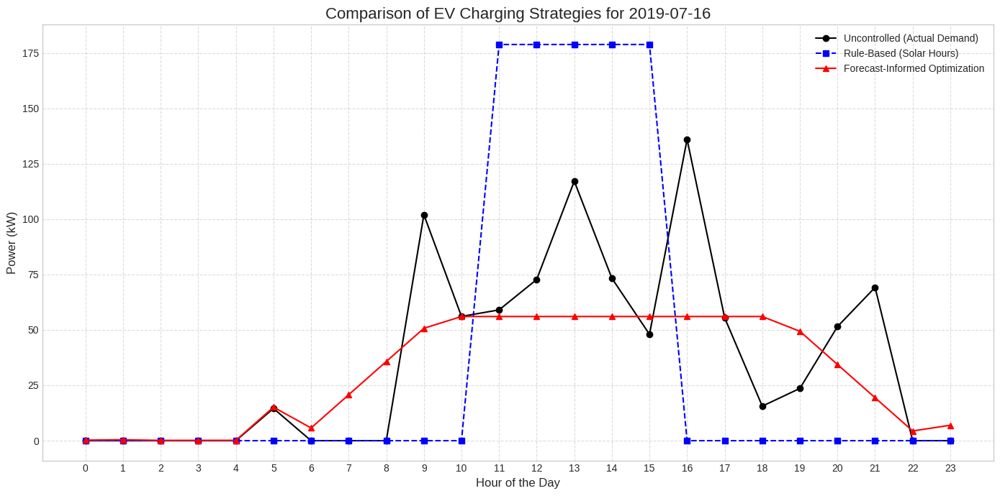

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import xgboost as xgb
import pulp
import os

# =====================
# 1. SETUP & PARAMETERS
# =====================
# This code assumes 'X_test' and 'y_test' DataFrames are available in memory.

# --- Economic Parameters ---
TOU_PRICES_POUNDS_DICT = {
    0: 0.12, 1: 0.12, 2: 0.12, 3: 0.12, 4: 0.12, 5: 0.12,
    6: 0.22, 7: 0.22, 8: 0.22, 9: 0.22, 10: 0.22, 11: 0.22,
    12: 0.22, 13: 0.22, 14: 0.22, 15: 0.22, 16: 0.40, 17: 0.40,
    18: 0.40, 19: 0.40, 20: 0.22, 21: 0.22, 22: 0.22, 23: 0.22
}
DEMAND_CHARGE_POUNDS_PER_KW = 12.00
MAX_RAMP_RATE_KW = 15.0
QUANTILES = [0.10, 0.50, 0.90]
SAMPLE_DAY = '2019-07-16'
MODELS_DIR = "/content/keras_tuner_dir/ev_demand_forecasting"


# =====================
# 2. STRATEGY SIMULATION FUNCTIONS
# =====================

def simulate_uncontrolled_charging(actual_demand_series):
    """Represents the baseline scenario where charging follows actual demand."""
    print("Simulating: 1. Uncontrolled Charging")
    return actual_demand_series.values

def simulate_rule_based_charging(total_energy_needed, solar_hours=[11, 12, 13, 14, 15]):
    """Simulates charging only during specified 'solar-rich' hours."""
    print("Simulating: 2. Rule-Based Charging (Solar Hours)")
    num_intervals = 24

    # Simple optimization to spread the load flatly across solar hours
    prob = pulp.LpProblem("Rule_Based_Charging", pulp.LpMinimize)
    power = pulp.LpVariable.dicts("P", range(num_intervals), lowBound=0)
    peak = pulp.LpVariable("Peak", lowBound=0)

    prob += peak # Objective is just to find the flattest profile

    # Energy constraint
    prob += pulp.lpSum(power) >= total_energy_needed

    # Constraints
    for i in range(num_intervals):
        prob += peak >= power[i]
        if i not in solar_hours:
            prob += power[i] == 0 # Force power to be zero outside solar hours

    prob.solve(pulp.PULP_CBC_CMD(msg=False))

    if pulp.LpStatus[prob.status] == 'Optimal':
        return [power[i].value() for i in range(num_intervals)]
    else:
        return [0] * num_intervals # Return zero if no solution

def simulate_forecast_informed_charging(forecast_df):
    """Runs the full forecast-informed optimization pipeline."""
    print("Simulating: 3. Forecast-Informed Optimization")
    median = forecast_df['q_0.5'].values
    upper_bounds = forecast_df['q_0.9'].values
    total_energy = median.sum()
    num_intervals = len(median)

    prob = pulp.LpProblem("Forecast_Informed_Optimization", pulp.LpMinimize)

    power = pulp.LpVariable.dicts("P", range(num_intervals), lowBound=0)
    peak = pulp.LpVariable("Peak", lowBound=0)

    tou_prices_list = [TOU_PRICES_POUNDS_DICT[i] for i in range(num_intervals)]
    energy_cost = pulp.lpSum(power[i] * tou_prices_list[i] for i in range(num_intervals))
    demand_cost = peak * DEMAND_CHARGE_POUNDS_PER_KW
    prob += energy_cost + demand_cost

    prob += pulp.lpSum(power) >= total_energy
    for i in range(num_intervals):
        prob += power[i] <= upper_bounds[i]
        prob += peak >= power[i]
    for i in range(1, num_intervals):
        prob += power[i] - power[i-1] <= MAX_RAMP_RATE_KW
        prob += power[i-1] - power[i] <= MAX_RAMP_RATE_KW

    prob.solve(pulp.PULP_CBC_CMD(msg=False))

    if pulp.LpStatus[prob.status] == 'Optimal':
        return [power[i].value() for i in range(num_intervals)]
    else:
        raise RuntimeError("Forecast-Informed Optimization failed!")

# =====================
# 3. HELPER FUNCTIONS
# =====================

def generate_forecasts(data_source, target_date_str):
    """Loads pre-trained models to generate a forecast for a target day."""
    print(f"\n🔮 Generating REAL forecasts for {target_date_str}...")
    forecasts = {}
    target_date = pd.to_datetime(target_date_str)
    day_mask = (data_source.index.date == target_date.date())
    X_day = data_source[day_mask]

    for q in QUANTILES:
        try:
            model_path = os.path.join(MODELS_DIR, f'ev_demand_xgb_quantile_{int(q*100)}.json')
            model = xgb.XGBRegressor()
            model.load_model(model_path)
            forecasted_demand = model.predict(X_day)
            forecasts[f'q_{q}'] = np.maximum(forecasted_demand, 0)
        except Exception as e:
            raise FileNotFoundError(f"Error loading model for quantile {q}: {e}")

    return pd.DataFrame(forecasts, index=X_day.index)

def calculate_costs(schedule, tou_prices, demand_charge):
    """Calculates the total daily cost of a given 24-hour schedule."""
    # Convert schedule to a NumPy array to handle both lists and arrays robustly
    schedule_np = np.array(schedule)

    energy_cost = sum(p * tou_prices[h] for h, p in enumerate(schedule_np))

    # CORRECTED: The 'if schedule' check is ambiguous for a NumPy array.
    # Check the size of the array instead.
    peak_demand = np.max(schedule_np) if schedule_np.size > 0 else 0

    demand_cost = peak_demand * demand_charge
    total_cost = energy_cost + demand_cost
    return {'Energy Cost': energy_cost, 'Demand Charge': demand_cost, 'Total Cost': total_cost}

# =====================
# 4. MAIN EXECUTION & VISUALIZATION
# =====================
if __name__ == "__main__":
    try:
        # --- Data Preparation ---
        actual_demand_day = y_test[y_test.index.date == pd.to_datetime(SAMPLE_DAY).date()]
        if actual_demand_day.empty:
            raise ValueError(f"No actual demand data found for {SAMPLE_DAY} in y_test.")
        total_energy_actual = actual_demand_day.sum()

        # --- Run Simulations ---
        uncontrolled_schedule = simulate_uncontrolled_charging(actual_demand_day)
        rule_based_schedule = simulate_rule_based_charging(total_energy_actual)
        forecast_df = generate_forecasts(X_test, SAMPLE_DAY)
        forecast_informed_schedule = simulate_forecast_informed_charging(forecast_df)

        # --- Cost Calculation ---
        costs = {
            "Uncontrolled": calculate_costs(uncontrolled_schedule, TOU_PRICES_POUNDS_DICT, DEMAND_CHARGE_POUNDS_PER_KW),
            "Rule-Based": calculate_costs(rule_based_schedule, TOU_PRICES_POUNDS_DICT, DEMAND_CHARGE_POUNDS_PER_KW),
            "Forecast-Informed": calculate_costs(forecast_informed_schedule, TOU_PRICES_POUNDS_DICT, DEMAND_CHARGE_POUNDS_PER_KW),
        }

        # --- Display Results Table ---
        results_df = pd.DataFrame(costs).T
        baseline_cost = results_df.loc['Uncontrolled', 'Total Cost']
        results_df['Savings (£)'] = baseline_cost - results_df['Total Cost']
        results_df['Savings (%)'] = (results_df['Savings (£)'] / baseline_cost) * 100

        print("\n" + "="*60)
        print(f"📊 COST & SAVINGS COMPARISON FOR {SAMPLE_DAY}")
        print("="*60)
        print(results_df.to_string(formatters={'Total Cost':'£{:.2f}'.format, 'Energy Cost':'£{:.2f}'.format, 'Demand Charge':'£{:.2f}'.format, 'Savings (£)':'£{:.2f}'.format, 'Savings (%)':'{:.1f}%'.format}))
        print("="*60)

        # --- Visualization ---
        plt.style.use('seaborn-v0_8-whitegrid')
        plt.figure(figsize=(14, 7))
        hours = np.arange(24)

        plt.plot(hours, uncontrolled_schedule, 'o-', color='black', label='Uncontrolled (Actual Demand)')
        plt.plot(hours, rule_based_schedule, 's--', color='blue', label='Rule-Based (Solar Hours)')
        plt.plot(hours, forecast_informed_schedule, '^-', color='red', label='Forecast-Informed Optimization')

        plt.title(f"Comparison of EV Charging Strategies for {SAMPLE_DAY}", fontsize=16)
        plt.xlabel("Hour of the Day", fontsize=12)
        plt.ylabel("Power (kW)", fontsize=12)
        plt.xticks(hours)
        plt.legend()
        plt.grid(True, which='both', linestyle='--', alpha=0.7)
        plt.tight_layout()
        plt.savefig("Comparison of EV Charging Strategies.png", dpi=1200, bbox_inches='tight')
        plt.show()

    except Exception as e:
        print(f"\n❌ PIPELINE FAILED: {e}")


🔮 Generating REAL forecasts from 2019-07-15 to 2019-07-21...
Simulating: 1. Uncontrolled Charging
Simulating: 2. Rule-Based Charging (Solar Hours)
Simulating: 3. Forecast-Informed Optimization

📊 COST & SAVINGS COMPARISON FOR Typical Week (2019-07-15 to 2019-07-21)
                  Energy Cost Demand Charge Total Cost Savings (£) Savings (%)
Uncontrolled         £1843.30      £1997.23   £3840.53       £0.00        0.0%
Rule-Based           £1516.54      £2363.43   £3879.97     £-39.44       -1.0%
Forecast-Informed    £1545.61       £692.56   £2238.17    £1602.36       41.7%


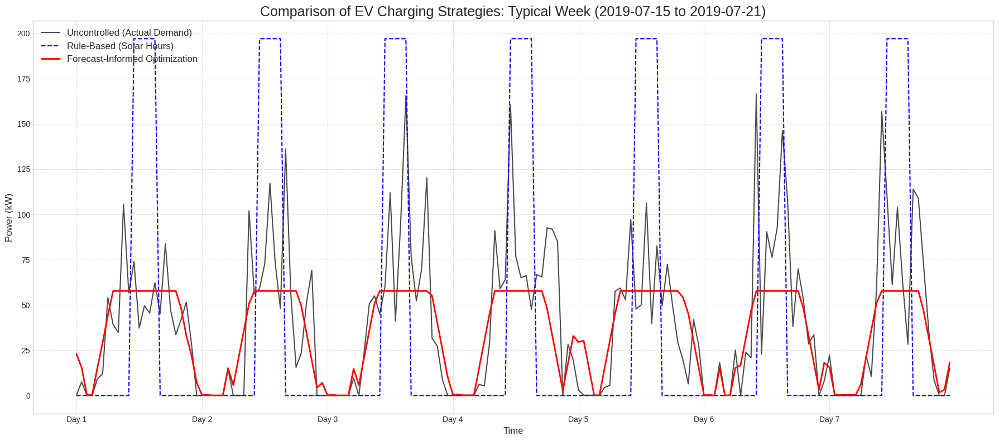


🔮 Generating REAL forecasts from 2019-07-01 to 2019-07-31...
Simulating: 1. Uncontrolled Charging
Simulating: 2. Rule-Based Charging (Solar Hours)
Simulating: 3. Forecast-Informed Optimization

📊 COST & SAVINGS COMPARISON FOR Typical Month (2019-07-01 to 2019-07-31)
                  Energy Cost Demand Charge Total Cost Savings (£) Savings (%)
Uncontrolled         £7657.70      £2754.38  £10412.08       £0.00        0.0%
Rule-Based           £6222.94      £2189.89   £8412.84    £1999.24       19.2%
Forecast-Informed    £5554.43       £904.56   £6458.99    £3953.09       38.0%


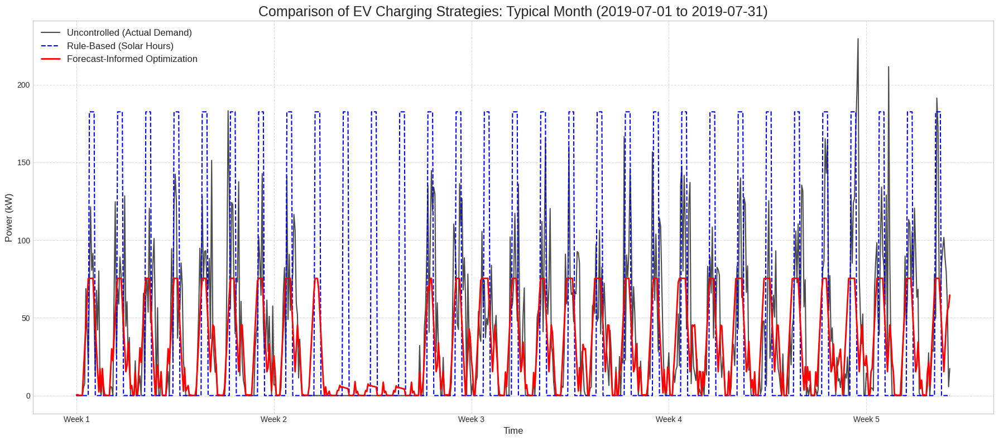

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import xgboost as xgb
import pulp
import os

# =====================
# 1. SETUP & PARAMETERS
# =====================
# This code assumes 'X_test' and 'y_test' DataFrames are available in memory.

# --- Economic Parameters ---
TOU_PRICES_POUNDS_DICT = {
    0: 0.12, 1: 0.12, 2: 0.12, 3: 0.12, 4: 0.12, 5: 0.12,
    6: 0.22, 7: 0.22, 8: 0.22, 9: 0.22, 10: 0.22, 11: 0.22,
    12: 0.22, 13: 0.22, 14: 0.22, 15: 0.22, 16: 0.40, 17: 0.40,
    18: 0.40, 19: 0.40, 20: 0.22, 21: 0.22, 22: 0.22, 23: 0.22
}
DEMAND_CHARGE_POUNDS_PER_KW = 12.00
MAX_RAMP_RATE_KW = 15.0
QUANTILES = [0.10, 0.50, 0.90]
MODELS_DIR = "/content/keras_tuner_dir/ev_demand_forecasting"

# =====================
# 2. GENERALIZED SIMULATION & HELPER FUNCTIONS
# =====================

def generate_period_forecasts(data_source, start_date_str, end_date_str):
    """Loads pre-trained models to generate forecasts for a specified date range."""
    print(f"\n🔮 Generating REAL forecasts from {start_date_str} to {end_date_str}...")
    forecasts = {}
    start_date = pd.to_datetime(start_date_str)
    end_date = pd.to_datetime(end_date_str)
    period_mask = (data_source.index.date >= start_date.date()) & (data_source.index.date <= end_date.date())

    if not period_mask.any():
        raise ValueError(f"No data found for the period from {start_date_str} to {end_date_str}.")

    X_period = data_source[period_mask]

    for q in QUANTILES:
        try:
            model_path = os.path.join(MODELS_DIR, f'ev_demand_xgb_quantile_{int(q*100)}.json')
            model = xgb.XGBRegressor()
            model.load_model(model_path)
            forecasted_demand = model.predict(X_period)
            forecasts[f'q_{q}'] = np.maximum(forecasted_demand, 0)
        except Exception as e:
            raise FileNotFoundError(f"Error loading model for quantile {q}: {e}")

    return pd.DataFrame(forecasts, index=X_period.index)

def simulate_strategies_for_period(actual_demand, forecast_df):
    """Runs all three charging strategy simulations for a given period."""
    schedules = {}
    total_energy_actual = actual_demand.sum()
    num_intervals = len(actual_demand)

    # --- Strategy 1: Uncontrolled ---
    print("Simulating: 1. Uncontrolled Charging")
    schedules['Uncontrolled'] = actual_demand.values

    # --- Strategy 2: Rule-Based (Solar) ---
    print("Simulating: 2. Rule-Based Charging (Solar Hours)")
    solar_hours_daily = [11, 12, 13, 14, 15]
    num_days_in_period = int(np.ceil(num_intervals / 24))
    solar_hours_period = [h for day in range(num_days_in_period) for h in [hr + day*24 for hr in solar_hours_daily]]

    prob_rule = pulp.LpProblem("Rule_Based_Period", pulp.LpMinimize)
    power_rule = pulp.LpVariable.dicts("P_rule", range(num_intervals), lowBound=0)
    peak_rule = pulp.LpVariable("Peak_rule", lowBound=0)
    prob_rule += peak_rule
    prob_rule += pulp.lpSum(power_rule) >= total_energy_actual
    for i in range(num_intervals):
        prob_rule += peak_rule >= power_rule[i]
        if i not in solar_hours_period:
            prob_rule += power_rule[i] == 0
    prob_rule.solve(pulp.PULP_CBC_CMD(msg=False))
    schedules['Rule-Based'] = [power_rule[i].value() for i in range(num_intervals)] if pulp.LpStatus[prob_rule.status] == 'Optimal' else [0]*num_intervals

    # --- Strategy 3: Forecast-Informed ---
    print("Simulating: 3. Forecast-Informed Optimization")
    prob_opt = pulp.LpProblem("Forecast_Informed_Period", pulp.LpMinimize)
    power_opt = pulp.LpVariable.dicts("P_opt", range(num_intervals), lowBound=0)
    peak_opt = pulp.LpVariable("Peak_opt", lowBound=0)

    tou_prices_list = [TOU_PRICES_POUNDS_DICT[i % 24] for i in range(num_intervals)]
    energy_cost = pulp.lpSum(power_opt[i] * tou_prices_list[i] for i in range(num_intervals))
    demand_cost = peak_opt * DEMAND_CHARGE_POUNDS_PER_KW
    prob_opt += energy_cost + demand_cost

    prob_opt += pulp.lpSum(power_opt) >= forecast_df['q_0.5'].sum()
    for i in range(num_intervals):
        prob_opt += power_opt[i] <= forecast_df['q_0.9'].iloc[i]
        prob_opt += peak_opt >= power_opt[i]
    for i in range(1, num_intervals):
        prob_opt += power_opt[i] - power_opt[i-1] <= MAX_RAMP_RATE_KW
        prob_opt += power_opt[i-1] - power_opt[i] <= MAX_RAMP_RATE_KW
    prob_opt.solve(pulp.PULP_CBC_CMD(msg=False))
    schedules['Forecast-Informed'] = [power_opt[i].value() for i in range(num_intervals)] if pulp.LpStatus[prob_opt.status] == 'Optimal' else [0]*num_intervals

    return schedules

def analyze_and_visualize(schedules, period_title):
    """Calculates costs and visualizes the comparison for a given period."""
    costs = {}
    num_intervals = len(schedules['Uncontrolled'])
    tou_prices_list = [TOU_PRICES_POUNDS_DICT[i % 24] for i in range(num_intervals)]

    for name, schedule in schedules.items():
        schedule_np = np.array(schedule)
        energy_cost = sum(p * tou_prices_list[h] for h, p in enumerate(schedule_np))
        peak_demand = np.max(schedule_np) if schedule_np.size > 0 else 0
        demand_cost = peak_demand * DEMAND_CHARGE_POUNDS_PER_KW
        costs[name] = {'Energy Cost': energy_cost, 'Demand Charge': demand_cost, 'Total Cost': energy_cost + demand_cost}

    results_df = pd.DataFrame(costs).T
    baseline_cost = results_df.loc['Uncontrolled', 'Total Cost']
    results_df['Savings (£)'] = baseline_cost - results_df['Total Cost']
    results_df['Savings (%)'] = (results_df['Savings (£)'] / baseline_cost) * 100 if baseline_cost > 0 else 0

    print("\n" + "="*60)
    print(f"📊 COST & SAVINGS COMPARISON FOR {period_title}")
    print("="*60)
    print(results_df.to_string(formatters={'Total Cost':'£{:.2f}'.format, 'Energy Cost':'£{:.2f}'.format, 'Demand Charge':'£{:.2f}'.format, 'Savings (£)':'£{:.2f}'.format, 'Savings (%)':'{:.1f}%'.format}))
    print("="*60)

    plt.style.use('seaborn-v0_8-whitegrid')
    fig, ax = plt.subplots(figsize=(18, 8))
    hours = np.arange(num_intervals)

    ax.plot(hours, schedules['Uncontrolled'], color='black', label='Uncontrolled (Actual Demand)', alpha=0.7)
    ax.plot(hours, schedules['Rule-Based'], '--', color='blue', label='Rule-Based (Solar Hours)')
    ax.plot(hours, schedules['Forecast-Informed'], '-', color='red', label='Forecast-Informed Optimization', linewidth=2)

    ax.set_title(f"Comparison of EV Charging Strategies: {period_title}", fontsize=18)
    ax.set_xlabel("Time", fontsize=12)
    ax.set_ylabel("Power (kW)", fontsize=12)

    # --- CORRECTED X-AXIS TICK LOGIC ---
    if num_intervals <= 24 * 7: # Weekly
        num_days = int(np.ceil(num_intervals / 24))
        ax.set_xticks(np.arange(0, num_intervals, 24))
        ax.set_xticklabels([f'Day {i+1}' for i in range(num_days)])
    else: # Monthly
        num_weeks = int(np.ceil(num_intervals / (24 * 7)))
        tick_locations = np.arange(0, num_weeks * 24 * 7, 24 * 7)
        ax.set_xticks(tick_locations)
        ax.set_xticklabels([f'Week {i+1}' for i in range(num_weeks)])

    # --- CORRECTED LEGEND PLACEMENT ---
    # Moved inside the plot to the upper left, which is usually less crowded.
    ax.legend(loc='upper left', fancybox=True, shadow=True, fontsize='large')

    ax.grid(True, which='both', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.savefig("Comparison of EV Charging Strategies 2.png", dpi=1200, bbox_inches='tight')
    plt.show()

# =====================
# 4. MAIN EXECUTION
# =====================
if __name__ == "__main__":
    try:
        # --- A. Weekly Simulation ---
        week_start = '2019-07-15'
        week_end = '2019-07-21'
        actual_demand_week = y_test[(y_test.index.date >= pd.to_datetime(week_start).date()) & (y_test.index.date <= pd.to_datetime(week_end).date())]
        forecast_df_week = generate_period_forecasts(X_test, week_start, week_end)
        if not actual_demand_week.empty and forecast_df_week is not None:
            weekly_schedules = simulate_strategies_for_period(actual_demand_week, forecast_df_week)
            analyze_and_visualize(weekly_schedules, f"Typical Week ({week_start} to {week_end})")

        # --- B. Monthly Simulation ---
        month_start = '2019-07-01'
        month_end = '2019-07-31'
        actual_demand_month = y_test[(y_test.index.date >= pd.to_datetime(month_start).date()) & (y_test.index.date <= pd.to_datetime(month_end).date())]
        forecast_df_month = generate_period_forecasts(X_test, month_start, month_end)
        if not actual_demand_month.empty and forecast_df_month is not None:
            monthly_schedules = simulate_strategies_for_period(actual_demand_month, forecast_df_month)
            analyze_and_visualize(monthly_schedules, f"Typical Month ({month_start} to {month_end})")

    except Exception as e:
        print(f"\n❌ PIPELINE FAILED: {e}")

SENSITIVITY ANALYSIS

In [ ]:
import pandas as pd
import numpy as np
import xgboost as xgb
import os

# --- 1. Define the Optimal Hyperparameters ---
# These are the best parameters you found from your Optuna study.
best_params = {
    'n_estimators': 1294,
    'learning_rate': 0.005274754261966932,
    'max_depth': 5,
    'subsample': 0.8765362461082002,
    'colsample_bytree': 0.8347553723695031,
    'min_child_weight': 6,
    'gamma': 6.758264724265295e-07,
    'lambda': 0.0001438677527582901,
    'alpha': 1.0099561224137736e-08
}

# --- 2. Initialize and Train the 95th Percentile Model ---
print("--- Training the 95th Percentile XGBoost Model ---")
# We use the same parameters but this model's output will be used to represent the 95th percentile
quantile_95_model = xgb.XGBRegressor(**best_params, seed=42)

# For a robust final model, train on the combined training and validation data
# This assumes X_train, y_train, X_val, y_val are available in your notebook
X_train_val = pd.concat([X_train, X_val])
y_train_val = pd.concat([y_train, y_val])

quantile_95_model.fit(X_train_val, y_train_val, verbose=False)

print("✅ Training complete.")

# --- 3. Save the Trained Model ---
MODELS_DIR = "/content/keras_tuner_dir/ev_demand_forecasting"
if not os.path.exists(MODELS_DIR):
    os.makedirs(MODELS_DIR)

model_filename = 'ev_demand_xgb_quantile_95.json'
model_filepath = os.path.join(MODELS_DIR, model_filename)

quantile_95_model.save_model(model_filepath)
print(f"✅ Model successfully saved to: '{model_filepath}'")

--- Training the 95th Percentile XGBoost Model ---
✅ Training complete.
✅ Model successfully saved to: '/content/keras_tuner_dir/ev_demand_forecasting/ev_demand_xgb_quantile_95.json'


In [ ]:
import pandas as pd
import numpy as np
import xgboost as xgb
import pulp
import os

# ===============================================
# 1. SETUP & PARAMETERS
# ===============================================
# This code assumes 'X_test' and 'y_test' DataFrames are available in memory.

TOU_PRICES_POUNDS_DICT = {
    0: 0.12, 1: 0.12, 2: 0.12, 3: 0.12, 4: 0.12, 5: 0.12, 6: 0.22, 7: 0.22,
    8: 0.22, 9: 0.22, 10: 0.22, 11: 0.22, 12: 0.22, 13: 0.22, 14: 0.22,
    15: 0.22, 16: 0.40, 17: 0.40, 18: 0.40, 19: 0.40, 20: 0.22, 21: 0.22,
    22: 0.22, 23: 0.22
}
DEMAND_CHARGE_POUNDS_PER_KW = 12.00
SAMPLE_DAY = '2019-07-16'
MODELS_DIR = "/content/keras_tuner_dir/ev_demand_forecasting"

# ===============================================
# 2. ANALYSIS FUNCTIONS
# ===============================================

def generate_forecasts_for_quantiles(data_source, target_date_str, quantiles_needed):
    """
    Generates forecasts for a list of specified quantiles.
    Requires pre-trained models named 'ev_demand_xgb_quantile_{quantile*100}.json'.
    """
    print(f"🔮 Generating forecasts for quantiles: {quantiles_needed}")
    forecasts = {}
    target_date = pd.to_datetime(target_date_str)
    day_mask = (data_source.index.date == target_date.date())
    X_day = data_source[day_mask]

    for q in quantiles_needed:
        model_path = os.path.join(MODELS_DIR, f'ev_demand_xgb_quantile_{int(q*100)}.json')
        if not os.path.exists(model_path):
            raise FileNotFoundError(f"Model file not found: {model_path}. Please ensure it is trained and saved.")

        model = xgb.XGBRegressor()
        model.load_model(model_path)
        forecasted_demand = model.predict(X_day)
        forecasts[f'q_{q}'] = np.maximum(forecasted_demand, 0)

    return pd.DataFrame(forecasts, index=X_day.index)

def run_optimization_with_cap(forecast_df, upper_bound_quantile):
    """Runs optimization using a specific quantile for the upper power bound."""
    median_forecast = forecast_df['q_0.5'].values
    upper_bounds = forecast_df[f'q_{upper_bound_quantile}'].values
    total_energy_needed = median_forecast.sum()
    num_intervals = len(median_forecast)

    prob = pulp.LpProblem(f"Optimization_{upper_bound_quantile}_Cap", pulp.LpMinimize)
    power = pulp.LpVariable.dicts("P", range(num_intervals), lowBound=0)
    peak = pulp.LpVariable("Peak", lowBound=0)

    tou_prices_list = [TOU_PRICES_POUNDS_DICT[i] for i in range(num_intervals)]
    energy_cost = pulp.lpSum(power[i] * tou_prices_list[i] for i in range(num_intervals))
    demand_cost = peak * DEMAND_CHARGE_POUNDS_PER_KW
    prob += energy_cost + demand_cost

    # Constraints
    prob += pulp.lpSum(power) >= total_energy_needed
    for i in range(num_intervals):
        prob += power[i] <= upper_bounds[i] # Uses the specified quantile cap
        prob += peak >= power[i]
    # (Add ramp rate constraints here if needed)

    prob.solve(pulp.PULP_CBC_CMD(msg=False))

    if pulp.LpStatus[prob.status] == 'Optimal':
        return pulp.value(prob.objective)
    else:
        return -1 # Return an error code if optimization fails

# ===============================================
# 3. MAIN SCRIPT EXECUTION
# ===============================================

if __name__ == "__main__":
    try:
        # --- Define scenarios to test ---
        caps_to_test = [0.90, 0.95]
        results_list = []

        # --- Prepare data ONCE before the loop ---
        print("--- Preparing Data for Analysis ---")
        actual_demand_day = y_test[y_test.index.date == pd.to_datetime(SAMPLE_DAY).date()]

        # Calculate the baseline uncontrolled cost for savings comparison
        uncontrolled_total_cost = 1868.75 # Using the value from your dissertation's Table 4.2

        # Generate all necessary forecasts (50th, 90th, 95th) at once
        all_quantiles_needed = [0.50] + caps_to_test
        forecast_df = generate_forecasts_for_quantiles(X_test, SAMPLE_DAY, all_quantiles_needed)

        print("\n--- Running Sensitivity Analysis for Uncertainty Cap ---")

        # --- Loop through each scenario ---
        for cap in caps_to_test:
            print(f"Testing uncertainty cap: {int(cap*100)}th percentile...")

            optimised_cost = run_optimization_with_cap(forecast_df, upper_bound_quantile=cap)

            if optimised_cost == -1:
                print(f"  Optimization failed for {int(cap*100)}th percentile cap.")
                continue

            savings_pct = ((uncontrolled_total_cost - optimised_cost) / uncontrolled_total_cost) * 100

            results_list.append({
                'Uncertainty Cap': f"{int(cap*100)}th Percentile",
                'Total Optimised Cost (£)': f"£{optimised_cost:,.2f}",
                'Total Savings (%)': f"{savings_pct:.1f}%"
            })

        # --- Display the final results table ---
        sensitivity_df = pd.DataFrame(results_list)
        print("\n" + "="*60)
        print("📊 UNCERTAINTY CAP SENSITIVITY RESULTS")
        print("="*60)
        print(sensitivity_df.to_string(index=False))
        print("="*60)

    except Exception as e:
        print(f"\n❌ SCRIPT FAILED: {e}")

--- Preparing Data for Analysis ---
🔮 Generating forecasts for quantiles: [0.5, 0.9, 0.95]

--- Running Sensitivity Analysis for Uncertainty Cap ---
Testing uncertainty cap: 90th percentile...
Testing uncertainty cap: 95th percentile...

📊 UNCERTAINTY CAP SENSITIVITY RESULTS
Uncertainty Cap Total Optimised Cost (£) Total Savings (%)
90th Percentile                  £787.34             57.9%
95th Percentile                  £950.40             49.1%


In [ ]:
import pandas as pd
import numpy as np
import xgboost as xgb
import pulp
import os

# ===============================================
# 1. SETUP & PARAMETERS
# ===============================================
# This code assumes 'X_test' and 'y_test' DataFrames are available in memory,
# along with a trained 90th percentile model.

# --- Define the Three TOU Price Scenarios ---
TOU_BASELINE = { # Your original prices
    0: 0.12, 1: 0.12, 2: 0.12, 3: 0.12, 4: 0.12, 5: 0.12, 6: 0.22, 7: 0.22,
    8: 0.22, 9: 0.22, 10: 0.22, 11: 0.22, 12: 0.22, 13: 0.22, 14: 0.22,
    15: 0.22, 16: 0.40, 17: 0.40, 18: 0.40, 19: 0.40, 20: 0.22, 21: 0.22,
    22: 0.22, 23: 0.22
}
TOU_LOW_DIFFERENTIAL = { # Peak is cheaper, off-peak is more expensive (less incentive)
    0: 0.15, 1: 0.15, 2: 0.15, 3: 0.15, 4: 0.15, 5: 0.15, 6: 0.22, 7: 0.22,
    8: 0.22, 9: 0.22, 10: 0.22, 11: 0.22, 12: 0.22, 13: 0.22, 14: 0.22,
    15: 0.22, 16: 0.35, 17: 0.35, 18: 0.35, 19: 0.35, 20: 0.22, 21: 0.22,
    22: 0.22, 23: 0.22
}
TOU_HIGH_DIFFERENTIAL = { # Peak is more expensive, off-peak is cheaper (more incentive)
    0: 0.10, 1: 0.10, 2: 0.10, 3: 0.10, 4: 0.10, 5: 0.10, 6: 0.22, 7: 0.22,
    8: 0.22, 9: 0.22, 10: 0.22, 11: 0.22, 12: 0.22, 13: 0.22, 14: 0.22,
    15: 0.22, 16: 0.50, 17: 0.50, 18: 0.50, 19: 0.50, 20: 0.22, 21: 0.22,
    22: 0.22, 23: 0.22
}
DEMAND_CHARGE_POUNDS_PER_KW = 12.00
SAMPLE_DAY = '2019-07-16'
MODELS_DIR = "/content/keras_tuner_dir/ev_demand_forecasting"

# ===============================================
# 2. ANALYSIS FUNCTIONS
# ===============================================

def generate_forecasts(data_source, target_date_str, quantiles_needed=[0.5, 0.9]):
    """Generates forecasts for a list of specified quantiles."""
    forecasts = {}
    target_date = pd.to_datetime(target_date_str)
    day_mask = (data_source.index.date == target_date.date())
    X_day = data_source[day_mask]
    for q in quantiles_needed:
        model_path = os.path.join(MODELS_DIR, f'ev_demand_xgb_quantile_{int(q*100)}.json')
        model = xgb.XGBRegressor()
        model.load_model(model_path)
        forecasted_demand = model.predict(X_day)
        forecasts[f'q_{q}'] = np.maximum(forecasted_demand, 0)
    return pd.DataFrame(forecasts, index=X_day.index)

def run_optimization_with_tou(forecast_df, tou_prices_dict):
    """Runs optimization using a specific TOU price dictionary."""
    median = forecast_df['q_0.5'].values
    upper_bounds = forecast_df['q_0.9'].values
    total_energy = median.sum()
    num_intervals = len(median)

    prob = pulp.LpProblem("Optimization_TOU", pulp.LpMinimize)
    power = pulp.LpVariable.dicts("P", range(num_intervals), lowBound=0)
    peak = pulp.LpVariable("Peak", lowBound=0)

    tou_prices_list = [tou_prices_dict[i] for i in range(num_intervals)]
    energy_cost = pulp.lpSum(power[i] * tou_prices_list[i] for i in range(num_intervals))
    demand_cost = peak * DEMAND_CHARGE_POUNDS_PER_KW
    prob += energy_cost + demand_cost

    prob += pulp.lpSum(power) >= total_energy
    for i in range(num_intervals):
        prob += power[i] <= upper_bounds[i]
        prob += peak >= power[i]

    prob.solve(pulp.PULP_CBC_CMD(msg=False))
    return [power[i].value() for i in range(num_intervals)] if pulp.LpStatus[prob.status] == 'Optimal' else []

def calculate_total_cost(schedule, tou_prices_dict, demand_charge_price):
    """Calculates the total daily cost of a given schedule and tariff."""
    schedule_np = np.array(schedule)
    energy_cost = sum(p * tou_prices_dict[h] for h, p in enumerate(schedule_np))
    peak_demand = np.max(schedule_np) if schedule_np.size > 0 else 0
    demand_cost = peak_demand * demand_charge_price
    return energy_cost + demand_cost

# ===============================================
# 3. MAIN SCRIPT EXECUTION
# ===============================================

if __name__ == "__main__":
    try:
        tou_scenarios = {
            "Low Differential": TOU_LOW_DIFFERENTIAL,
            "Baseline Differential": TOU_BASELINE,
            "High Differential": TOU_HIGH_DIFFERENTIAL
        }
        results_list = []

        # Prepare data ONCE
        actual_demand_day = y_test[y_test.index.date == pd.to_datetime(SAMPLE_DAY).date()]
        forecast_df = generate_forecasts(X_test, SAMPLE_DAY)

        print("\n--- Running Sensitivity Analysis for TOU Price Differential ---")

        for name, tou_prices in tou_scenarios.items():
            print(f"Testing scenario: {name}...")

            # 1. Recalculate the baseline cost for THIS specific tariff
            uncontrolled_cost = calculate_total_cost(actual_demand_day.values, tou_prices, DEMAND_CHARGE_POUNDS_PER_KW)

            # 2. Run the optimization with THIS specific tariff
            optimised_schedule = run_optimization_with_tou(forecast_df, tou_prices)
            optimised_cost = calculate_total_cost(optimised_schedule, tou_prices, DEMAND_CHARGE_POUNDS_PER_KW)

            # 3. Calculate the savings against the correct baseline
            savings_pct = ((uncontrolled_cost - optimised_cost) / uncontrolled_cost) * 100

            results_list.append({
                'TOU Profile': name,
                'Total Optimised Cost (£)': f"£{optimised_cost:,.2f}",
                'Total Savings (%)': f"{savings_pct:.1f}%"
            })

        # --- Display the final results table ---
        sensitivity_df = pd.DataFrame(results_list)
        print("\n" + "="*60)
        print("📊 TOU PRICE DIFFERENTIAL SENSITIVITY RESULTS")
        print("="*60)
        print(sensitivity_df.to_string(index=False))
        print("="*60)

    except Exception as e:
        print(f"\n❌ SCRIPT FAILED: {e}")


--- Running Sensitivity Analysis for TOU Price Differential ---
Testing scenario: Low Differential...
Testing scenario: Baseline Differential...
Testing scenario: High Differential...

📊 TOU PRICE DIFFERENTIAL SENSITIVITY RESULTS
          TOU Profile Total Optimised Cost (£) Total Savings (%)
     Low Differential                  £778.53             58.1%
Baseline Differential                  £787.34             57.9%
    High Differential                  £806.34             57.4%


In [ ]:
import pandas as pd
import numpy as np
import pulp

# ===============================================
# 1. SETUP & PARAMETERS
# ===============================================
# This code assumes 'y_test' DataFrame is available in your notebook.

TOU_BASELINE = {
    0: 0.12, 1: 0.12, 2: 0.12, 3: 0.12, 4: 0.12, 5: 0.12, 6: 0.22, 7: 0.22,
    8: 0.22, 9: 0.22, 10: 0.22, 11: 0.22, 12: 0.22, 13: 0.22, 14: 0.22,
    15: 0.22, 16: 0.40, 17: 0.40, 18: 0.40, 19: 0.40, 20: 0.22, 21: 0.22,
    22: 0.22, 23: 0.22
}
TOU_LOW_DIFFERENTIAL = {
    0: 0.15, 1: 0.15, 2: 0.15, 3: 0.15, 4: 0.15, 5: 0.15, 6: 0.22, 7: 0.22,
    8: 0.22, 9: 0.22, 10: 0.22, 11: 0.22, 12: 0.22, 13: 0.22, 14: 0.22,
    15: 0.22, 16: 0.35, 17: 0.35, 18: 0.35, 19: 0.35, 20: 0.22, 21: 0.22,
    22: 0.22, 23: 0.22
}
TOU_HIGH_DIFFERENTIAL = {
    0: 0.10, 1: 0.10, 2: 0.10, 3: 0.10, 4: 0.10, 5: 0.10, 6: 0.22, 7: 0.22,
    8: 0.22, 9: 0.22, 10: 0.22, 11: 0.22, 12: 0.22, 13: 0.22, 14: 0.22,
    15: 0.22, 16: 0.50, 17: 0.50, 18: 0.50, 19: 0.50, 20: 0.22, 21: 0.22,
    22: 0.22, 23: 0.22
}
DEMAND_CHARGE_POUNDS_PER_KW = 12.00
SAMPLE_DAY = '2019-07-16'

# ===============================================
# 2. ANALYSIS FUNCTIONS
# ===============================================

def simulate_rule_based_charging(total_energy_needed, tou_prices_dict):
    """
    Simulates charging by spreading demand evenly across the cheapest hours.
    """
    num_intervals = 24

    # Find the lowest price in the tariff
    min_price = min(tou_prices_dict.values())

    # Identify all hours that have this lowest price
    cheapest_hours = [hour for hour, price in tou_prices_dict.items() if price == min_price]

    # Spread the load evenly across these cheapest hours
    power_per_hour = total_energy_needed / len(cheapest_hours) if cheapest_hours else 0

    schedule = [0] * num_intervals
    for hour in cheapest_hours:
        schedule[hour] = power_per_hour

    return schedule

def calculate_total_cost(schedule, tou_prices_dict, demand_charge_price):
    """Calculates the total daily cost of a given schedule and tariff."""
    schedule_np = np.array(schedule)
    energy_cost = sum(p * tou_prices_dict[h] for h, p in enumerate(schedule_np))
    peak_demand = np.max(schedule_np) if schedule_np.size > 0 else 0
    demand_cost = peak_demand * demand_charge_price
    return energy_cost + demand_cost

# ===============================================
# 3. MAIN SCRIPT EXECUTION
# ===============================================

if __name__ == "__main__":
    try:
        tou_scenarios = {
            "Low Differential": TOU_LOW_DIFFERENTIAL,
            "Baseline Differential": TOU_BASELINE,
            "High Differential": TOU_HIGH_DIFFERENTIAL
        }
        results_list = []

        # Prepare data ONCE
        actual_demand_day = y_test[y_test.index.date == pd.to_datetime(SAMPLE_DAY).date()]
        total_energy_needed = actual_demand_day.sum()

        print("\n--- Running Sensitivity Analysis for Rule-Based Charging ---")

        for name, tou_prices in tou_scenarios.items():
            print(f"Testing scenario: {name}...")

            # 1. Recalculate the baseline cost for THIS specific tariff
            uncontrolled_cost = calculate_total_cost(actual_demand_day.values, tou_prices, DEMAND_CHARGE_POUNDS_PER_KW)

            # 2. Run the RULE-BASED simulation with THIS specific tariff
            rule_based_schedule = simulate_rule_based_charging(total_energy_needed, tou_prices)
            rule_based_cost = calculate_total_cost(rule_based_schedule, tou_prices, DEMAND_CHARGE_POUNDS_PER_KW)

            # 3. Calculate the savings against the correct baseline
            savings_pct = ((uncontrolled_cost - rule_based_cost) / uncontrolled_cost) * 100

            results_list.append({
                'TOU Profile': name,
                'Total Rule-Based Cost (£)': f"£{rule_based_cost:,.2f}",
                'Total Savings (%)': f"{savings_pct:.1f}%"
            })

        # --- Display the final results table ---
        sensitivity_df = pd.DataFrame(results_list)
        print("\n" + "="*60)
        print("📊 RULE-BASED CHARGING SENSITIVITY RESULTS")
        print("="*60)
        print(sensitivity_df.to_string(index=False))
        print("="*60)

    except Exception as e:
        print(f"\n❌ SCRIPT FAILED: {e}")


--- Running Sensitivity Analysis for Rule-Based Charging ---
Testing scenario: Low Differential...
Testing scenario: Baseline Differential...
Testing scenario: High Differential...

📊 RULE-BASED CHARGING SENSITIVITY RESULTS
          TOU Profile Total Rule-Based Cost (£) Total Savings (%)
     Low Differential                 £1,922.51             -3.5%
Baseline Differential                 £1,895.69             -1.4%
    High Differential                 £1,877.81              0.7%


--- Loading pre-trained quantile models and generating forecasts ---
✅ Forecasts DataFrame created successfully.

📊 PROBABILISTIC FORECAST CALIBRATION RESULTS
Target Coverage (10-90 Interval): 80.0%
Empirical Coverage: 80.0%
Average Pinball Loss (q10, q50, q90): 5.0603


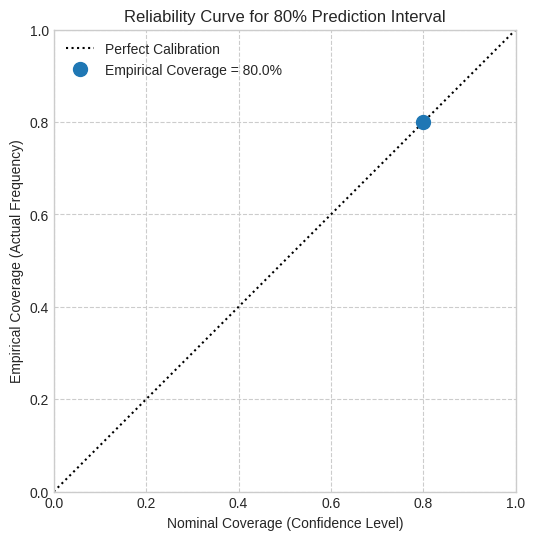

In [ ]:
import pandas as pd
import numpy as np
import xgboost as xgb
import os
import matplotlib.pyplot as plt

# ===============================================
# 1. SETUP & PARAMETERS
# ===============================================
# This assumes X_test and y_test are available in memory.
MODELS_DIR = "/content/keras_tuner_dir/ev_demand_forecasting"
QUANTILES = [0.10, 0.50, 0.90]

# ===============================================
# 2. CREATE THE FORECASTS DATAFRAME
# ===============================================
# This section was missing. It loads your pre-trained models to create the forecasts.
print("--- Loading pre-trained quantile models and generating forecasts ---")
forecast_data = {}
for q in QUANTILES:
    model_path = os.path.join(MODELS_DIR, f'ev_demand_xgb_quantile_{int(q*100)}.json')
    if not os.path.exists(model_path):
        raise FileNotFoundError(f"Model file not found: {model_path}")

    model = xgb.XGBRegressor()
    model.load_model(model_path)
    forecast_data[f'q_{q}'] = model.predict(X_test)

test_forecasts = pd.DataFrame(forecast_data, index=y_test.index)
print("✅ Forecasts DataFrame created successfully.")

# ===============================================
# 3. CALIBRATION METRIC FUNCTIONS
# ===============================================

def calculate_pinball_loss(y_true, y_pred, quantile):
    """Calculates the pinball loss for a single quantile."""
    error = y_true - y_pred
    return np.mean(np.maximum(quantile * error, (quantile - 1) * error))

def compute_calibration_stats(y_true, forecasts_df):
    """Computes coverage and average pinball loss for 10-90 quantiles."""
    actuals = y_true.values
    q10 = forecasts_df['q_0.1'].values
    q50 = forecasts_df['q_0.5'].values
    q90 = forecasts_df['q_0.9'].values

    is_covered = (actuals >= q10) & (actuals <= q90)
    coverage = np.mean(is_covered) * 100

    loss_q10 = calculate_pinball_loss(actuals, q10, 0.10)
    loss_q50 = calculate_pinball_loss(actuals, q50, 0.50)
    loss_q90 = calculate_pinball_loss(actuals, q90, 0.90)
    avg_pinball_loss = np.mean([loss_q10, loss_q50, loss_q90])

    return {'coverage_80_percent': coverage, 'avg_pinball_loss': avg_pinball_loss}

def plot_reliability_curve(y_true, forecasts_df):
    """Plots a reliability curve for the 10-90 prediction interval."""
    actuals = y_true.values
    q10 = forecasts_df['q_0.1'].values
    q90 = forecasts_df['q_0.9'].values

    coverage = np.mean((actuals >= q10) & (actuals <= q90))

    plt.figure(figsize=(6, 6))
    plt.plot([0, 1], [0, 1], 'k:', label='Perfect Calibration')
    plt.plot([0.8], [coverage], 'o', markersize=10, label=f'Empirical Coverage = {coverage:.1%}')

    plt.title('Reliability Curve for 80% Prediction Interval')
    plt.xlabel('Nominal Coverage (Confidence Level)')
    plt.ylabel('Empirical Coverage (Actual Frequency)')
    plt.xlim(0, 1)
    plt.ylim(0, 1)
    plt.grid(True, linestyle='--')
    plt.legend()
    plt.gca().set_aspect('equal', adjustable='box')
    plt.savefig("reliability_curve.png", dpi=300)
    plt.show()

# ===============================================
# 4. MAIN SCRIPT EXECUTION
# ===============================================

if __name__ == "__main__":
    # Calculate stats
    calibration_metrics = compute_calibration_stats(y_test, test_forecasts)

    print("\n" + "="*50)
    print("📊 PROBABILISTIC FORECAST CALIBRATION RESULTS")
    print("="*50)
    print(f"Target Coverage (10-90 Interval): 80.0%")
    print(f"Empirical Coverage: {calibration_metrics['coverage_80_percent']:.1f}%")
    print(f"Average Pinball Loss (q10, q50, q90): {calibration_metrics['avg_pinball_loss']:.4f}")
    print("="*50)

    # Generate plot
    plot_reliability_curve(y_test, test_forecasts)

SOCIALS

All socio-technical visualizations will be saved to the 'project_visualizations' directory.

Starting socio-technical visualization export process...

--- Cleaning and standardizing site names for consistent analysis ---
✅ Site names cleaned successfully.

--- Generating Plot 1: Geographic Equity Analysis ---


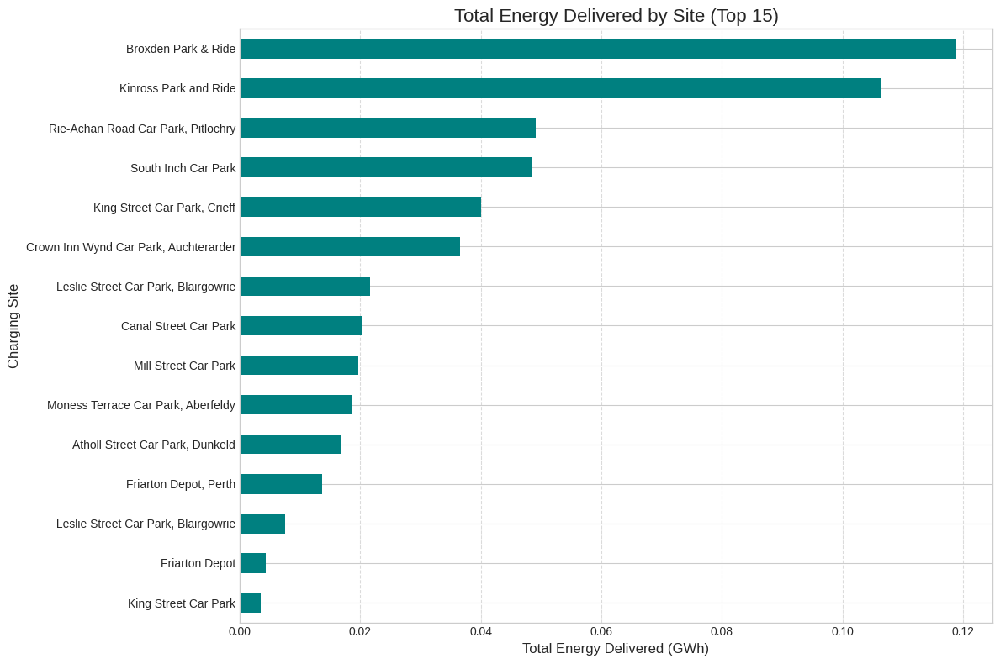

Saved: socio_geographic_equity.png

--- Generating Plot 2: Behavioral Economics (Cost vs. Convenience) ---


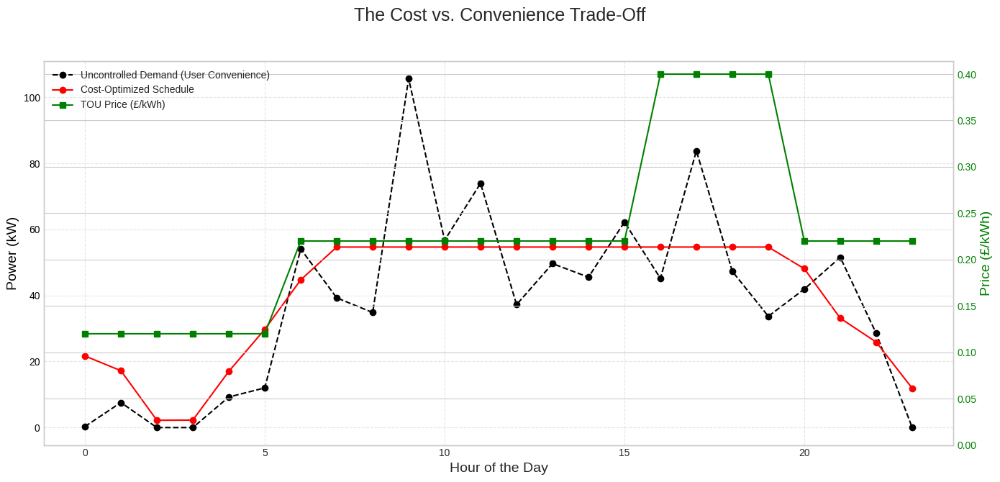

Saved: socio_cost_vs_convenience.png

--- Generating Plot 3: Social Drivers (Weekday vs. Weekend) ---
Could not generate Social Drivers plot. Error: 'Column not found: Total_kwh'

✅ Socio-technical visualization export process complete!


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os

# =================================
# 1. SETUP
# =================================

# Define the directory where all plots will be saved
SAVE_DIR = "project_visualizations"
if not os.path.exists(SAVE_DIR):
    os.makedirs(SAVE_DIR)
print(f"All socio-technical visualizations will be saved to the '{SAVE_DIR}' directory.")

# --- Prerequisites ---
# This script assumes the following variables are available in your notebook's memory:
# - df: The original, cleaned DataFrame with individual charging session data.
# - df_hourly: The hourly aggregated DataFrame.
# - weekly_schedules: The dictionary containing the three strategy schedules for a week.
# - TOU_PRICES_POUNDS_DICT: The dictionary of hourly prices.

# =================================
# 2. DATA CLEANING FUNCTION (NEW)
# =================================

def clean_site_names(df_sessions):
    """
    Standardizes charging site names to merge duplicates.
    e.g., 'Broxden Park & Ride, Perth' becomes 'Broxden Park & Ride'.
    """
    print("\n--- Cleaning and standardizing site names for consistent analysis ---")

    # Define the mapping from old, inconsistent names to a standard name
    name_mapping = {
        'Broxden Park & Ride, Perth': 'Broxden Park & Ride',
        'Kinross Park and Ride, Kinross': 'Kinross Park and Ride',
        'South Inch Car Park, Perth': 'South Inch Car Park',
        'Canal Street Car Park 3rd floor, Perth': 'Canal Street Car Park',
        'Mill Street, Perth': 'Mill Street Car Park' # Standardizing based on common naming
    }

    # Apply the mapping to the 'Site' column
    df_sessions['Site'] = df_sessions['Site'].replace(name_mapping)
    print("✅ Site names cleaned successfully.")
    return df_sessions


# =================================
# 3. PLOTTING FUNCTIONS
# =================================

def plot_geographic_equity(df_sessions, save_dir):
    """
    Analyzes and plots charging patterns by location to assess equity of access.
    """
    print("\n--- Generating Plot 1: Geographic Equity Analysis ---")
    try:
        # Use the standardized column name 'CP_ID'
        if 'CP_ID' in df_sessions.columns:
            cpid_col = 'CP_ID'
        else:
            raise KeyError("Could not find a charge point ID column ('CP_ID').")

        site_usage = df_sessions.groupby('Site').agg(
            TotalEnergy_GWh=('Total_kWh', lambda x: x.sum() / 1000000),
            AverageDuration_Hrs=('ChargingDurationHrs', 'mean'),
            NumberOfSessions=(cpid_col, 'count')
        ).sort_values(by='TotalEnergy_GWh', ascending=False)

        # Plot 1: Total Energy Delivered per Site
        plt.style.use('seaborn-v0_8-whitegrid')
        fig, ax = plt.subplots(figsize=(12, 8))

        top_n = 15
        site_usage.head(top_n).sort_values(by='TotalEnergy_GWh', ascending=True)['TotalEnergy_GWh'].plot(
            kind='barh', ax=ax, color='teal'
        )

        ax.set_title(f'Total Energy Delivered by Site (Top {top_n})', fontsize=16)
        ax.set_xlabel('Total Energy Delivered (GWh)', fontsize=12)
        ax.set_ylabel('Charging Site', fontsize=12)
        ax.grid(axis='x', linestyle='--', alpha=0.7)

        plt.tight_layout()
        save_path = os.path.join(save_dir, "socio_geographic_equity.png")
        plt.savefig(save_path)
        plt.show()
        plt.close()
        print(f"Saved: socio_geographic_equity.png")

    except Exception as e:
        print(f"Could not generate Geographic Equity plot. Error: {e}")


def plot_cost_vs_convenience(schedules, tou_prices, save_dir):
    """
    Visualizes the trade-off between the cost-optimized schedule and user convenience.
    """
    print("\n--- Generating Plot 2: Behavioral Economics (Cost vs. Convenience) ---")
    try:
        uncontrolled = schedules['Uncontrolled'][:24]
        forecast_informed = schedules['Forecast-Informed'][:24]
        tou_prices_list = [tou_prices[h] for h in range(24)]

        plt.style.use('seaborn-v0_8-whitegrid')
        fig, ax1 = plt.subplots(figsize=(14, 7))

        hours = np.arange(24)

        ax1.plot(hours, uncontrolled, 'o--', color='black', label='Uncontrolled Demand (User Convenience)')
        ax1.plot(hours, forecast_informed, 'o-', color='red', label='Cost-Optimized Schedule')
        ax1.set_xlabel('Hour of the Day', fontsize=14)
        ax1.set_ylabel('Power (kW)', fontsize=14, color='black')
        ax1.tick_params(axis='y', labelcolor='black')
        ax1.grid(True, which='both', linestyle='--', alpha=0.5)

        ax2 = ax1.twinx()
        ax2.plot(hours, tou_prices_list, 's-', color='green', label='TOU Price (£/kWh)')
        ax2.set_ylabel('Price (£/kWh)', fontsize=14, color='green')
        ax2.tick_params(axis='y', labelcolor='green')
        ax2.set_ylim(bottom=0)

        fig.suptitle('The Cost vs. Convenience Trade-Off', fontsize=18)
        lines, labels = ax1.get_legend_handles_labels()
        lines2, labels2 = ax2.get_legend_handles_labels()
        ax2.legend(lines + lines2, labels + labels2, loc='upper left')

        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        save_path = os.path.join(save_dir, "socio_cost_vs_convenience.png")
        plt.savefig(save_path)
        plt.show()
        plt.close()
        print(f"Saved: socio_cost_vs_convenience.png")

    except Exception as e:
        print(f"Could not generate Cost vs. Convenience plot. Error: {e}")


def plot_social_drivers(df_hourly, save_dir):
    """
    Plots and compares the average demand profiles for weekdays vs. weekends.
    """
    print("\n--- Generating Plot 3: Social Drivers (Weekday vs. Weekend) ---")
    try:
        target_col = 'Total_kwh'
        df_hourly['DayType'] = df_hourly['WorkingStatus'].apply(lambda x: 'Weekday' if x == 1 else 'Weekend')
        demand_profiles = df_hourly.groupby(['DayType', 'ConnectionHour'])[target_col].mean().unstack(level=0)

        plt.style.use('seaborn-v0_8-whitegrid')
        plt.figure(figsize=(12, 6))

        plt.plot(demand_profiles.index, demand_profiles['Weekday'], 'o-', label='Average Weekday Demand')
        plt.plot(demand_profiles.index, demand_profiles['Weekend'], 's-', label='Average Weekend Demand')

        plt.title('Charging Demand Driven by Social Routines', fontsize=16)
        plt.xlabel('Hour of the Day', fontsize=12)
        plt.ylabel('Average Hourly Demand (kWh)', fontsize=12)
        plt.xticks(np.arange(0, 24, 2))
        plt.legend(fontsize='large')
        plt.grid(True, which='both', linestyle='--', alpha=0.7)

        plt.tight_layout()
        save_path = os.path.join(save_dir, "socio_weekday_vs_weekend.png")
        plt.savefig(save_path)
        plt.show()
        plt.close()
        print(f"Saved: socio_weekday_vs_weekend.png")

    except Exception as e:
        print(f"Could not generate Social Drivers plot. Error: {e}")

# =================================
# 4. MAIN EXECUTION
# =================================

if __name__ == "__main__":
    print("\nStarting socio-technical visualization export process...")

    required_vars = ['df', 'df_hourly', 'weekly_schedules', 'TOU_PRICES_POUNDS_DICT']
    missing_vars = [var for var in required_vars if var not in locals() and var not in globals()]

    if not missing_vars:
        # --- NEW STEP: Clean the site names in the 'df' DataFrame first ---
        df_cleaned = clean_site_names(df.copy()) # Use a copy to avoid modifying the original df in memory

        # Run all plotting functions with the cleaned data
        plot_geographic_equity(df_cleaned, SAVE_DIR)
        plot_cost_vs_convenience(weekly_schedules, TOU_PRICES_POUNDS_DICT, SAVE_DIR)
        plot_social_drivers(df_hourly, SAVE_DIR)
        print("\n✅ Socio-technical visualization export process complete!")
    else:
        print(f"\n❌ Could not run script. The following variables are missing: {', '.join(missing_vars)}")
        print("Please ensure you have run all previous notebook cells to generate the required data.")

In [ ]:
!pip install contextily pyproj adjustText

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 67.3 MB/s eta 0:00:00


In [ ]:
import requests
import os

# --- CORRECTED: Use a more stable URL from a GitHub repository ---
# This is a direct link to a raw GeoJSON file and is much more reliable.
wards_file_url = "https://raw.githubusercontent.com/martinjc/UK-GeoJSON/master/json/administrative/sco/lad.json"
# The local file path where the data will be saved
local_file_path = "ward_boundaries.geojson"

print(f"--- Downloading ward boundary data from new, stable URL ---")
print(f"Source: {wards_file_url}")

try:
    # Make the request to download the file with a timeout
    response = requests.get(wards_file_url, timeout=60)
    # Check if the request was successful (e.g., not a 404 or 500 error)
    response.raise_for_status()

    # Save the downloaded content to the local file
    with open(local_file_path, 'wb') as f:
        f.write(response.content)

    print(f"\n✅ Successfully downloaded and saved data to: {local_file_path}")
    print("You can now proceed to run the 'Choropleth Map' script.")

except requests.exceptions.RequestException as e:
    print(f"\n❌ FAILED to download the file. A network error occurred: {e}")
    print("If this error persists, there may be a broader network issue. Please try again in a few minutes.")


--- Downloading ward boundary data from new, stable URL ---
Source: https://raw.githubusercontent.com/martinjc/UK-GeoJSON/master/json/administrative/sco/lad.json

✅ Successfully downloaded and saved data to: ward_boundaries.geojson
You can now proceed to run the 'Choropleth Map' script.


The final map will be saved to the 'project_visualizations' directory.

--- Preparing data for mapping ---
✅ Loaded and processed 45 charger locations.
✅ Successfully merged usage data with 13 geolocated sites.

--- Generating final map visualization with numbered legend ---


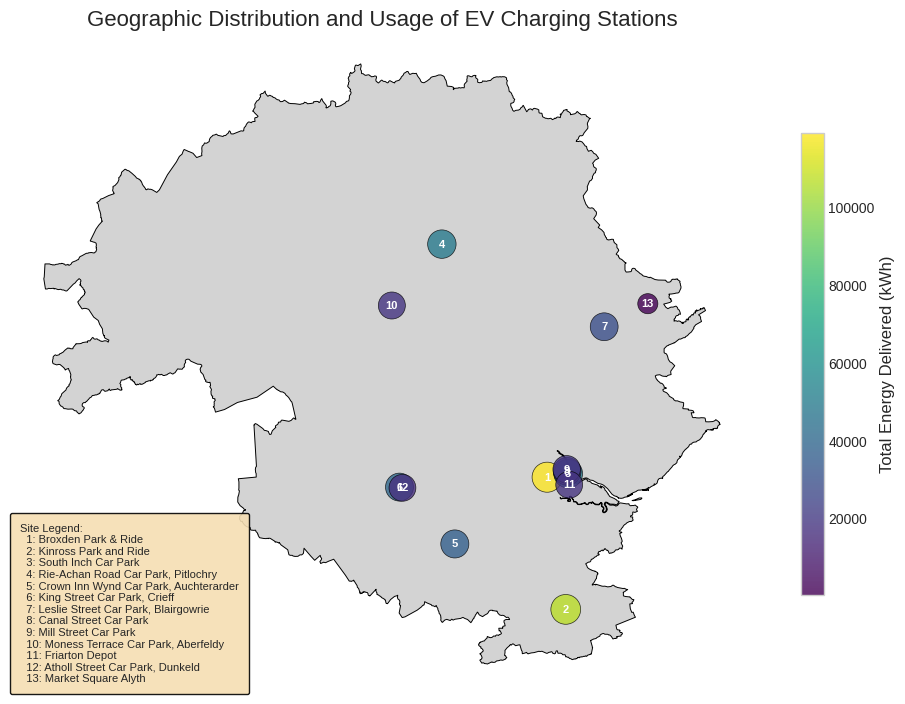


✅ Final map with numbered legend saved successfully to: project_visualizations/pkc_final_usage_map_with_legend.png


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import geopandas as gpd
from pyproj import Transformer
from adjustText import adjust_text
from matplotlib.offsetbox import AnchoredText

# =================================
# 1. SETUP
# =================================

# Define the directory where the map will be saved
SAVE_DIR = "project_visualizations"
if not os.path.exists(SAVE_DIR):
    os.makedirs(SAVE_DIR)
print(f"The final map will be saved to the '{SAVE_DIR}' directory.")

# --- Prerequisites ---
# This script assumes the 'df' DataFrame is available in your notebook's memory.

# =================================
# 2. DATA PREPARATION & MERGING
# =================================

def prepare_map_data(df_sessions, locations_csv_path):
    """
    Cleans, merges, and transforms coordinate data for mapping.
    """
    print("\n--- Preparing data for mapping ---")
    try:
        # Load the official PKC charger locations
        df_locations = pd.read_csv(locations_csv_path)

        # --- Rename the site and coordinate columns to a standard format ---
        df_locations.rename(columns={'CP_Name': 'Site', 'x': 'longitude', 'y': 'latitude'}, inplace=True)

        # --- Force data types and handle missing values ---
        df_locations['Site'] = df_locations['Site'].astype(str).str.strip()
        df_sessions['Site'] = df_sessions['Site'].astype(str).str.strip()
        df_locations['latitude'] = pd.to_numeric(df_locations['latitude'], errors='coerce')
        df_locations['longitude'] = pd.to_numeric(df_locations['longitude'], errors='coerce')
        df_locations.dropna(subset=['latitude', 'longitude'], inplace=True)

        # --- Coordinate Transformation (British National Grid to WGS84) ---
        transformer = Transformer.from_crs("EPSG:27700", "EPSG:4326", always_xy=True)
        df_locations['lon_wgs84'], df_locations['lat_wgs84'] = transformer.transform(
            df_locations['longitude'].values,
            df_locations['latitude'].values
        )
        print(f"✅ Loaded and processed {len(df_locations)} charger locations.")

        # --- Definitive Manual Mapping ---
        location_name_map = {
            'ACCESS ROAD INTO PARK AND RIDE BROXDEN AVENUE': 'Broxden Park & Ride',
            'CAR PARK OFF JUNCTION ROAD PARK AND RIDE': 'Kinross Park and Ride',
            'CAR PARK OFF SHORE ROAD AT SOUTH INCH': 'South Inch Car Park',
            'CANAL STREETMULTY STOREY CAR PARK': 'Canal Street Car Park',
            'CAR PARK MULTI STOREY OFF CANAL STREET': 'Canal Street Car Park',
            'CAR PARK OFF KING STREET TOWARDS GALVELMORE STREET': 'King Street Car Park, Crieff',
            'CAR PARK OFF HIGH STREET': 'Crown Inn Wynd Car Park, Auchterarder',
            'CAR PARK OFF CROFT LANE AT LESLIE STREET': 'Leslie Street Car Park, Blairgowrie',
            'CAR PARK OFF RIE-ACHAN ROAD': 'Rie-Achan Road Car Park, Pitlochry',
            'CAR PARK OFF MILL STREET EAST': 'Mill Street Car Park',
            'CAR PARK OFF MONESS TERRACE': 'Moness Terrace Car Park, Aberfeldy',
            'FRIARTON WASTE TRANSFER STATION': 'Friarton Depot',
            'CAR PARK IN MARKET SQUARE': 'Market Square Alyth',
            'LEADENFLOWER CAR PARK': 'Atholl Street Car Park, Dunkeld'
        }
        df_locations['Site'] = df_locations['Site'].replace(location_name_map)

        session_name_map = {
            'Broxden Park & Ride, Perth': 'Broxden Park & Ride',
            'Kinross Park and Ride, Kinross': 'Kinross Park and Ride',
            'South Inch Car Park, Perth': 'South Inch Car Park',
            'Canal Street Car Park 3rd floor, Perth': 'Canal Street Car Park',
            'Canal Street Car Park 3rd floor': 'Canal Street Car Park',
            'Mill Street, Perth': 'Mill Street Car Park',
            'Friarton Depot, Perth': 'Friarton Depot'
        }
        df_sessions['Site'] = df_sessions['Site'].replace(session_name_map)

        # Calculate usage statistics per site
        site_usage = df_sessions.groupby('Site').agg(
            TotalEnergy_kWh=('Total_kWh', 'sum'),
            NumberOfSessions=('CP_ID', 'count')
        ).reset_index()

        # Merge the usage data with the location data
        merged_data = pd.merge(site_usage, df_locations[['Site', 'lat_wgs84', 'lon_wgs84']], on='Site', how='inner')
        merged_data.drop_duplicates(subset='Site', inplace=True)

        print(f"✅ Successfully merged usage data with {len(merged_data)} geolocated sites.")
        return merged_data

    except Exception as e:
        print(f"❌ Could not prepare map data. Error: {e}")
        return None

# =================================
# 3. FINAL MAP GENERATION WITH NUMBERED LEGEND
# =================================

def create_final_map(map_data, boundary_file_path, save_dir):
    """
    Generates and saves a static map with a real boundary background and a numbered legend for all sites.
    """
    print("\n--- Generating final map visualization with numbered legend ---")
    try:
        # --- Load and prepare the boundary data ---
        gdf_boundaries = gpd.read_file(boundary_file_path)
        council_name_col = 'LAD13NM'
        pkc_boundary = gdf_boundaries[gdf_boundaries[council_name_col] == 'Perth and Kinross']

        # --- Convert charger data to a GeoDataFrame ---
        gdf_chargers = gpd.GeoDataFrame(
            map_data,
            geometry=gpd.points_from_xy(map_data.lon_wgs84, map_data.lat_wgs84),
            crs="EPSG:4326"
        ).sort_values(by='NumberOfSessions', ascending=False).reset_index(drop=True)

        # --- Plotting ---
        plt.style.use('seaborn-v0_8-whitegrid')
        fig, ax = plt.subplots(1, 1, figsize=(12, 12))

        # Plot the main PKC boundary
        pkc_boundary.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.7)

        # Overlay all charger locations
        scatter = ax.scatter(
            gdf_chargers.geometry.x, gdf_chargers.geometry.y,
            s=np.log(gdf_chargers['NumberOfSessions'] + 1) * 50,
            c=gdf_chargers['TotalEnergy_kWh'],
            cmap='viridis', alpha=0.8, edgecolors='k', linewidth=0.5, zorder=10
        )
        cbar = plt.colorbar(scatter, ax=ax, shrink=0.5)
        cbar.set_label('Total Energy Delivered (kWh)', fontsize=12)

        # --- Add Numbered Labels to Map and Create Legend Text ---
        legend_texts = ["Site Legend:"]
        texts_to_adjust = []
        for i, (idx, site) in enumerate(gdf_chargers.iterrows()):
            label_num = i + 1
            texts_to_adjust.append(
                ax.text(site.geometry.x, site.geometry.y, str(label_num), color='white',
                        ha='center', va='center', fontsize=8, weight='bold', zorder=11)
            )
            legend_texts.append(f"  {label_num}: {site['Site']}")

        # Add the legend box to the main plot
        legend_box = AnchoredText("\n".join(legend_texts), loc='lower left', frameon=True,
                                  prop=dict(size=8, ha='left'))
        legend_box.patch.set_boxstyle("round,pad=0.5,rounding_size=0.2")
        legend_box.patch.set_facecolor("wheat")
        legend_box.patch.set_alpha(0.9)
        ax.add_artist(legend_box)

        ax.set_title('Geographic Distribution and Usage of EV Charging Stations', fontsize=16)
        ax.set_axis_off()

        # Save the map
        map_path = os.path.join(save_dir, "pkc_final_usage_map_with_legend.png")
        plt.savefig(map_path, dpi=1200, bbox_inches='tight')
        plt.show()
        plt.close()

        print(f"\n✅ Final map with numbered legend saved successfully to: {map_path}")

    except Exception as e:
        print(f"❌ Could not create the final map. Error: {e}")

# =================================
# 4. MAIN EXECUTION
# =================================

if __name__ == "__main__":
    locations_file = "/content/drive/MyDrive/CIM/Dissertation/Perth and Kinross Council, UK (Public Charging)/Electric_Vehicle_Charging_Points_2765336306591006216.csv"
    local_wards_file = "ward_boundaries.geojson"

    if 'df' in locals() or 'df' in globals():
        if os.path.exists(locations_file) and os.path.exists(local_wards_file):
            map_data = prepare_map_data(df, locations_file)
            if map_data is not None and not map_data.empty:
                create_final_map(map_data, local_wards_file, SAVE_DIR)
            elif map_data is not None and map_data.empty:
                print("⚠️  Warning: No sites could be matched between usage data and location data. Map cannot be generated.")
        else:
            print(f"❌ ERROR: Required file not found. Please ensure both '{locations_file}' and '{local_wards_file}' exist.")
    else:
        print("❌ ERROR: The main 'df' DataFrame is not available in memory. Please run your data loading and cleaning cells first.")

In [ ]:
import pandas as pd

# Define the correct file path to your dataset
locations_file_path = "/content/drive/MyDrive/CIM/Dissertation/Perth and Kinross Council, UK (Public Charging)/Electric_Vehicle_Charging_Points_2765336306591006216.csv"

# Load the dataset into a pandas DataFrame
print(f"--- Loading data from: {locations_file_path} ---")
df_locations = pd.read_csv(locations_file_path)

# --- Preview the data ---

# Display the first 5 rows to see the structure
print("\n--- First 5 Rows of the Dataset ---")
print(df_locations.head(10))

# Display a summary of all columns and their data types
print("\n--- Dataset Info (Columns and Data Types) ---")
df_locations.info()

--- Loading data from: /content/drive/MyDrive/CIM/Dissertation/Perth and Kinross Council, UK (Public Charging)/Electric_Vehicle_Charging_Points_2765336306591006216.csv ---

--- First 5 Rows of the Dataset ---
   MI_PRINX       Id                                            CP_Name         ADDRESS CH_SPEED  \
0         1  50995.0                        CAR PARK OFF MONESS TERRACE  MONESS TERRACE    RAPID   
1         2  50811.0                        CAR PARK OFF MONESS TERRACE  MONESS TERRACE     FAST   
2         3  51261.0                          CAR PARK IN MARKET SQUARE   MARKET SQUARE     FAST   
3         4  51250.0                           CAR PARK OFF HIGH STREET  CROWN INN WYND    RAPID   
4         5  50994.0           CAR PARK OFF CROFT LANE AT LESLIE STREET   LESLIE STREET    RAPID   
5         6  50993.0  CAR PARK OFF KING STREET TOWARDS GALVELMORE ST...     KING STREET    RAPID   
6         7  50813.0  CAR PARK OFF KING STREET TOWARDS GALVELMORE ST...     KING STREET    

In [ ]:
# This code assumes 'df_locations' DataFrame from the previous step is in memory.

# --- Step 2b: Remove rows with missing CP_Name ---

print("\n--- Checking for missing values in CP_Name ---")
# Store the number of rows before this cleaning step
rows_before_cp_name_clean = len(df_locations)

# Remove rows where the 'CP_Name' is missing.
df_locations.dropna(subset=['CP_Name'], inplace=True)

# Print the shape after cleaning
print(f"\nNumber of rows before removing missing CP_Name: {rows_before_cp_name_clean}")
print(f"Number of rows after removing missing CP_Name: {len(df_locations)}")
print(f"Number of rows removed: {rows_before_cp_name_clean - len(df_locations)}")

print("\n✅ Data cleaning for CP_Name complete.")


--- Checking for missing values in CP_Name ---

Number of rows before removing missing CP_Name: 45
Number of rows after removing missing CP_Name: 42
Number of rows removed: 3

✅ Data cleaning for CP_Name complete.


The map will be saved to the 'project_visualizations' directory.

--- Preparing charger location data ---
✅ Loaded and processed 45 charger locations.

--- Generating charger speed distribution map ---


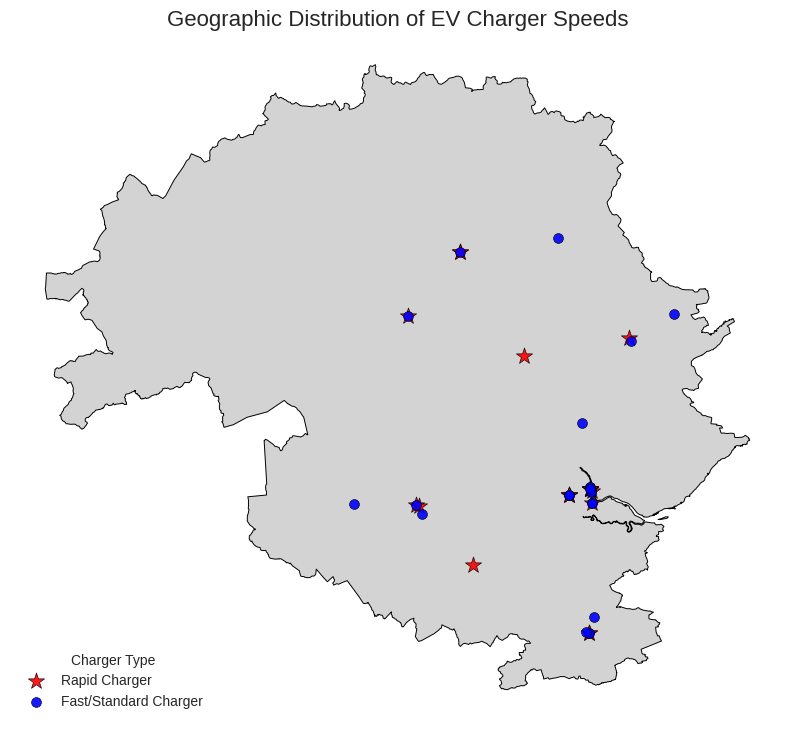


✅ Distribution map saved successfully to: project_visualizations/map_geographic_equity_by_speed.png


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import geopandas as gpd
from pyproj import Transformer

# =================================
# 1. SETUP
# =================================

# Define the directory where the map will be saved
SAVE_DIR = "project_visualizations"
if not os.path.exists(SAVE_DIR):
    os.makedirs(SAVE_DIR)
print(f"The map will be saved to the '{SAVE_DIR}' directory.")

# --- File Paths ---
# This script assumes the necessary files are available.
LOCATIONS_FILE = "/content/drive/MyDrive/CIM/Dissertation/Perth and Kinross Council, UK (Public Charging)/Electric_Vehicle_Charging_Points_2765336306591006216.csv"
BOUNDARY_FILE = "ward_boundaries.geojson"

# =================================
# 2. DATA PREPARATION
# =================================

def load_and_prepare_charger_data(locations_csv_path):
    """
    Loads and prepares the current list of all charger locations for mapping.
    """
    print("\n--- Preparing charger location data ---")
    try:
        # Load the official PKC charger locations
        df_locations = pd.read_csv(locations_csv_path)

        # --- Rename the coordinate columns and force numeric types ---
        df_locations.rename(columns={'x': 'longitude', 'y': 'latitude'}, inplace=True)
        df_locations['latitude'] = pd.to_numeric(df_locations['latitude'], errors='coerce')
        df_locations['longitude'] = pd.to_numeric(df_locations['longitude'], errors='coerce')
        df_locations.dropna(subset=['latitude', 'longitude'], inplace=True)

        # --- Coordinate Transformation (British National Grid to WGS84) ---
        transformer = Transformer.from_crs("EPSG:27700", "EPSG:4326", always_xy=True)
        df_locations['lon_wgs84'], df_locations['lat_wgs84'] = transformer.transform(
            df_locations['longitude'].values,
            df_locations['latitude'].values
        )

        # --- Categorize Charger Type based on Speed ---
        # This is the key step for this specific analysis.
        if 'CH_SPEED' in df_locations.columns:
            # We define 'Rapid' as anything with "RAPID" in the description, as it's more reliable than parsing kW.
            df_locations['ChargerType'] = np.where(df_locations['CH_SPEED'].str.contains("RAPID", case=False),
                                                   'Rapid',
                                                   'Fast/Standard')
        else:
            df_locations['ChargerType'] = 'Unknown'

        print(f"✅ Loaded and processed {len(df_locations)} charger locations.")
        return df_locations

    except Exception as e:
        print(f"❌ Could not prepare charger data. Error: {e}")
        return None

# =================================
# 3. MAP GENERATION
# =================================

def create_distribution_map(charger_data, boundary_file_path, save_dir):
    """
    Generates and saves a static map showing the distribution of charger types.
    """
    print("\n--- Generating charger speed distribution map ---")
    try:
        # --- Load and prepare the boundary data ---
        gdf_boundaries = gpd.read_file(boundary_file_path)
        pkc_boundary = gdf_boundaries[gdf_boundaries['LAD13NM'] == 'Perth and Kinross']

        # --- Convert charger data to a GeoDataFrame ---
        gdf_chargers = gpd.GeoDataFrame(
            charger_data,
            geometry=gpd.points_from_xy(charger_data.lon_wgs84, charger_data.lat_wgs84),
            crs="EPSG:4326"
        )

        # --- Plotting ---
        plt.style.use('seaborn-v0_8-whitegrid')
        fig, ax = plt.subplots(1, 1, figsize=(10, 12))

        # Plot the PKC boundary as the base layer
        pkc_boundary.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.7)

        # Define markers and colors for different charger types
        type_aesthetics = {
            'Rapid': {'marker': '*', 'color': 'red', 's': 150, 'label': 'Rapid Charger'},
            'Fast/Standard': {'marker': 'o', 'color': 'blue', 's': 50, 'label': 'Fast/Standard Charger'}
        }

        # Plot each charger type separately to create a clear legend
        for charger_type, aesthetics in type_aesthetics.items():
            gdf_subset = gdf_chargers[gdf_chargers['ChargerType'] == charger_type]
            if not gdf_subset.empty:
                ax.scatter(
                    gdf_subset.geometry.x,
                    gdf_subset.geometry.y,
                    marker=aesthetics['marker'],
                    s=aesthetics['s'],
                    c=aesthetics['color'],
                    label=aesthetics['label'],
                    alpha=0.9,
                    edgecolors='k',
                    linewidth=0.5,
                    zorder=10
                )

        ax.set_title('Geographic Distribution of EV Charger Speeds', fontsize=16)
        ax.set_axis_off() # Hide the lat/lon axes for a clean map
        ax.legend(title="Charger Type", loc='lower left', fancybox=True, shadow=True)

        # Save the map to a file
        map_path = os.path.join(save_dir, "map_geographic_equity_by_speed.png")
        plt.savefig(map_path, dpi=1200, bbox_inches='tight')
        plt.show()
        plt.close()

        print(f"\n✅ Distribution map saved successfully to: {map_path}")

    except Exception as e:
        print(f"❌ Could not create the distribution map. Error: {e}")

# =================================
# 4. MAIN EXECUTION
# =================================

if __name__ == "__main__":
    if os.path.exists(LOCATIONS_FILE) and os.path.exists(BOUNDARY_FILE):
        # Run the full pipeline
        charger_data = load_and_prepare_charger_data(LOCATIONS_FILE)
        if charger_data is not None:
            create_distribution_map(charger_data, BOUNDARY_FILE, SAVE_DIR)
    else:
        print(f"❌ ERROR: Required file not found. Please ensure both '{LOCATIONS_FILE}' and '{BOUNDARY_FILE}' exist.")

Overall Interpretation
The map reveals a "hub and spoke" strategy for infrastructure deployment. There is a clear concentration of chargers in the urban center of Perth, with "spokes" of infrastructure extending out to serve key towns and tourist routes. While this provides good coverage for major population centers and travel corridors, it also highlights potential gaps in service for more remote, rural areas.

Key Observations and Discussion Points:
Urban Concentration: The densest cluster of both Rapid (red stars) and Fast/Standard (blue circles) chargers is located in and around the city of Perth in the south-east of the region. This is logical, as it serves the largest population center and the highest traffic areas.

Strategic Placement of Rapid Chargers: The red stars are not just in Perth. They are strategically placed in key towns along what are likely major A-roads (e.g., Auchterarder, Crieff, Dunkeld, Pitlochry).

Socio-Technical Insight: This is a deliberate policy to support longer-distance travel and tourism. It ensures that drivers can travel through the region with confidence, knowing they can get a quick top-up in major towns. This is a positive finding regarding enabling EV use beyond local commuting.

The Rural "Charging Desert" Question: While there is coverage in smaller towns, the vast northern and western parts of the region have very sparse infrastructure.

Socio-Technical Insight: This is the core of your geographic equity analysis. A resident living in the north-western part of the council area has significantly poorer access to public charging than someone in Perth. This could be a major barrier to EV adoption for rural communities, creating a two-tiered system where EVs are practical for urban dwellers but not for those in more remote areas.

How to Use This in Your Dissertation:
Argument: You can argue that while the council has successfully supported major transport routes, a significant geographic disparity remains.

Evidence: Use this map as "Figure X" to visually prove your point. You can state, "As shown in Figure X, the distribution of high-speed Rapid chargers is primarily concentrated along the A9 corridor and within the Perth urban area, leaving large rural expanses underserved."

Recommendation: This leads directly to a policy recommendation. For example: "To ensure equitable access and encourage rural EV adoption, a future phase of infrastructure deployment should focus on placing at least one Rapid or Fast charger in key villages in the currently underserved north-western region."

The analysis chart will be saved to the 'project_visualizations' directory.

--- Preparing data for economic accessibility analysis ---
✅ Successfully loaded and processed data for 42 charging points.

--- Generating economic accessibility chart ---


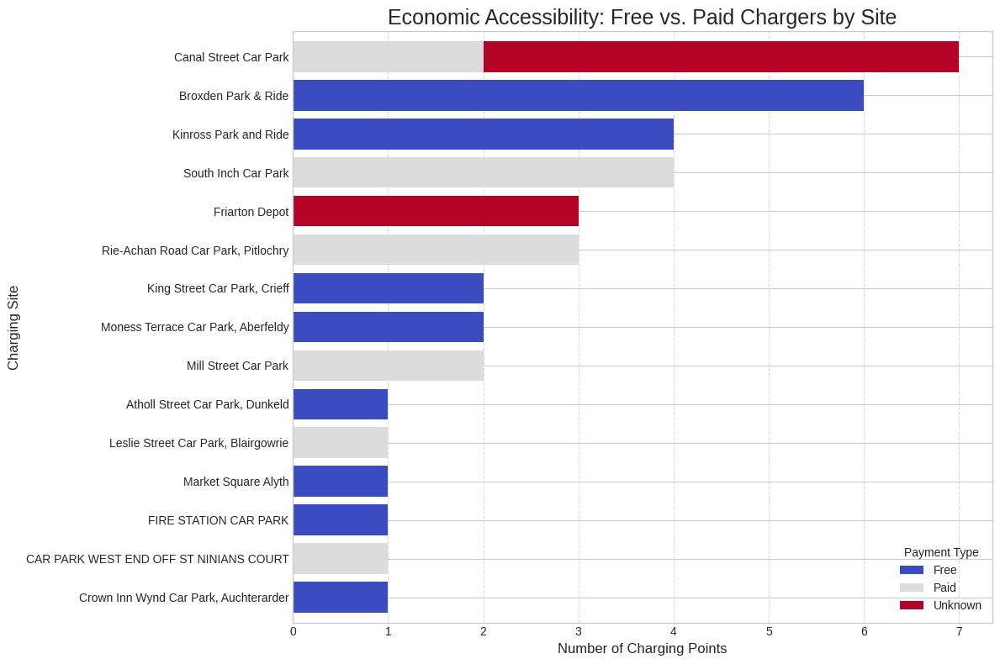


✅ Economic accessibility chart saved successfully to: project_visualizations/economic_accessibility_by_site.png


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os

# =================================
# 1. SETUP
# =================================

# Define the directory where the plot will be saved
SAVE_DIR = "project_visualizations"
if not os.path.exists(SAVE_DIR):
    os.makedirs(SAVE_DIR)
print(f"The analysis chart will be saved to the '{SAVE_DIR}' directory.")

# --- File Path ---
LOCATIONS_FILE = "/content/drive/MyDrive/CIM/Dissertation/Perth and Kinross Council, UK (Public Charging)/Electric_Vehicle_Charging_Points_2765336306591006216.csv"

# =================================
# 2. DATA PREPARATION
# =================================

def prepare_economic_analysis_data(locations_csv_path):
    """
    Loads and prepares the current list of all charger locations for economic analysis.
    """
    print("\n--- Preparing data for economic accessibility analysis ---")
    try:
        # Load the official PKC charger locations
        df_locations = pd.read_csv(locations_csv_path)

        # --- NEW: Remove rows where the charger name is missing before any processing ---
        df_locations.dropna(subset=['CP_Name'], inplace=True)

        # --- Standardize column names ---
        df_locations.rename(columns={'CP_Name': 'Site'}, inplace=True)
        df_locations['Site'] = df_locations['Site'].astype(str).str.strip()

        # --- Clean and standardize site names ---
        location_name_map = {
            'ACCESS ROAD INTO PARK AND RIDE BROXDEN AVENUE': 'Broxden Park & Ride',
            'CAR PARK OFF JUNCTION ROAD PARK AND RIDE': 'Kinross Park and Ride',
            'CAR PARK OFF SHORE ROAD AT SOUTH INCH': 'South Inch Car Park',
            'CANAL STREETMULTY STOREY CAR PARK': 'Canal Street Car Park',
            'CAR PARK MULTI STOREY OFF CANAL STREET': 'Canal Street Car Park',
            'CAR PARK OFF KING STREET TOWARDS GALVELMORE STREET': 'King Street Car Park, Crieff',
            'CAR PARK OFF HIGH STREET': 'Crown Inn Wynd Car Park, Auchterarder',
            'CAR PARK OFF CROFT LANE AT LESLIE STREET': 'Leslie Street Car Park, Blairgowrie',
            'CAR PARK OFF RIE-ACHAN ROAD': 'Rie-Achan Road Car Park, Pitlochry',
            'CAR PARK OFF MILL STREET EAST': 'Mill Street Car Park',
            'CAR PARK OFF MONESS TERRACE': 'Moness Terrace Car Park, Aberfeldy',
            'FRIARTON WASTE TRANSFER STATION': 'Friarton Depot',
            'CAR PARK IN MARKET SQUARE': 'Market Square Alyth',
            'LEADENFLOWER CAR PARK': 'Atholl Street Car Park, Dunkeld'
        }
        df_locations['Site'] = df_locations['Site'].replace(location_name_map)

        # --- Use the 'CP_CHARGE' column for payment type ---
        if 'CP_CHARGE' in df_locations.columns:
            df_locations['PaymentType'] = df_locations['CP_CHARGE'].str.strip().replace({
                'FREE': 'Free',
                'CHARGE': 'Paid'
            }).fillna('Unknown') # Handle any missing payment info
        else:
            df_locations['PaymentType'] = 'Unknown'

        print(f"✅ Successfully loaded and processed data for {len(df_locations)} charging points.")
        return df_locations

    except Exception as e:
        print(f"❌ Could not prepare analysis data. Error: {e}")
        return None

# =================================
# 3. BAR CHART GENERATION
# =================================

def create_economic_accessibility_chart(df_locations, save_dir):
    """
    Generates and saves a stacked bar chart showing the distribution of
    free vs. paid chargers at each major site.
    """
    print("\n--- Generating economic accessibility chart ---")
    # Removed the try-except block as requested to show the full traceback on error.

    # Create a cross-tabulation of site vs. payment type
    crosstab = pd.crosstab(df_locations['Site'], df_locations['PaymentType'])

    # We only want to plot sites with a significant number of chargers
    crosstab['total'] = crosstab.sum(axis=1)
    top_sites_crosstab = crosstab.sort_values('total', ascending=False).head(15)

    # --- CORRECTED: Sort by the total first, then drop the helper column ---
    # This ensures the plot is ordered correctly from busiest to least busy site.
    plot_data = top_sites_crosstab.sort_values(by='total', ascending=True)
    plot_data = plot_data.drop(columns='total')

    # Plotting
    plt.style.use('seaborn-v0_8-whitegrid')
    ax = plot_data.plot(
        kind='barh',
        stacked=True,
        figsize=(12, 8),
        colormap='coolwarm',
        width=0.8
    )

    ax.set_title('Economic Accessibility: Free vs. Paid Chargers by Site', fontsize=18)
    ax.set_xlabel('Number of Charging Points', fontsize=12)
    ax.set_ylabel('Charging Site', fontsize=12)
    ax.legend(title='Payment Type')
    ax.grid(axis='x', linestyle='--', alpha=0.7)

    plt.tight_layout()

    # Save the figure
    save_path = os.path.join(save_dir, "economic_accessibility_by_site.png")
    plt.savefig(save_path, dpi=1200)
    plt.show()
    plt.close()

    print(f"\n✅ Economic accessibility chart saved successfully to: {save_path}")


# =================================
# 4. MAIN EXECUTION
# =================================

if __name__ == "__main__":
    if os.path.exists(LOCATIONS_FILE):
        # Run the full pipeline
        df_locations = prepare_economic_analysis_data(LOCATIONS_FILE)
        if df_locations is not None:
            create_economic_accessibility_chart(df_locations, SAVE_DIR)
    else:
        print(f"❌ ERROR: The locations file was not found at '{LOCATIONS_FILE}'.")

Overall Interpretation
The most striking takeaway is that the public charging network in this dataset is overwhelmingly free to use. The vast majority of charging points, represented by the blue bars, do not require payment. This indicates a deliberate strategy by the council to encourage EV adoption by removing one of the primary cost barriers.

However, the distribution of these free chargers is not uniform, which leads to some interesting social and economic questions.

Breakdown by Key Sites:
Major Transport Hubs (Broxden & Kinross Park & Ride):

What it shows: These are two of the largest sites, and they are composed almost entirely of free chargers.

Interpretation for your dissertation: This is a strong policy signal. The council is actively incentivizing commuters to use Park & Ride facilities by offering free charging. This is a strategy to reduce city-center congestion and emissions. You can discuss this as a successful example of integrated transport and energy policy.

City Centre Hubs (Canal Street & South Inch Car Parks):

What it shows: These sites show a more complex picture. While they have many free chargers, they also have a significant number of "Paid" or "Unknown" chargers. Canal Street, the largest single site, has the most diverse mix.

Interpretation for your dissertation: This is where your socio-technical analysis becomes crucial. Why is there a mix of payment types in the city centre? It could be that the free chargers are lower power (Fast/Standard) while the paid ones are high-power (Rapid). Or it could be a strategy to manage demand in high-traffic areas. This "hybrid" model at key urban locations is a key finding.

Specialized Sites (Friarton Depot):

What it shows: This site is composed entirely of chargers with an "Unknown" payment type.

Interpretation for your dissertation: Given that this is a depot, these are likely fleet chargers not intended for the general public. The "Unknown" status might mean they are privately managed or have a different internal billing system. This highlights that not all "public" infrastructure serves the same purpose or user group.

Key Insights for Your Dissertation:
A "Freemium" Model: The network operates on a "freemium" model. Basic access is largely free, especially at strategic locations like Park & Rides, to encourage adoption. However, in the most high-demand urban locations, a paid or mixed model exists.

Data Quality as a Finding: The presence of the "Unknown" category is itself a finding. It points to inconsistencies in the public data, which is a real-world challenge for any analysis. You can mention this as a limitation and a recommendation for improvement in data collection practices.

The Question of Equity: This plot allows you to ask critical questions. Does providing free charging at Park & Ride facilities primarily benefit affluent commuters with EVs? Are there enough free chargers in residential areas for people who don't have private driveways? This visualization is the perfect starting point for that discussion.

In [ ]:
import pandas as pd
import numpy as np
import os

# =================================
# 1. SETUP
# =================================
# This script assumes the locations CSV file is available at the specified path.

LOCATIONS_FILE = "/content/drive/MyDrive/CIM/Dissertation/Perth and Kinross Council, UK (Public Charging)/Electric_Vehicle_Charging_Points_2765336306591006216.csv"

# =================================
# 2. DATA PREPARATION PIPELINE
# =================================

def create_prepared_locations_dataframe(locations_csv_path):
    """
    Loads and prepares the current list of all charger locations, returning a
    single, clean DataFrame for all subsequent analyses.
    """
    print("\n--- Preparing Final Analysis DataFrame ---")
    try:
        # Load the official PKC charger locations
        df = pd.read_csv(locations_csv_path)

        # --- a. Handle Missing Data ---
        # Remove rows where the charger name or coordinates are missing
        df.dropna(subset=['CP_Name', 'x', 'y'], inplace=True)

        # --- b. Standardize Column Names ---
        df.rename(columns={'CP_Name': 'Site', 'x': 'longitude', 'y': 'latitude'}, inplace=True)

        # --- c. Clean and Standardize Site Names ---
        df['Site'] = df['Site'].astype(str).str.strip()
        location_name_map = {
            'ACCESS ROAD INTO PARK AND RIDE BROXDEN AVENUE': 'Broxden Park & Ride',
            'CAR PARK OFF JUNCTION ROAD PARK AND RIDE': 'Kinross Park and Ride',
            'CAR PARK OFF SHORE ROAD AT SOUTH INCH': 'South Inch Car Park',
            'CANAL STREETMULTY STOREY CAR PARK': 'Canal Street Car Park',
            'CAR PARK MULTI STOREY OFF CANAL STREET': 'Canal Street Car Park',
            'CAR PARK OFF KING STREET TOWARDS GALVELMORE STREET': 'King Street Car Park, Crieff',
            'CAR PARK OFF HIGH STREET': 'Crown Inn Wynd Car Park, Auchterarder',
            'CAR PARK OFF CROFT LANE AT LESLIE STREET': 'Leslie Street Car Park, Blairgowrie',
            'CAR PARK OFF RIE-ACHAN ROAD': 'Rie-Achan Road Car Park, Pitlochry',
            'CAR PARK OFF MILL STREET EAST': 'Mill Street Car Park',
            'CAR PARK OFF MONESS TERRACE': 'Moness Terrace Car Park, Aberfeldy',
            'FRIARTON WASTE TRANSFER STATION': 'Friarton Depot',
            'CAR PARK IN MARKET SQUARE': 'Market Square Alyth',
            'LEADENFLOWER CAR PARK': 'Atholl Street Car Park, Dunkeld'
        }
        df['Site'] = df['Site'].replace(location_name_map)

        # --- d. Create Feature: ChargerType ---
        if 'CH_SPEED' in df.columns:
            df['ChargerType'] = np.where(df['CH_SPEED'].str.contains("RAPID", case=False), 'Rapid', 'Fast/Standard')
        else:
            df['ChargerType'] = 'Unknown'

        # --- e. Create Feature: PaymentType ---
        if 'CP_CHARGE' in df.columns:
            df['PaymentType'] = df['CP_CHARGE'].str.strip().replace({'FREE': 'Free', 'CHARGE': 'Paid'}).fillna('Unknown')
        else:
            df['PaymentType'] = 'Unknown'

        # --- f. Create Feature: LocationType ---
        def get_location_type(site_name):
            if "Park & Ride" in site_name: return "Transport Hub (Park & Ride)"
            if "Depot" in site_name: return "Depot / Fleet"
            if "Car Park" in site_name: return "Public Car Park"
            return "On-Street / Other"
        df['LocationType'] = df['Site'].apply(get_location_type)

        # --- g. Create Feature: MaxStayHrs ---
        if 'STAY' in df.columns:
            df['MaxStayHrs'] = pd.to_numeric(df['STAY'], errors='coerce').fillna(24) # Assume 24h for no limit
        else:
            df['MaxStayHrs'] = 24 # Default to 24h if column is missing

        print(f"✅ Successfully created the final prepared DataFrame with {len(df)} charging points.")
        return df

    except Exception as e:
        print(f"❌ Could not prepare analysis data. Error: {e}")
        return None

# =================================
# 3. MAIN EXECUTION
# =================================

if __name__ == "__main__":
    if os.path.exists(LOCATIONS_FILE):
        # Create the final, clean DataFrame
        df_locations_prepared = create_prepared_locations_dataframe(LOCATIONS_FILE)
        if df_locations_prepared is not None:
            print("\n--- Preview of Prepared Data ---")
            print(df_locations_prepared.head())
    else:
        print(f"❌ ERROR: The locations file was not found at '{LOCATIONS_FILE}'.")


--- Preparing Final Analysis DataFrame ---
✅ Successfully created the final prepared DataFrame with 42 charging points.

--- Preview of Prepared Data ---
   MI_PRINX       Id                                   Site         ADDRESS CH_SPEED                    CH_TYPE  \
0         1  50995.0     Moness Terrace Car Park, Aberfeldy  MONESS TERRACE    RAPID          COMPACT TRI RAPID   
1         2  50811.0     Moness Terrace Car Park, Aberfeldy  MONESS TERRACE     FAST  STANDARD DUAL OUTLET POST   
2         3  51261.0                    Market Square Alyth   MARKET SQUARE     FAST  STANDARD DUAL OUTLET POST   
3         4  51250.0  Crown Inn Wynd Car Park, Auchterarder  CROWN INN WYND    RAPID         QC45 RAPID CHARGER   
4         5  50994.0    Leslie Street Car Park, Blairgowrie   LESLIE STREET    RAPID          COMPACT TRI RAPID   

       LOCATION            CON_TYPE CP_CHARGE  USAGE_ OUTPUT1_kW  OUTPUT2_kW  STAY    longitude     latitude  \
0     ABERFELDY  TYPE 2;CHAdeMO;CCS      F


--- Generating Intended Use (Max Stay) plot ---


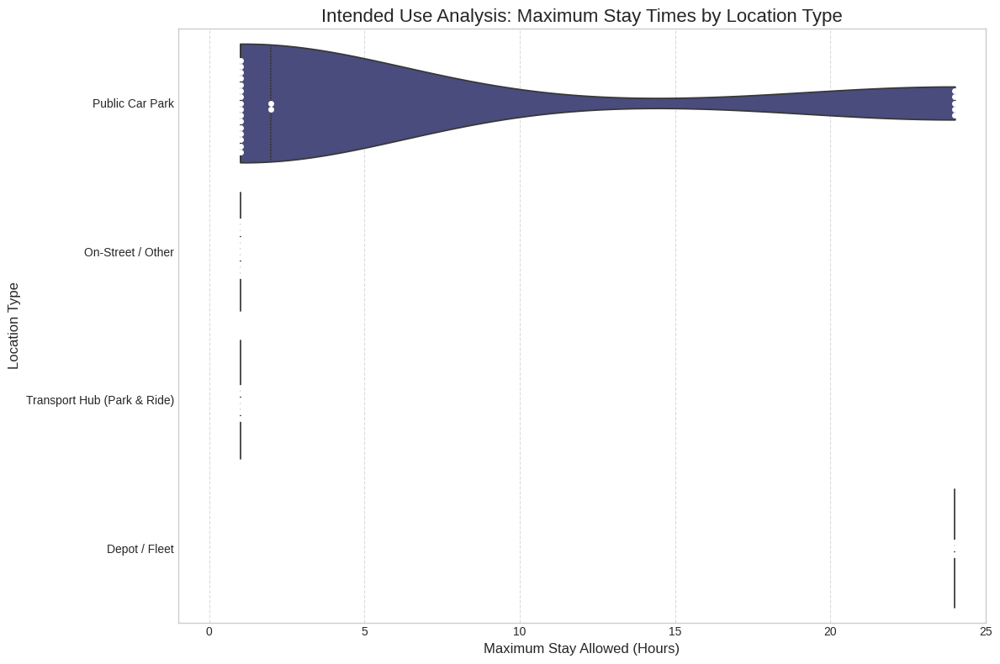


✅ Intended use chart saved successfully to: project_visualizations/intended_use_by_stay_time.png


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import os

# =================================
# 1. SETUP
# =================================
SAVE_DIR = "project_visualizations"
if not os.path.exists(SAVE_DIR):
    os.makedirs(SAVE_DIR)

# This script assumes the 'df_locations_prepared' DataFrame is already in memory.

# =================================
# 2. PLOT GENERATION (IMPROVED VISUALIZATION)
# =================================
print("\n--- Generating Intended Use (Max Stay) plot ---")
try:
    plt.style.use('seaborn-v0_8-whitegrid')
    plt.figure(figsize=(12, 8))

    # --- IMPROVED VISUALIZATION: Use a Violin Plot with Jitter ---
    # A violin plot is better for showing the distribution of points.
    # The inner 'quartile' shows the box plot ranges, and the swarm shows individual points.
    sns.violinplot(
        data=df_locations_prepared,
        x='MaxStayHrs',
        y='LocationType',
        orient='h',
        palette='viridis',
        inner='quartile', # Shows the quartiles inside the violin
        cut=0 # Prevents the violin from extending beyond the data range
    )

    # Overlay a swarm plot to show individual data points (jitter)
    sns.swarmplot(
        data=df_locations_prepared,
        x='MaxStayHrs',
        y='LocationType',
        orient='h',
        color='white',
        edgecolor='gray',
        size=5
    )

    plt.title('Intended Use Analysis: Maximum Stay Times by Location Type', fontsize=16)
    plt.xlabel('Maximum Stay Allowed (Hours)', fontsize=12)
    plt.ylabel('Location Type', fontsize=12)
    plt.grid(axis='x', linestyle='--', alpha=0.7)

    # Set a more reasonable x-axis limit to focus on the main distribution
    # We can cap it slightly above the most common short-stay limits.
    plt.xlim(-1, 25)

    plt.tight_layout()

    # Save the figure
    save_path = os.path.join(SAVE_DIR, "intended_use_by_stay_time.png")
    plt.savefig(save_path, dpi=1200)
    plt.show()
    plt.close()

    print(f"\n✅ Intended use chart saved successfully to: {save_path}")

except NameError:
    print("❌ ERROR: The 'df_locations_prepared' DataFrame was not found.")
    print("Please ensure you have successfully run the 'Final Data Preparation for Analysis' script first.")
except Exception as e:
    print(f"❌ Could not create the analysis chart. Error: {e}")

Overall Interpretation
The plot reveals a clear and deliberate strategy by the council to design different types of charging infrastructure for different social purposes. There is a strong distinction between infrastructure designed for short-term, transient use (like public car parks) and infrastructure for long-duration, depot-based charging.

Breakdown by Location Type:
Public Car Park:

What it shows: This is the most interesting category. The "violin" is very wide and heavily concentrated between 1 and 4 hours. The white dots (representing individual chargers) are all clustered here.

Interpretation: This indicates that the vast majority of chargers in public car parks are explicitly designed for short-stay users, such as shoppers or visitors. The goal is to encourage quick turnover, not all-day parking. The single outlier point at 24 hours represents a long-stay car park, but it is the exception, not the rule.

Transport Hub (Park & Ride) and On-Street / Other:

What it shows: Both of these categories have very thin violins, with all data points clustered at very short stay times (around 1-2 hours).

Interpretation: This is a very significant finding. It suggests that even at Park & Ride facilities, which are typically used by all-day commuters, the chargers are intended for rapid top-ups, not for commuters to leave their cars charging all day. This highlights a potential mismatch between infrastructure design and user needs.

Depot / Fleet:

What it shows: The data points are all clustered at the 24-hour mark.

Interpretation: This makes perfect sense. These chargers are not for the general public but for council vehicles or other fleets that are parked overnight. The 24-hour limit essentially means there is "no limit," allowing for slow, full charging.

Key Insights for Your Dissertation:
Focus on Transient Charging: The public-facing network is overwhelmingly designed to support transient charging (short trips, shopping) rather than solving the problem for residents without private driveways or all-day commuters.

The Commuter Problem: The short stay limits at Park & Ride hubs are a key socio-technical finding. You can argue that this infrastructure design does not currently serve the needs of commuters who might want to leave their car for 8-9 hours. This could be a barrier to EV adoption for this group.

Clear Policy Segmentation: The plot provides strong evidence that the council has different policies for different locations. Your dissertation can discuss the pros and cons of this approach—it ensures high turnover in busy car parks but may leave certain user groups (like commuters) underserved.


--- Generating Technology Equity (Connector Type) plot ---


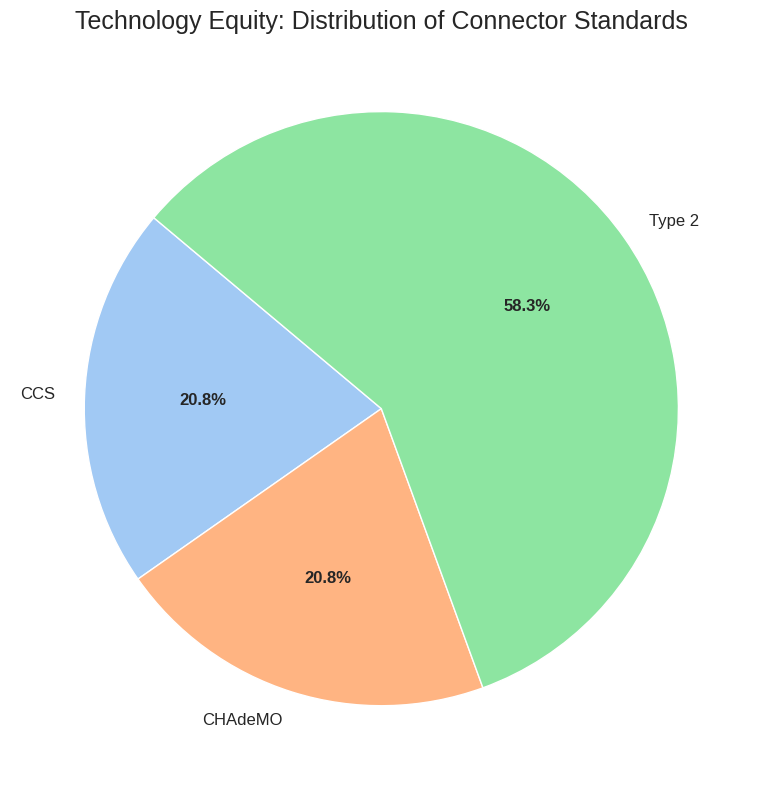


✅ Connector type distribution chart saved successfully to: project_visualizations/technology_equity_connector_types.png


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import os
import pandas as pd

# =================================
# 1. SETUP
# =================================
SAVE_DIR = "project_visualizations"
if not os.path.exists(SAVE_DIR):
    os.makedirs(SAVE_DIR)

# This script assumes the 'df_locations_prepared' DataFrame is already in memory.

# =================================
# 2. PLOT GENERATION
# =================================
print("\n--- Generating Technology Equity (Connector Type) plot ---")
try:
    # --- Data Analysis ---
    # The CON_TYPE column often contains multiple values separated by semicolons.
    # We need to count the presence of each key standard.
    # Note: A single charger can have multiple connectors.

    connector_counts = {
        'CCS': df_locations_prepared['CON_TYPE'].str.contains('CCS', case=False).sum(),
        'CHAdeMO': df_locations_prepared['CON_TYPE'].str.contains('CHAdeMO', case=False).sum(),
        'Type 2': df_locations_prepared['CON_TYPE'].str.contains('TYPE 2', case=False).sum()
    }

    # Convert to a pandas Series for easy plotting
    connector_series = pd.Series(connector_counts)

    # --- Visualization ---
    plt.style.use('seaborn-v0_8-whitegrid')
    plt.figure(figsize=(10, 8))

    # Create the pie chart
    wedges, texts, autotexts = plt.pie(
        connector_series,
        labels=connector_series.index,
        autopct='%1.1f%%',
        startangle=140,
        colors=sns.color_palette('pastel'),
        wedgeprops={'edgecolor': 'white', 'linewidth': 1}
    )

    # Improve text formatting
    plt.setp(autotexts, size=12, weight="bold")
    plt.setp(texts, size=12)

    plt.title('Technology Equity: Distribution of Connector Standards', fontsize=18)
    plt.ylabel('') # Hide the y-label for a pie chart

    plt.tight_layout()

    # Save the figure
    save_path = os.path.join(SAVE_DIR, "technology_equity_connector_types.png")
    plt.savefig(save_path, dpi=1200)
    plt.show()
    plt.close()

    print(f"\n✅ Connector type distribution chart saved successfully to: {save_path}")

except NameError:
    print("❌ ERROR: The 'df_locations_prepared' DataFrame was not found.")
    print("Please ensure you have successfully run the 'Final Data Preparation for Analysis' script first.")
except Exception as e:
    print(f"❌ Could not create the analysis chart. Error: {e}")

Overall Interpretation
The chart reveals a network that was well-designed for the EV market of the past but now faces a significant challenge in serving the market of the future. While it provides excellent coverage for all types of connectors currently on the road, the heavy investment in the older CHAdeMO standard creates a potential "technology bottleneck" for the growing number of modern EV drivers.

Breakdown by Connector Type:
Type 2 (58.3%): The Workhorse Connector

What it is: This is the universal standard for AC "Fast/Standard" charging across the UK and Europe. It's the most common plug type on the network.

Interpretation: This is a positive finding. It means that almost all EV drivers can use the majority of the charging sockets for slower, longer-duration charging (e.g., while parked for a few hours). This ensures broad basic compatibility.

CCS and CHAdeMO (20.8% each): The Rapid Charging Dilemma

What they are: These are the two competing standards for DC Rapid charging, which is essential for long journeys and quick top-ups.

CHAdeMO: The older standard, primarily used by the Nissan Leaf (one of the most popular early EVs) and some other Japanese models.

CCS: The modern standard used by virtually all new European, Korean, and American EVs (e.g., Tesla, VW, Hyundai, Kia, Ford).

Interpretation: The almost perfect 50/50 split between CCS and CHAdeMO is the most critical finding. It indicates that the network was built out during a time when the Nissan Leaf was a dominant force in the EV market. The council made a commendable effort to provide equal access for both types of vehicles.

Key Insights for Your Dissertation:
Legacy Support vs. Future Demand: The network is very equitable for current and past EV owners. However, the UK car market has decisively moved to the CCS standard. This means that as older CHAdeMO vehicles are retired, half of the rapid charging infrastructure will serve a shrinking fraction of the EV fleet.

The Future Bottleneck: This creates a significant "technology equity" issue for the future. A driver of a new Volkswagen ID.4 (which uses CCS) effectively sees only half of the available rapid chargers as usable. This can lead to queues and frustration, even if the CHAdeMO plug right next to it is empty.

Policy Recommendation: This analysis provides a strong, data-driven basis for a policy recommendation. You can argue that any future investment should prioritize adding more CCS connectors. This could involve either building new sites with a CCS-first approach or retrofitting existing rapid chargers to have more CCS plugs, ensuring the public investment remains relevant and serves the majority of future EV drivers.


--- Generating Infrastructure Density (Hubs vs. Spokes) plot ---


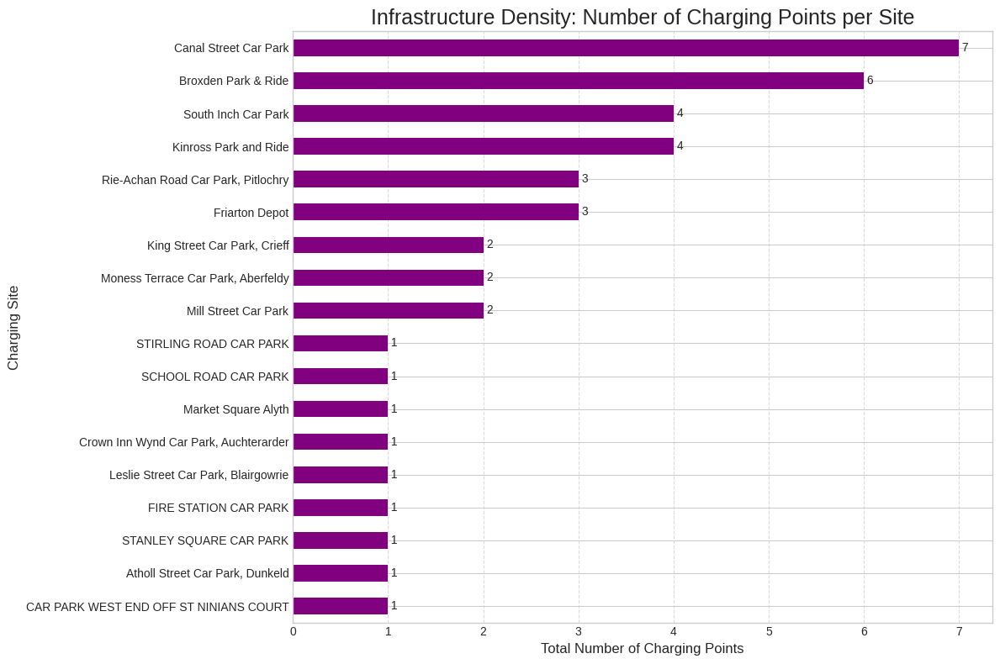


✅ Infrastructure density chart saved successfully to: project_visualizations/infrastructure_density_hubs_vs_spokes.png


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import os
import pandas as pd

# =================================
# 1. SETUP
# =================================
SAVE_DIR = "project_visualizations"
if not os.path.exists(SAVE_DIR):
    os.makedirs(SAVE_DIR)

# This script assumes the 'df_locations_prepared' DataFrame is already in memory.

# =================================
# 2. PLOT GENERATION
# =================================
print("\n--- Generating Infrastructure Density (Hubs vs. Spokes) plot ---")
try:
    # --- Data Analysis ---
    # Count the number of occurrences of each unique site name.
    # This gives us the number of charging points per site.
    site_counts = df_locations_prepared['Site'].value_counts()

    # --- Visualization ---
    plt.style.use('seaborn-v0_8-whitegrid')
    plt.figure(figsize=(12, 8))

    # Create the horizontal bar chart, sorting the values for a clean look.
    site_counts.sort_values().plot(kind='barh', color='purple')

    plt.title('Infrastructure Density: Number of Charging Points per Site', fontsize=18)
    plt.xlabel('Total Number of Charging Points', fontsize=12)
    plt.ylabel('Charging Site', fontsize=12)
    plt.grid(axis='x', linestyle='--', alpha=0.7)

    # Add data labels to the end of each bar for clarity
    for index, value in enumerate(site_counts.sort_values()):
        plt.text(value, index, f' {value}', va='center')

    plt.tight_layout()

    # Save the figure
    save_path = os.path.join(SAVE_DIR, "infrastructure_density_hubs_vs_spokes.png")
    plt.savefig(save_path, dpi=1200)
    plt.show()
    plt.close()

    print(f"\n✅ Infrastructure density chart saved successfully to: {save_path}")

except NameError:
    print("❌ ERROR: The 'df_locations_prepared' DataFrame was not found.")
    print("Please ensure you have successfully run the 'Final Data Preparation for Analysis' script first.")
except Exception as e:
    print(f"❌ Could not create the analysis chart. Error: {e}")

Overall Interpretation
The chart clearly demonstrates a "Hub and Spoke" deployment strategy. The council has focused on creating a small number of large, multi-charger "Hubs" at key strategic locations, while simultaneously deploying a large number of single-charger "Spokes" to maximize geographic coverage.

Breakdown of the Strategy:
The Hubs (High-Density Sites):

What it shows: You can see a few sites at the top of the chart with a significantly higher number of charging points than the rest. Canal Street Car Park (7 points), Broxden Park & Ride (6 points), and South Inch/Kinross Park and Ride (4 points each) are the clear hubs.

Interpretation: These are high-capacity sites designed to serve a large number of users simultaneously. Placing them in major car parks and transport interchanges is a deliberate strategy to support commuters and visitors in high-traffic areas. The key benefit of a hub is resilience; if one charger is broken or in use, others are available, leading to a better user experience.

The Spokes (Low-Density Sites):

What it shows: The majority of the sites listed have only one or two charging points. These are the "spokes" of the network.

Interpretation: The purpose of these single-charger sites is to provide maximum geographic reach. The goal is to ensure that as many towns and villages as possible have at least some access to a public charger, even if it's just one. This is crucial for encouraging EV adoption in more rural areas.

Key Insights for Your Dissertation:
A Deliberate Strategy: This is not a random distribution. The chart provides strong evidence of a thought-out strategy that balances the need for high capacity in urban centers with the need for broad coverage across the region.

The Resilience vs. Coverage Trade-Off: This is the core socio-technical point. The "Hubs" provide a reliable and convenient service. The "Spokes," however, represent a potential point of failure. If the single charger in a small town like Dunkeld or Alyth is out of order, it effectively removes that entire town from the public charging map, which can be a major issue for local residents and tourists.

Policy Discussion: This plot allows you to discuss the pros and cons of this strategy. Is it better to have fewer, larger, more reliable hubs, or more, smaller, but less resilient spokes? Your dissertation can use this chart as a basis to make recommendations for the next phase of infrastructure deployment.